In [1]:
!nvidia-smi

Thu Oct 30 10:47:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 566.07                 Driver Version: 566.07         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   62C    P0             11W /   60W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
%pip install "ultralytics<=8.3.40" supervision roboflow
# prevent ultralytics from tracking your activity
!yolo settings sync=False
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40  Python-3.11.9 torch-2.8.0+cpu CPU (11th Gen Intel Core(TM) i5-11400H 2.70GHz)
Setup complete  (12 CPUs, 15.7 GB RAM, 275.1/280.1 GB disk)


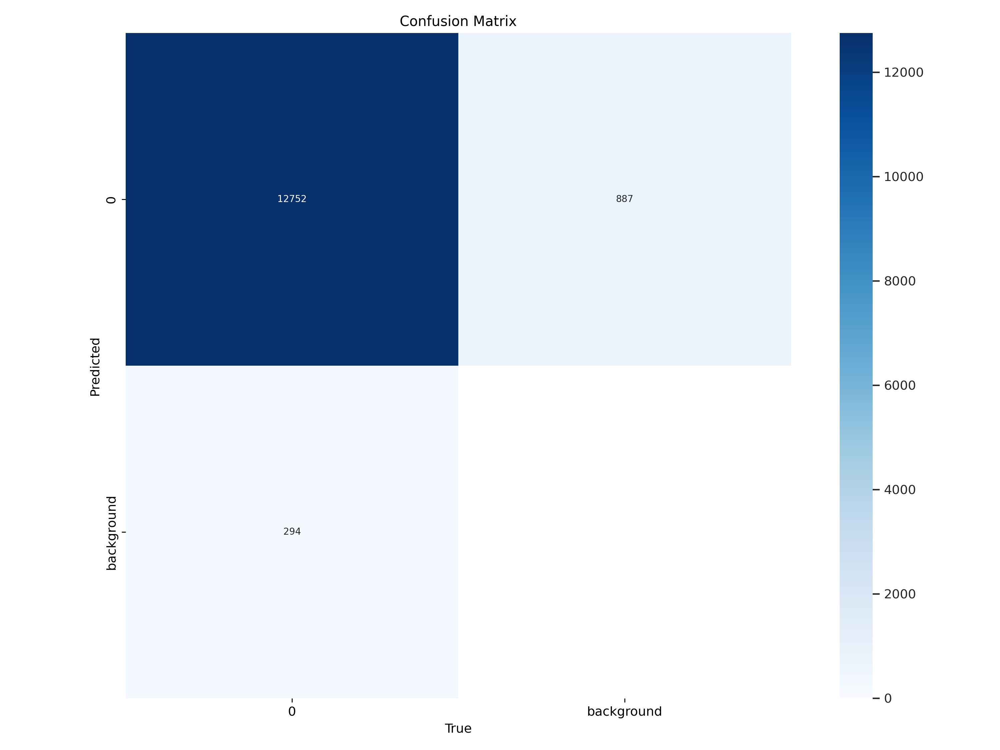

In [3]:
from IPython.display import Image as IPyImage
IPyImage(filename=f"runs/obb/train/confusion_matrix.png", width=640)

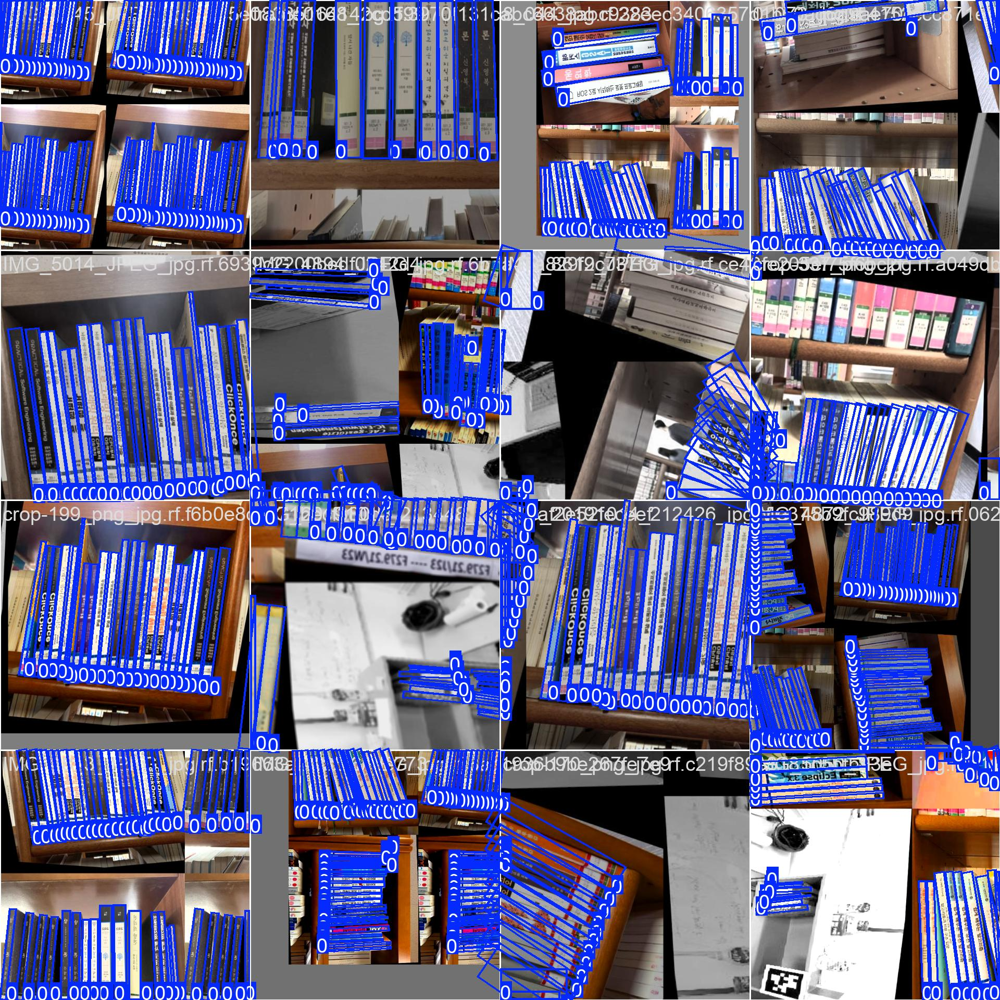

In [4]:
IPyImage(filename=f"runs/obb/train/val_batch0_labels.jpg", width=640)
IPyImage(filename=f"runs/obb/train/train_batch0.jpg", width= 640)

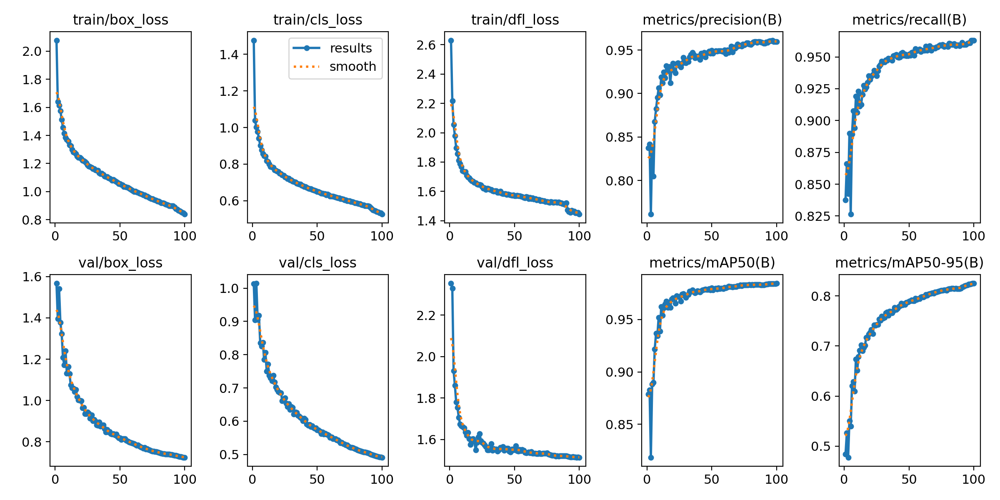

In [5]:
IPyImage(filename=f"runs/obb/train/results.png", width=640)

In [6]:
%pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iSyr0LL1uRkqusjfIpoz")
project = rf.workspace("polytech-hmvbr").project("book-spine-detection-2cci9-0u1sz")
version = project.version(8)
dataset = version.download("yolov8-obb")


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.
loading Roboflow workspace...
loading Roboflow project...


In [7]:
import yaml

with open(f'{dataset.location}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['path'] = dataset.location

with open(f'{dataset.location}/data.yaml', 'w') as file:
    yaml.dump(data, file, sort_keys=False)

In [8]:
from ultralytics import YOLO

model = YOLO("runs/obb/train/weights/best.pt")
metrics=model.val(data=f"{dataset.location}/data.yaml", imgsz=640, batch=16, save=True, save_txt=True, save_conf=True, plots=True)


Ultralytics 8.3.40  Python-3.11.9 torch-2.8.0+cpu CPU (11th Gen Intel Core(TM) i5-11400H 2.70GHz)
YOLO11n-obb summary (fused): 257 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs


val: Scanning C:\Users\Andy NT\OneDrive - Université Paris-Saclay\Stage_ET5\Yolov11n-obb\book-spine-detection-8\valid\labels.cache... 782 images, 0 backgrounds, 20 corrupt: 100%|██████████| 782/782 [00:00<?, ?it/s]

val: WARNING  C:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\book-spine-detection-8\valid\images\0_077_jpg.rf.6e178d9525c84a6aebfc37cf53cdf9ef.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.0042887 1.0020386]
val: WARNING  C:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\book-spine-detection-8\valid\images\5_086_jpg.rf.2f75e714fc5723a6da5e6f90cba042ed.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.0180466]
val: WARNING  C:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\book-spine-detection-8\valid\images\8_019_jpg.rf.7af3b45c701793e980d758e84e99868c.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [1.0255406]
val: WARNING  C:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\book-spine-detection-8\valid\images\8_026_jpg.rf.0adac9a50be2bd02adb6f87d09484075.jpg: ignoring corrupt image/label: no


'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [01:31<00:00,  1.90s/it]


                   all        762      13046      0.959      0.963      0.984      0.825
Speed: 1.6ms preprocess, 87.1ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs\obb\val4


In [9]:
%pip install inference 

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
%matplotlib inline


image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4139.JPG: 480x640 72.1ms
Speed: 4.0ms preprocess, 72.1ms inference, 10.0ms postprocess per image at shape (1, 3, 480, 640)


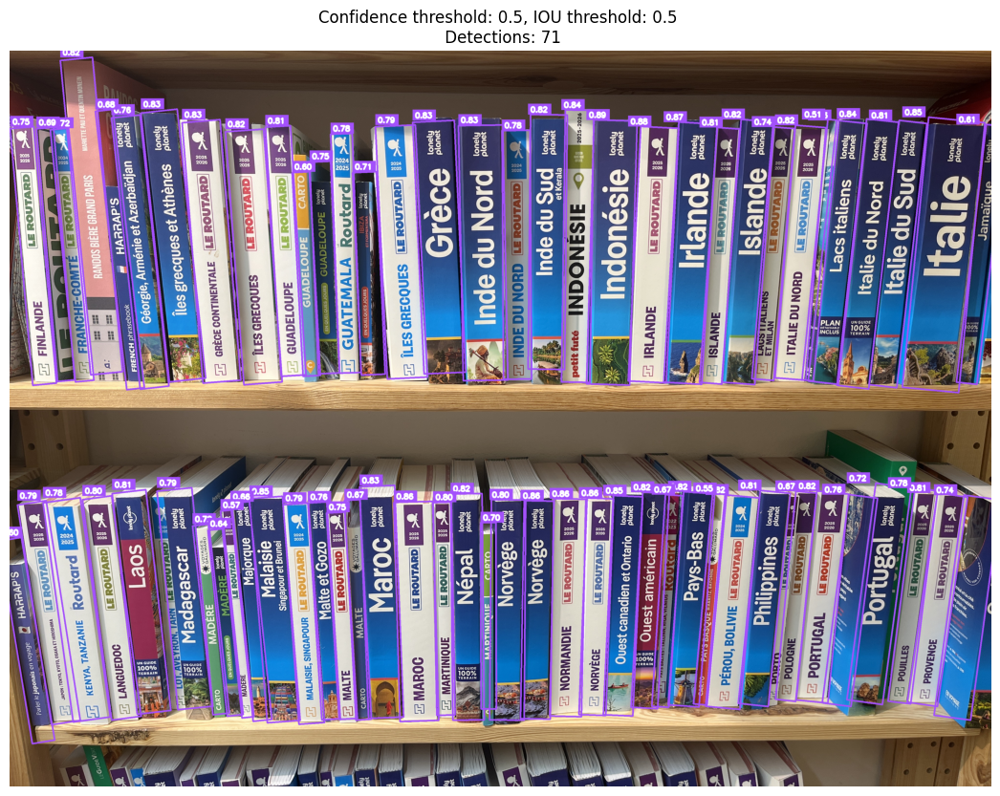

In [11]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt

# Load a model
model = YOLO("runs/obb/train/weights/best.pt")

# Read an image
file_name="Images/IMG_4139.JPG" # path to your image file
image = cv2.imread(file_name)

if image is None:
    raise FileNotFoundError(f"❌ Impossible de charger l'image : {file_name}")

# Define confidence and IOU thresholds
conf_threshold = 0.50
iou_threshold = 0.50

# Perform inference on the image
results = model.predict(file_name, conf=conf_threshold, iou=iou_threshold)   # set the confidence and IOU thresholds

# Convertir les résultats en objets Detections de Supervision 
# Supervision applique la non-max suppression (NMS) automatiquement
detections = sv.Detections.from_ultralytics(results[0])

# Créer les annotateurs pour les boîtes englobantes orientées et les étiquettes
oriented_bo_annotator=sv.OrientedBoxAnnotator(thickness=5)
label_annotator=sv.LabelAnnotator(text_scale=1, text_thickness=5)

# Annoter l'image avec les boîtes englobantes orientées
image_annotated = oriented_bo_annotator.annotate(
    scene=image.copy(), 
    detections=detections)

# Annoter l'image avec les score de confiance
image_annotated = label_annotator.annotate(
    scene=image_annotated, 
    detections=detections,
    labels=[f"{conf:0.2f}" for conf in detections.confidence]
)

# Afficher l'image annotée
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Confidence threshold: {conf_threshold}, IOU threshold: {iou_threshold} \n Detections: {len(detections)}")
plt.axis('off')
plt.show()



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4081.JPG: 480x640 41.4ms
Speed: 2.0ms preprocess, 41.4ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


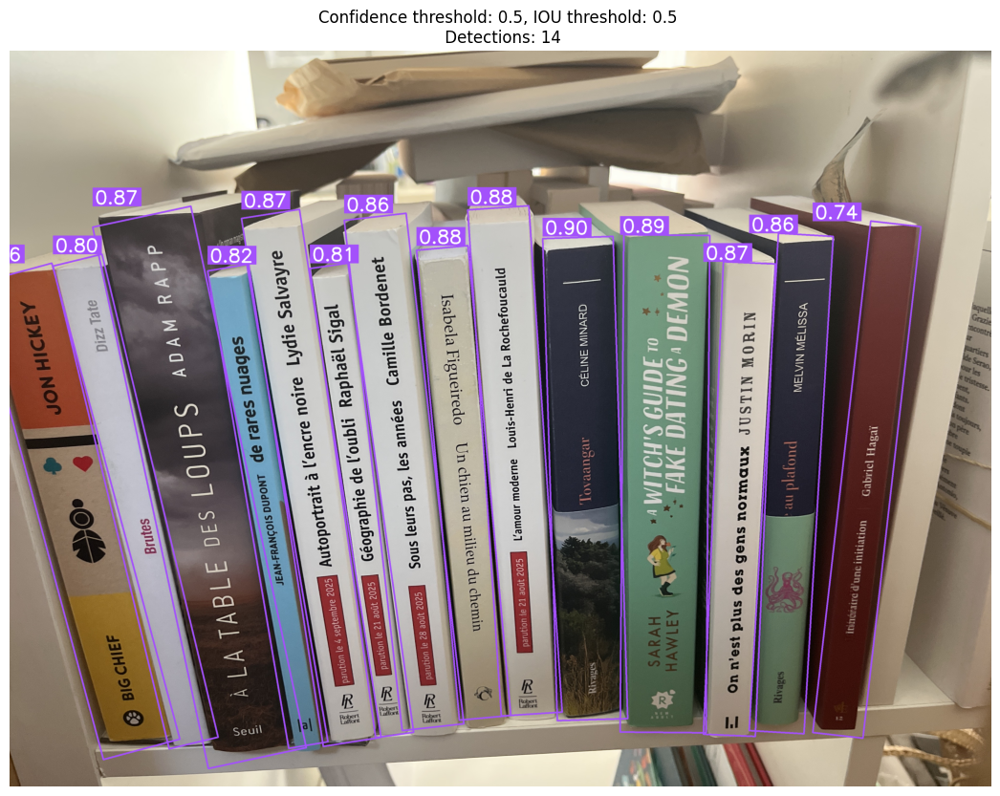

In [12]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt

# Load a model
model = YOLO("runs/obb/train/weights/best.pt")

# Read an image
file_name="Images/IMG_4081.JPG" # path to your image file
image = cv2.imread(file_name)

if image is None:
    raise FileNotFoundError(f"❌ Impossible de charger l'image : {file_name}")

# Define confidence and IOU thresholds
conf_threshold = 0.50
iou_threshold = 0.50

# Perform inference on the image
results = model.predict(file_name, conf=conf_threshold, iou=iou_threshold)   # set the confidence and IOU thresholds

# Convertir les résultats en objets Detections de Supervision 
# Supervision applique la non-max suppression (NMS) automatiquement
detections = sv.Detections.from_ultralytics(results[0])

# Créer les annotateurs pour les boîtes englobantes orientées et les étiquettes
oriented_bo_annotator=sv.OrientedBoxAnnotator(thickness=5)
label_annotator=sv.LabelAnnotator(text_scale=2.5, text_thickness=5)

# Annoter l'image avec les boîtes englobantes orientées
image_annotated = oriented_bo_annotator.annotate(
    scene=image.copy(), 
    detections=detections)

# Annoter l'image avec les score de confiance
image_annotated = label_annotator.annotate(
    scene=image_annotated, 
    detections=detections,
    labels=[f"{conf:0.2f}" for conf in detections.confidence]
)

# Afficher l'image annotée
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Confidence threshold: {conf_threshold}, IOU threshold: {iou_threshold} \n Detections: {len(detections)}")
plt.axis('off')
plt.show()


In [13]:
%pip install easyocr

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
# Colab : installe les libs si nécessaire
%pip install ultralytics supervision easyocr rapidfuzz requests --quiet

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
%pip install paddleocr
%pip install opencv-python matplotlib supervision ultralytics
%pip install paddlepaddle


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
%pip install torch torchvision torchaudio 

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Using CPU. Note: This module is much faster with a GPU.


[([[np.int32(1061), np.int32(801)], [np.int32(1177), np.int32(801)], [np.int32(1177), np.int32(1116)], [np.int32(1061), np.int32(1116)]], '8', np.float64(0.5811012212271329)), ([[np.int32(1757), np.int32(983)], [np.int32(1854), np.int32(983)], [np.int32(1854), np.int32(1227)], [np.int32(1757), np.int32(1227)]], 'E', np.float64(0.18890168824033626)), ([[np.int32(1984), np.int32(881)], [np.int32(2072), np.int32(881)], [np.int32(2072), np.int32(1247)], [np.int32(1984), np.int32(1247)]], '1', np.float64(0.8837814246789009)), ([[np.int32(2328), np.int32(1034)], [np.int32(2390), np.int32(1034)], [np.int32(2390), np.int32(1388)], [np.int32(2328), np.int32(1388)]], '1', np.float64(0.8960993311777656)), ([[np.int32(2609), np.int32(1169)], [np.int32(2673), np.int32(1169)], [np.int32(2673), np.int32(1246)], [np.int32(2609), np.int32(1246)]], '2', np.float64(0.6697426020388697)), ([[np.int32(2655), np.int32(822)], [np.int32(2814), np.int32(822)], [np.int32(2814), np.int32(1212)], [np.int32(2655), 

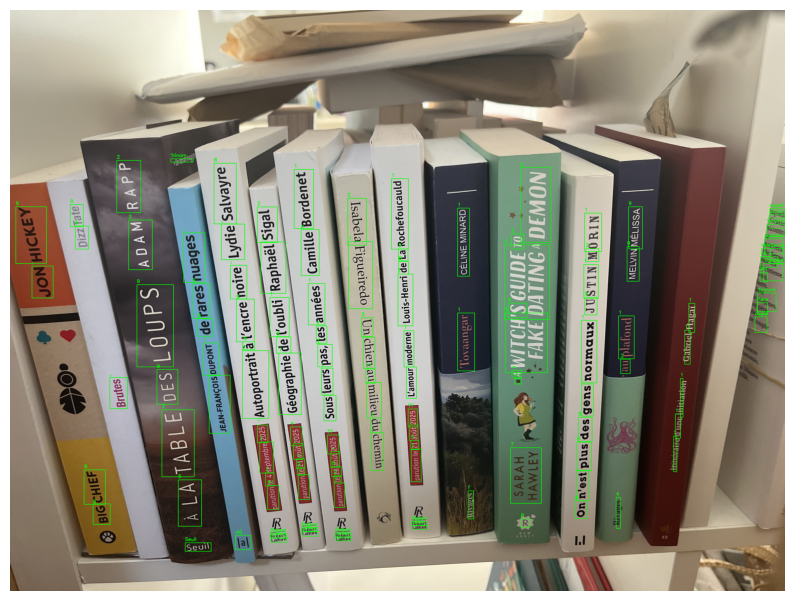

In [17]:
import easyocr
import cv2
from matplotlib import pyplot as plt
import numpy as np

# Charger une image
image_path = "Images/IMG_4081.JPG"
image = cv2.imread(image_path)

reader = easyocr.Reader(['fr', 'en'], gpu=False)  # gpu=True si tu as GPU
result = reader.readtext(image)
print(result)

# Afficher les résultats
for (bbox, text, prob) in result:
    (top_left, top_right, bottom_right, bottom_left) = bbox
    top_left = (int(top_left[0]), int(top_left[1]))
    bottom_right = (int(bottom_right[0]), int(bottom_right[1]))

    cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(image, text, (top_left[0], top_left[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print(f"Detected text: {text} (Confidence: {prob:.2f})")

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

In [18]:
# # Importation des librairies nécessaires
# import os                     # pour gérer les chemins/dossiers
# import math                   # pour trigonométrie (rotation des boîtes orientées)
# import numpy as np            # calcul matriciel, manipulation des arrays
# import cv2                    # OpenCV : traitement d’images
# import matplotlib.pyplot as plt  # affichage avec matplotlib
# import supervision as sv      # librairie Supervision (gestion des résultats YOLO/OBB)
# from ultralytics import YOLO  # Ultralytics YOLO (modèle d’IA de détection)

# # -----------------------------
# # Configuration
# # -----------------------------
# MODEL_PATH = "runs/obb/train/weights/best.pt"   # chemin du modèle YOLO entraîné
# IMAGE_PATH = "Images/IMG_4139.JPG"              # image d’entrée à analyser

# CONF_THRESHOLD = 0.50   # seuil minimal de confiance pour garder une détection
# IOU_THRESHOLD  = 0.50   # seuil IOU pour fusionner/supprimer doublons (NMS)

# MIN_CROP_SIDE  = 20     # taille minimale des crops (évite les minuscules/artefacts)
# PAD_RATIO      = 0.03   # padding autour des crops (3% en plus pour ne pas couper)
# OUT_DIR        = "book_crops_out"   # dossier de sortie
# os.makedirs(OUT_DIR, exist_ok=True) # crée le dossier si inexistant

# # -----------------------------
# # Charger le modèle et l'image
# # -----------------------------
# model = YOLO(MODEL_PATH)      # charge le modèle YOLO-OBB
# image = cv2.imread(IMAGE_PATH) # lit l’image en BGR (format OpenCV)
# if image is None:
#     raise FileNotFoundError(f"❌ Impossible de charger l'image : {IMAGE_PATH}")
# H, W = image.shape[:2]         # récupère hauteur et largeur de l’image

# # -----------------------------
# # Inférence (détection)
# # -----------------------------
# results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=IOU_THRESHOLD)
# # -> résultats bruts YOLO : boîtes, labels, confidence, etc.

# # Convertir en format Supervision (facilite l’annotation et l’accès aux données)
# detections = sv.Detections.from_ultralytics(results[0])

# # -----------------------------
# # Annoter l'image complète
# # -----------------------------
# oriented_bo_annotator = sv.OrientedBoxAnnotator(thickness=5)  # outil d’annotation OBB
# label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=5)  # ajoute texte

# # applique les boîtes orientées
# image_annotated = oriented_bo_annotator.annotate(
#     scene=image.copy(),        # copie de l’image d’origine
#     detections=detections
# )
# # ajoute les labels (scores de confiance)
# image_annotated = label_annotator.annotate(
#     scene=image_annotated,
#     detections=detections,
#     labels=[f"{conf:0.2f}" for conf in detections.confidence]
# )

# # sauvegarde et affiche l’image annotée avec matplotlib
# plt.figure(figsize=(20, 10))
# plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB)) # conversion BGR->RGB
# plt.title(f"Conf thr: {CONF_THRESHOLD}, IOU thr: {IOU_THRESHOLD} | Dets: {len(detections)}")
# plt.axis('off')
# plt.tight_layout()
# plt.savefig(os.path.join(OUT_DIR, "annotated.png"), dpi=200) # export PNG
# plt.close()

# # =========================================================
# # --------- Fonctions utilitaires -------------------------
# # =========================================================

# def order_quad(pts):
#     """Ordonne 4 points (x,y) pour former un quadrilatère (tl,tr,br,bl)."""
#     pts = np.asarray(pts, dtype=np.float32)
#     s = pts.sum(axis=1)     # somme x+y → points en haut à gauche ≈ min(s), bas droite ≈ max(s)
#     d = np.diff(pts, axis=1).ravel() # différence x-y → sert à trouver top right et bottom left
#     tl = pts[np.argmin(s)]  # coin en haut à gauche
#     br = pts[np.argmax(s)]  # coin en bas à droite
#     tr = pts[np.argmin(d)]  # coin en haut à droite
#     bl = pts[np.argmax(d)]  # coin en bas à gauche
#     quad = np.array([tl, tr, br, bl], dtype=np.float32)

#     # correction si les points sont en ordre inversé (CW/CCW)
#     v1 = quad[1] - quad[0]
#     v2 = quad[2] - quad[1]
#     if np.cross(v1, v2) < 0:  # si orientation incorrecte
#         quad = np.array([tl, bl, br, tr], dtype=np.float32)
#     return quad

# def crop_from_quad(image_bgr, quad, pad_ratio=0.0):
#     """Redresse et découpe un crop à partir d’un quadrilatère (homographie)."""
#     tl, tr, br, bl = quad

#     # calcul largeur/hauteur du crop
#     widthA = np.linalg.norm(br - bl)
#     widthB = np.linalg.norm(tr - tl)
#     out_w = int(max(1, round(max(widthA, widthB))))
#     heightA = np.linalg.norm(tr - br)
#     heightB = np.linalg.norm(tl - bl)
#     out_h = int(max(1, round(max(heightA, heightB))))

#     # ignore si trop petit
#     if out_w < MIN_CROP_SIDE or out_h < MIN_CROP_SIDE:
#         return None

#     # ajout de padding
#     pad_w = int(round(out_w * pad_ratio))
#     pad_h = int(round(out_h * pad_ratio))
#     out_w_pad = out_w + 2 * pad_w
#     out_h_pad = out_h + 2 * pad_h

#     # coordonnées destination (rectangles droits)
#     dst = np.array([[pad_w, pad_h],
#                     [pad_w + out_w - 1, pad_h],
#                     [pad_w + out_w - 1, pad_h + out_h - 1],
#                     [pad_w, pad_h + out_h - 1]], dtype=np.float32)

#     # homographie (redressement de perspective)
#     M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)
#     crop = cv2.warpPerspective(image_bgr, M, (out_w_pad, out_h_pad), flags=cv2.INTER_CUBIC)
#     return crop

# def obb_to_corners(cx, cy, w, h, angle_deg):
#     """Transforme une OBB (cx,cy,w,h,angle) en 4 coins (tl,tr,br,bl)."""
#     c = math.cos(math.radians(angle_deg))
#     s = math.sin(math.radians(angle_deg))
#     dx, dy = w / 2.0, h / 2.0
#     corners = np.array([[-dx, -dy], [dx, -dy], [dx, dy], [-dx, dy]], dtype=np.float32)
#     R = np.array([[c, -s], [s, c]], dtype=np.float32)
#     rot = corners @ R.T
#     rot[:, 0] += cx
#     rot[:, 1] += cy
#     return order_quad(rot)

# # =========================================================
# # --------- Extraction des crops --------------------------
# # =========================================================

# # Récupère les données utiles (OBB ou coins xyxyxyxy)
# keys = list(detections.data.keys())
# if "obb" in detections.data:
#     data_type = "obb"
#     arr = np.asarray(detections.data["obb"], dtype=float)
# elif "xyxyxyxy" in detections.data:
#     data_type = "xyxyxyxy"
#     arr = np.asarray(detections.data["xyxyxyxy"], dtype=float)  # (N,8) ou (N,4,2)
# else:
#     raise RuntimeError(f"Aucune donnée OBB/coins trouvée. Clés: {keys}")

# # tableau de confiances et classes
# conf_arr = np.asarray(detections.confidence, dtype=float) if detections.confidence is not None else np.ones((len(detections),), dtype=float)
# cls_arr  = np.asarray(detections.class_id) if detections.class_id is not None else np.full((len(detections),), -1)

# # filtrage par confiance
# keep = conf_arr >= CONF_THRESHOLD
# idx_keep = np.arange(len(conf_arr))[keep]
# conf_arr = conf_arr[keep]
# cls_arr  = cls_arr[keep]

# crops, titles = [], []
# debug_img = image.copy()  # copie pour overlay debug

# for j, i in enumerate(idx_keep):
#     if data_type == "obb":
#         cx, cy, w, h, angle = arr[i]
#         if max(abs(cx), abs(cy), abs(w), abs(h)) <= 1.2: # si normalisé (0–1)
#             cx *= W; cy *= H; w *= W; h *= H
#         quad = obb_to_corners(cx, cy, w, h, angle)
#     else:
#         # cas coins (N,8) ou (N,4,2)
#         if arr.ndim == 2 and arr.shape[1] == 8:
#             pts = arr[i].reshape(4, 2)
#         elif arr.ndim == 3 and arr.shape[1:] == (4, 2):
#             pts = arr[i]
#         else:
#             raise RuntimeError(f"Format xyxyxyxy inattendu: {arr.shape}")
#         pts = pts.astype(float)
#         if np.max(np.abs(pts)) <= 1.2: # si normalisé
#             pts[:, 0] *= W
#             pts[:, 1] *= H
#         quad = order_quad(pts)

#     # clip les points au cadre image
#     quad[:, 0] = np.clip(quad[:, 0], 0, W - 1)
#     quad[:, 1] = np.clip(quad[:, 1], 0, H - 1)

#     # extrait le crop
#     crop = crop_from_quad(image, quad, pad_ratio=PAD_RATIO)
#     if crop is None or crop.size == 0:
#         continue

#     # stocke crop + titre
#     crops.append(crop)
#     titles.append(f"Det {j+1} | conf={conf_arr[j]:.2f} | cls={int(cls_arr[j])}")
#     cv2.imwrite(os.path.join(OUT_DIR, f"det_{j+1:02d}.png"), crop)

# # sauvegarde overlay debug
# cv2.imwrite(os.path.join(OUT_DIR, "debug_quads.png"), debug_img)

# # sauvegarde planche contact (en une seule image)
# if crops:
#     widths = [c.shape[1] for c in crops]
#     target_w = max(widths)
#     rows = []
#     for t, c in zip(titles, crops):
#         scale = target_w / c.shape[1]
#         c2 = cv2.resize(c, (target_w, int(round(c.shape[0] * scale))), interpolation=cv2.INTER_AREA)
#         band = np.full((40, target_w, 3), 255, dtype=np.uint8)
#         cv2.putText(band, t, (10, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,0), 1, cv2.LINE_AA)
#         rows += [band, c2, np.full((20, target_w, 3), 255, dtype=np.uint8)]
#     sheet = np.vstack(rows)
#     cv2.imwrite(os.path.join(OUT_DIR, "contact_sheet.png"), sheet)

# print(f"✅ {len(crops)} crops orientés sauvegardés dans: {OUT_DIR}")
# print("ℹ️  Fichiers utiles: annotated.png, debug_quads.png, det_XX.png, contact_sheet.png")

# # =========================================================
# # --------- AFFICHAGE MATPLOTLIB --------------------------
# # =========================================================
# n = len(crops)
# cols = 5                                # nombre de colonnes de la grille
# rows = (n + cols - 1) // cols           # nombre de lignes nécessaire

# # affiche l’image annotée dans la première case
# plt.figure(figsize=(20, 10))
# plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
# plt.title(f"Image annotée ({n} détections)")
# plt.axis("off")

# plt.figure(figsize=(20, 6 + rows * 3))
# # affiche tous les crops sous forme de grille
# for i, crop in enumerate(crops, start=1):
#     plt.subplot(rows + 1, cols, i + cols)
#     plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
#     plt.title(f"Crop {i}")
#     plt.axis("off")

# plt.tight_layout()
# plt.show()


In [19]:
%pip install google-cloud-vision

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
import os
os.environ["SCW_SECRET_KEY"] = "ae1d12c9-9fd6-434b-aeba-286e9b9702fa"  # évite de commit cette cellule !

In [21]:
import requests, os, ssl, certifi
BASE_URL = "https://api.scaleway.ai/v1"
print("SCW_SECRET_KEY set? ->", bool(os.getenv("SCW_SECRET_KEY")))
print("certifi.where() ->", certifi.where())

# Un simple HEAD/GET (attends toi à 404 JSON, c'est normal) — ce test valide juste la **connexion TLS**
r = requests.get(BASE_URL, timeout=10, verify=certifi.where())
print("Status:", r.status_code)
print("Server:", r.headers.get("server"))
print("Body starts with:", r.text[:80])


SCW_SECRET_KEY set? -> True
certifi.where() -> c:\Users\Andy NT\OneDrive - Université Paris-Saclay\Stage_ET5\Yolov11n-obb\.venv\Lib\site-packages\certifi\cacert.pem
Status: 404
Server: envoy
Body starts with: {"status":404,"error":"ROUTE NOT FOUND","message":"route '/v1' not found"}


In [22]:
%pip install ultralytics opencv-python matplotlib openai httpx certifi


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4081.JPG: 480x640 56.6ms
Speed: 5.7ms preprocess, 56.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


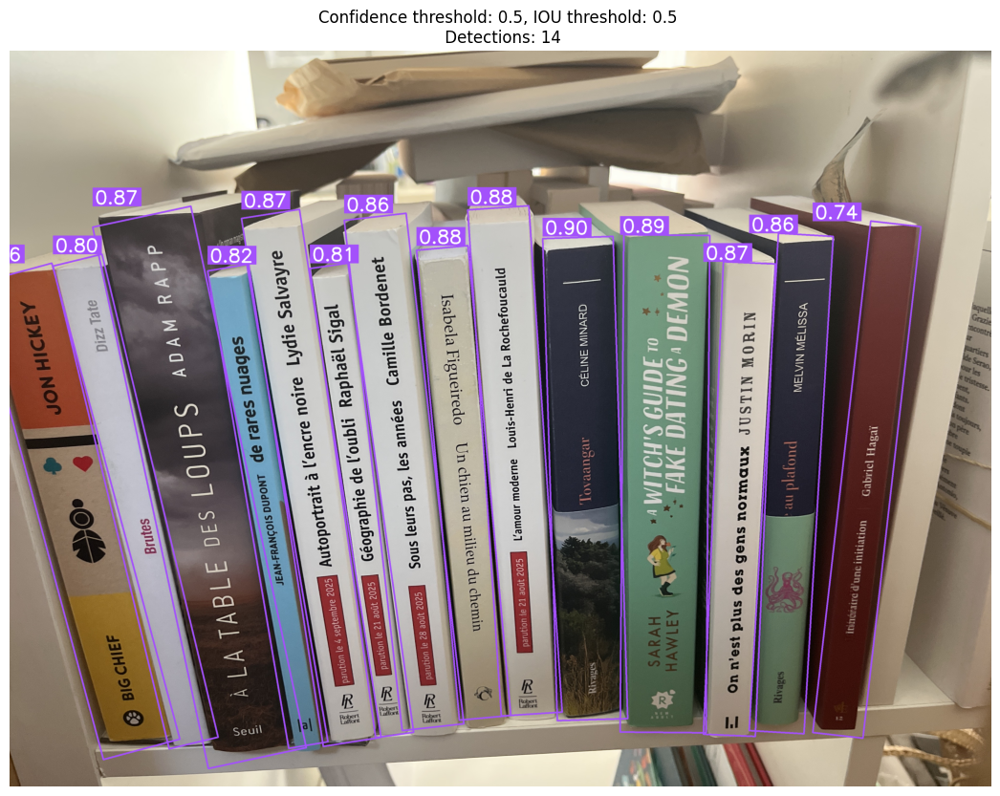

In [23]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt

# Load a model
model = YOLO("runs/obb/train/weights/best.pt")

# Read an image
file_name="Images/IMG_4081.JPG" # path to your image file
image = cv2.imread(file_name)

if image is None:
    raise FileNotFoundError(f"❌ Impossible de charger l'image : {file_name}")

# Define confidence and IOU thresholds
conf_threshold = 0.50
iou_threshold = 0.50

# Perform inference on the image
results = model.predict(file_name, conf=conf_threshold, iou=iou_threshold)   # set the confidence and IOU thresholds

# Convertir les résultats en objets Detections de Supervision 
# Supervision applique la non-max suppression (NMS) automatiquement
detections = sv.Detections.from_ultralytics(results[0])

# Créer les annotateurs pour les boîtes englobantes orientées et les étiquettes
oriented_bo_annotator=sv.OrientedBoxAnnotator(thickness=5)
label_annotator=sv.LabelAnnotator(text_scale=2.5, text_thickness=5)

# Annoter l'image avec les boîtes englobantes orientées
image_annotated = oriented_bo_annotator.annotate(
    scene=image.copy(), 
    detections=detections)

# Annoter l'image avec les score de confiance
image_annotated = label_annotator.annotate(
    scene=image_annotated, 
    detections=detections,
    labels=[f"{conf:0.2f}" for conf in detections.confidence]
)

# Afficher l'image annotée
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Confidence threshold: {conf_threshold}, IOU threshold: {iou_threshold} \n Detections: {len(detections)}")
plt.axis('off')
plt.show()


In [24]:
# ocr_par_livre_structured.py
# Détection OBB -> crops (padding + pivot) -> OCR Scaleway structuré -> liste "- Livre i: Titre — Auteur"

import os, json, base64, time
import numpy as np
import cv2
from ultralytics import YOLO
from openai import OpenAI
import httpx, certifi

# ---------- CONFIG ----------
MODEL_PATH = "runs/obb/train/weights/best.pt"
IMAGE_PATH = "Images/IMG_4139.JPG"
CONF       = 0.50

# Anti-429 + qualité OCR
MAX_SIDE   = 1000   # côté max par crop (hausser => +qualité, +tokens)
JPEG_QUAL  = 90     # qualité JPEG (90 = bon compromis)
BATCH_SIZE = 3      # petits lots = moins de 429
MAX_TOKENS = 600    # borne sortie
MAX_RETRIES= 4
BASE_SLEEP = 1.0

# Padding du warp (évite de couper les bords)
PAD_RATIO  = 0.06   # 6% autour du crop

SCW_MODEL    = os.getenv("SCW_MODEL", "pixtral-12b-2409")
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")
if not SCW_API_KEY:
    raise RuntimeError("SCW_API_KEY (ou SCW_SECRET_KEY) manquant.")

# Client HTTP robuste
http_client = httpx.Client(timeout=30.0, verify=certifi.where(), http2=False)
client = OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)

# ---------- HELPERS DETECTION / CROP ----------
def order_quad(pts: np.ndarray) -> np.ndarray:
    pts = np.asarray(pts, np.float32)
    s = pts.sum(axis=1); d = np.diff(pts, axis=1).ravel()
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]
    quad = np.array([tl, tr, br, bl], np.float32)
    # corrige orientation si croisé
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]
    if np.cross(v1, v2) < 0:
        quad = np.array([tl, bl, br, tr], np.float32)
    return quad

def crop_from_quad_pad(img_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float) -> np.ndarray:
    """Warp + padding pour ne pas couper les bords."""
    tl,tr,br,bl = quad
    w = int(max(1, round(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl)))))
    h = int(max(1, round(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))))
    pad_w = int(round(w * pad_ratio)); pad_h = int(round(h * pad_ratio))
    Wp, Hp = w + 2*pad_w, h + 2*pad_h
    dst = np.array([[pad_w, pad_h],[pad_w+w-1, pad_h],
                    [pad_w+w-1, pad_h+h-1],[pad_w, pad_h+h-1]], np.float32)
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)
    return cv2.warpPerspective(img_bgr, M, (Wp, Hp), flags=cv2.INTER_CUBIC)

def rotate_if_tall(c: np.ndarray, ratio: float = 1.2) -> np.ndarray:
    """Pivote 90° si le crop est très vertical -> lecture plus facile."""
    h, w = c.shape[:2]
    return cv2.rotate(c, cv2.ROTATE_90_CLOCKWISE) if h > ratio * w else c

# ---------- HELPERS ENCODAGE LÉGER ----------
def resize_keep_ar(img_bgr: np.ndarray, max_side: int) -> np.ndarray:
    h, w = img_bgr.shape[:2]
    scale = min(1.0, float(max_side) / max(h, w))
    if scale < 1.0:
        img_bgr = cv2.resize(img_bgr, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
    return img_bgr

def to_jpeg_data_url(img_bgr: np.ndarray, max_side=1000, quality=90) -> str:
    img_bgr = resize_keep_ar(img_bgr, max_side)
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])
    if not ok:
        raise RuntimeError("Échec encodage JPEG.")
    b64 = base64.b64encode(buf.tobytes()).decode("utf-8")
    return "data:image/jpeg;base64," + b64

def reading_order_key(quad: np.ndarray) -> float:
    return float(quad[:,0].mean())  # centre X

# ---------- OCR STRUCTURÉ ----------
def ocr_crops_structured(crops_bgr, batch_size=3, max_tokens=600, max_retries=4):
    """
    Pour chaque crop, renvoie un dict:
      {"title": "...", "author": "...", "publisher": "", "full_text": "..."}
    """
    all_rows = []
    for i in range(0, len(crops_bgr), batch_size):
        pack = crops_bgr[i:i+batch_size]
        content = [{
            "type": "text",
            "text": (
                "Chaque image est une tranche de livre. Pour CHACUNE, fais deux choses : "
                "1) transcris TOUT le texte imprimé exactement (full_text) ; "
                "2) isole le Titre (title) et l'Auteur/les Auteurs (author). "
                "N'invente rien : si une info est absente, mets \"\". "
                "Réponds STRICTEMENT en JSON compact: "
                "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\"}, ...]} "
                "Même ordre que les images. Pas de commentaires."
            )
        }]
        for cimg in pack:
            content.append({"type":"image_url","image_url":{"url": to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})

        attempt, sleep_s = 0, BASE_SLEEP
        while True:
            try:
                r = client.chat.completions.create(
                    model=SCW_MODEL,
                    response_format={"type": "json_object"},
                    temperature=0.0,
                    max_tokens=max_tokens,
                    messages=[{"role":"user","content": content}],
                )
                data = json.loads(r.choices[0].message.content or "{}")
                rows = data.get("results", [])
                # normalisation
                norm = []
                for obj in rows:
                    norm.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                    })
                # complétion si réponse plus courte
                while len(norm) < len(pack):
                    norm.append({"title":"", "author":"", "publisher":"", "full_text":""})
                all_rows.extend(norm[:len(pack)])
                break
            except Exception as e:
                msg = str(e).lower()
                if "429" in msg or "rate" in msg or "too many tokens" in msg or "quota" in msg:
                    attempt += 1
                    if attempt > max_retries:
                        all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":""} for _ in pack])
                        break
                    time.sleep(sleep_s)
                    sleep_s = min(sleep_s * 2, 8.0)
                    continue
                all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":""} for _ in pack])
                break
    return all_rows

# ---------- 1) DÉTECTION ----------
model = YOLO(MODEL_PATH)
res = model.predict(IMAGE_PATH, conf=CONF)[0]
img = cv2.imread(IMAGE_PATH); assert img is not None

if not hasattr(res, "obb") or res.obb is None or res.obb.xyxyxyxy is None:
    raise RuntimeError("Pas de boîtes orientées (res.obb.xyxyxyxy).")

# (quad, conf) puis tri gauche->droite
pairs = []
for quad_t, conf_t in zip(res.obb.xyxyxyxy, res.obb.conf):
    if float(conf_t) < CONF:
        continue
    quad = order_quad(quad_t.cpu().numpy().astype(np.float32).reshape(4,2))
    pairs.append((quad, float(conf_t)))
pairs.sort(key=lambda qc: reading_order_key(qc[0]))

# ---------- 2) CROPS (padding + pivot) ----------
crops = []
for quad, _ in pairs:
    c = crop_from_quad_pad(img, quad, PAD_RATIO)
    c = rotate_if_tall(c, ratio=1.2)
    crops.append(c)

# ---------- 3) OCR STRUCTURÉ ----------
rows = ocr_crops_structured(crops, batch_size=BATCH_SIZE, max_tokens=MAX_TOKENS, max_retries=MAX_RETRIES)

# ---------- 4) SORTIE ----------
print("\n--- OCR par livre (Titre — Auteur) ---")
if not rows:
    print("(aucun livre détecté)")
else:
    for i, r in enumerate(rows, 1):
        title = r["title"].strip() or r["full_text"] or "(titre inconnu)"
        author = r["author"].strip()
        line = f"- Livre {i}: {title}"
        if author:
            line += f" — {author}"
        print(line)



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4139.JPG: 480x640 51.8ms
Speed: 2.0ms preprocess, 51.8ms inference, 4.0ms postprocess per image at shape (1, 3, 480, 640)



--- OCR par livre (Titre — Auteur) ---
- Livre 1: Parler le japonais en voyage
- Livre 2: FINLANDE
- Livre 3: JAPON : TOKYO, KYOTO, OSAKA ET HIROSHIMA 2026
- Livre 4: LE BOULTARD
- Livre 5: FRANCHE-COMTÉ
- Livre 6: KENYA, TANZANIE
- Livre 7: RANDOS BIÈRE GRAND PARIS — Mariette Pau et Quentin Monein
- Livre 8: LANGUEDOC LE ROUTARD
- Livre 9: FRENCH phrasebook — HARRAP'S
- Livre 10: Géorgie, Arménie et Azerbaïdjan
- Livre 11: Laos
- Livre 12: Îles grecques et Athènes
- Livre 13: (titre inconnu)
- Livre 14: (titre inconnu)
- Livre 15: (titre inconnu)
- Livre 16: (titre inconnu)
- Livre 17: (titre inconnu)
- Livre 18: (titre inconnu)
- Livre 19: Majorque — Lonely Planet
- Livre 20: Les Grecques — Le Routard
- Livre 21: Malaisie — Lonely Planet
- Livre 22: GUADELOUPE LE ROUTARD 2026
- Livre 23: MALAISIE, SINGAPOUR LE ROUTARD 2024
- Livre 24: Guadeloupe — Carto
- Livre 25: Malte et Gozo
- Livre 26: En quelques jours — Guadeloupe
- Livre 27: Malte — Le Routard
- Livre 28: (titre inconnu)
- L

In [25]:
# ocr_par_livre_structured_refined_commented.py
# Détection OBB -> crops (padding + pivot) -> OCR Scaleway structuré -> raffinage local -> liste "- Livre i: Titre — Auteur"

import os, json, base64, time, re, unicodedata        # stdlib : variables d'env, JSON, encodage, temporisation, regex, normalisation Unicode
import numpy as np                                     # calcul matriciel
import cv2                                             # OpenCV pour opérations image (lecture, warp, resize, rotation, encodage)
from ultralytics import YOLO                           # modèle YOLO (Ultralytics) pour détection OBB
from openai import OpenAI                              # client OpenAI-compatible (Scaleway Generative APIs)
import httpx, certifi                                  # httpx pour client HTTP robuste, certifi pour bundle CA

# ----------------- CONFIG -----------------
MODEL_PATH = "runs/obb/train/weights/best.pt"          # chemin vers ton modèle YOLO OBB entraîné
IMAGE_PATH = "Images/IMG_4139.JPG"                     # image d’entrée (photo d’étagère)
CONF       = 0.50                                      # seuil minimal de confiance pour conserver une détection

# Anti-429 + qualité OCR
MAX_SIDE   = 1000                                      # taille max (côté) des crops envoyés à l’API (contrôle tokens/qualité)
JPEG_QUAL  = 90                                        # qualité JPEG (compromis taille/qualité)
BATCH_SIZE = 3                                         # nombre d’images envoyées par appel OCR (petits lots -> moins de 429)
MAX_TOKENS = 700                                       # borne max de tokens de réponse (limite coûts/ratelimiting)
MAX_RETRIES= 4                                         # nombre de tentatives en cas de 429 (backoff)
BASE_SLEEP = 1.0                                       # délai initial (secondes) avant retry, doublé à chaque 429

PAD_RATIO  = 0.06                                      # padding relatif ajouté autour du crop (évite de couper des lettres)
PIVOT_RATIO= 1.2                                       # seuil hauteur/largeur pour pivoter les crops très verticaux

SCW_MODEL    = os.getenv("SCW_MODEL", "pixtral-12b-2409")          # nom du modèle vision côté Scaleway
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")  # clé IAM depuis variables d’environnement
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")          # endpoint Generative APIs (OpenAI-compat)

if not SCW_API_KEY:                                    # vérifie présence de la clé
    raise RuntimeError("SCW_API_KEY (ou SCW_SECRET_KEY) manquant.")

# Client HTTP robuste (HTTP/1.1; vérif certificats) pour limiter les RemoteProtocolError
http_client = httpx.Client(timeout=30.0, verify=certifi.where(), http2=False)

# Client OpenAI pointant chez Scaleway
client = OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)

# ----------------- HELPERS DETECTION / CROP -----------------
def order_quad(pts: np.ndarray) -> np.ndarray:
    """Ordonne 4 points quelconques en (tl,tr,br,bl) et corrige l’orientation si nécessaire."""
    pts = np.asarray(pts, np.float32)                  # assure type float32 (OpenCV friendly)
    s = pts.sum(axis=1)                                # somme x+y : min ≈ top-left, max ≈ bottom-right
    d = np.diff(pts, axis=1).ravel()                   # différence x-y : min ≈ top-right, max ≈ bottom-left
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]      # coin haut-gauche & bas-droit
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]      # coin haut-droit & bas-gauche
    quad = np.array([tl, tr, br, bl], np.float32)      # quadrilatère ordonné
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]          # vecteurs pour tester le sens (CW/CCW)
    if np.cross(v1, v2) < 0:                           # si orientation inversée (aire négative)
        quad = np.array([tl, bl, br, tr], np.float32)  # permute pour obtenir sens correct
    return quad

def crop_from_quad_pad(img_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float) -> np.ndarray:
    """Redresse le quadrilatère par homographie + ajoute un padding autour du crop."""
    tl,tr,br,bl = quad                                                      # décompacte les 4 coins
    w = int(max(1, round(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl)))))  # largeur estimée du crop
    h = int(max(1, round(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))))  # hauteur estimée du crop
    pad_w = int(round(w * pad_ratio)); pad_h = int(round(h * pad_ratio))    # padding horizontal/vertical en pixels
    dst = np.array([[pad_w, pad_h],                                         # quadrilatère destination (avec padding)
                    [pad_w+w-1, pad_h],
                    [pad_w+w-1, pad_h+h-1],
                    [pad_w, pad_h+h-1]], np.float32)
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)           # matrice d’homographie
    return cv2.warpPerspective(img_bgr, M, (w + 2*pad_w, h + 2*pad_h), flags=cv2.INTER_CUBIC)  # warp + interpolation fine

def rotate_if_tall(c: np.ndarray, ratio: float = 1.2) -> np.ndarray:
    """Pivote le crop de 90° si très vertical (h > ratio * w) pour faciliter l’OCR."""
    h, w = c.shape[:2]                                                      # dimensions du crop
    return cv2.rotate(c, cv2.ROTATE_90_CLOCKWISE) if h > ratio * w else c   # rotation conditionnelle

def resize_keep_ar(img_bgr: np.ndarray, max_side: int) -> np.ndarray:
    """Redimensionne en conservant le ratio pour que max(h, w) <= max_side."""
    h, w = img_bgr.shape[:2]                                                # taille actuelle
    scale = min(1.0, float(max_side) / max(h, w))                           # facteur d’échelle (<=1)
    if scale < 1.0:                                                         # si besoin de réduire
        img_bgr = cv2.resize(img_bgr, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)  # resize anti-aliasing
    return img_bgr

def to_jpeg_data_url(img_bgr: np.ndarray, max_side=1000, quality=90) -> str:
    """Encode un np.ndarray BGR en data URL JPEG base64 (plus compact que PNG)."""
    img_bgr = resize_keep_ar(img_bgr, max_side)                             # réduit à max_side
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])  # encode en JPEG
    if not ok:                                                              # sécurité encodage
        raise RuntimeError("Échec encodage JPEG.")
    b64 = base64.b64encode(buf.tobytes()).decode("utf-8")                   # conversion en base64 (string)
    return "data:image/jpeg;base64," + b64                                  # fabrique la data URL

def reading_order_key(quad: np.ndarray) -> float:
    """Renvoie la coordonnée X moyenne du quadrilatère (pour trier gauche → droite)."""
    return float(quad[:,0].mean())                                          # centre X

# ----------------- OCR STRUCTURÉ -----------------
def ocr_crops_structured(crops_bgr, batch_size=3, max_tokens=700, max_retries=4):
    """
    Envoie les crops en petits lots au modèle vision et renvoie,
    pour chaque image, un dict : {title, author, publisher, full_text, lines}.
    """
    all_rows = []                                                           # liste de résultats cumulés
    for i in range(0, len(crops_bgr), batch_size):                          # parcourt les crops par paquets
        pack = crops_bgr[i:i+batch_size]                                    # extrait le lot courant
        content = [{                                                        # message utilisateur (prompt)
            "type": "text",
            "text": (
                "Chaque image est la TRANCHE d'un livre. Pour CHACUNE : "
                "1) Transcris toutes les lignes lisibles ('lines': [ ... ]) dans l'ordre vertical. "
                "2) Donne 'full_text' (concaténation raisonnable). "
                "3) Extrait 'title' (titre de l'œuvre) et 'author' (prénom + nom). "
                "4) 'publisher' si identifiable (Seuil, Rivages, Robert Laffont, etc.). "
                "N'invente rien : mets \"\" si inconnu. "
                "Réponds STRICTEMENT en JSON compact: "
                "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\",\"lines\":[\"...\"]}, ...]} "
                "Même ordre que les images. Pas de commentaires."
            )
        }]
        for cimg in pack:                                                   # ajoute chaque image au message
            content.append({"type":"image_url",
                            "image_url":{"url": to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})

        attempt, sleep_s = 0, BASE_SLEEP                                    # compteurs retry / backoff
        while True:                                                         # boucle de retry
            try:
                r = client.chat.completions.create(                         # appel OpenAI-compat (Scaleway)
                    model=SCW_MODEL,                                        # modèle vision
                    response_format={"type": "json_object"},                # on force une réponse JSON
                    temperature=0.0,                                        # déterministe
                    max_tokens=max_tokens,                                  # borne de sortie
                    messages=[{"role":"user","content": content}],          # message unique "user"
                )
                data = json.loads(r.choices[0].message.content or "{}")     # parse JSON
                rows = data.get("results", [])                              # récupère la liste d'objets
                # normalisation des champs (strings propres)
                norm = []
                for obj in rows:
                    norm.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                        "lines":     [l.strip() for l in (obj.get("lines") or []) if isinstance(l, str)],
                    })
                while len(norm) < len(pack):                                # si le modèle renvoie moins d’items
                    norm.append({"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]})
                all_rows.extend(norm[:len(pack)])                           # ajoute au cumul
                break                                                       # lot traité → on sort du while True
            except Exception as e:                                          # gestion d’erreurs (dont 429)
                msg = str(e).lower()
                if "429" in msg or "rate" in msg or "too many tokens" in msg or "quota" in msg:
                    attempt += 1                                            # on a touché la limite
                    if attempt > max_retries:                               # trop d’essais
                        all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                        break
                    time.sleep(sleep_s)                                     # backoff
                    sleep_s = min(sleep_s * 2, 8.0)                         # double sans dépasser 8s
                    continue
                # autre erreur → on remplit avec des objets vides pour garder l’alignement
                all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                break
    return all_rows                                                          # renvoie tous les résultats structurés

# ----------------- RAFFINAGE LOCAL (titre/auteur/éditeur) -----------------
PUBLISHERS = {                                                               # éditeurs courants pour filtrage
    "seuil","robert laffont","rivages","gallimard","grasset","minuit","p.o.l.","actes sud",
    "flammarion","folio","10/18","points","j'ai lu","payot","casterman","le seuil","laffont",
}

def _norm(s: str) -> str:
    """Normalise basiquement (ASCII, minuscules, enlève ponctuation) pour comparer."""
    s = unicodedata.normalize("NFKD", s or "").encode("ascii", "ignore").decode("ascii")  # supprime diacritiques
    return re.sub(r"[^a-z0-9/ +'-]", " ", s.lower()).strip()                              # keep chars simples

def looks_like_author(line: str) -> bool:
    """Heuristique simple : 1–5 mots, capitalisés/majuscules, autorise particules (de/du/la...)."""
    tokens = [t for t in re.findall(r"[A-Za-zÀ-ÖØ-öø-ÿ'-]+", line) if t]    # tokens alphabétiques
    if not (1 <= len(tokens) <= 5): 
        return False
    lower_ok = {"de","du","des","la","le","les","d","l"}                    # particules possibles
    cap_count = 0
    for t in tokens:
        if t.lower() in lower_ok:                                           # ignore particules
            continue
        if t[0].isupper() or t.isupper():                                   # mot capitalisé/majuscule
            cap_count += 1
    return cap_count >= max(1, len(tokens) - 2)                             # assez de mots “noms propres”

def choose_title(lines, fallback):
    """Choisit une ligne plausible de titre (longueur raisonnable, pas un éditeur, contient des minuscules)."""
    best = ""
    for L in lines:
        Ls = L.strip()
        if 6 <= len(Ls) <= 60 and any(c.islower() for c in Ls):             # longueur/forme
            if _norm(Ls) not in PUBLISHERS and not any(p in _norm(Ls) for p in PUBLISHERS):
                if len(Ls) > len(best):                                     # privilégie la plus significative
                    best = Ls
    return best or fallback                                                 # sinon conserve fallback

def choose_author(lines, title):
    """Choisit une ligne ressemblant à un auteur, différente du titre, non éditeur."""
    for L in lines:
        if L.strip() and L.strip() != title and _norm(L) not in PUBLISHERS:
            if looks_like_author(L):
                return L.strip()
    return ""

def refine_book_fields(row):
    """Raffine/complète {title, author, publisher, full_text} depuis {lines, full_text}."""
    lines = row.get("lines") or []                                          # lignes OCR par tranche
    title = (row.get("title") or "").strip()                                # premier titre proposé par le modèle
    author = (row.get("author") or "").strip()                              # premier auteur proposé
    publisher = (row.get("publisher") or "").strip()                        # éditeur proposé
    full_text = row.get("full_text") or ""                                  # concat global

    if not publisher:                                                       # si éditeur vide -> tente de le déduire
        for L in lines:
            n = _norm(L)
            if n in PUBLISHERS:                                             # match éditeur connu
                publisher = L.strip()
                break

    if not title or _norm(title) in PUBLISHERS:                             # si pas de titre ou faux positif éditeur
        title = choose_title(lines, fallback=(title or ""))                 # re-choisir un titre plausible

    if (not author) or (author.strip() == title.strip()):                   # si auteur vide / égal au titre
        a = choose_author(lines, title)                                     # re-choisir un auteur plausible
        if a:
            author = a

    if not title and full_text:                                             # ultime fallback : extraire depuis full_text
        for cand in re.split(r"[/|·•\n]+", full_text):
            cand = cand.strip()
            if 6 <= len(cand) <= 60 and any(c.islower() for c in cand) and _norm(cand) not in PUBLISHERS:
                title = cand; break

    return {                                                                # renvoie champs raffinés
        "title": title.strip(),
        "author": author.strip(),
        "publisher": publisher.strip(),
        "full_text": full_text.strip()
    }

# ----------------- PIPELINE -----------------
# 1) Détection (YOLO OBB)
model = YOLO(MODEL_PATH)                                                    # charge le modèle
res = model.predict(IMAGE_PATH, conf=CONF)[0]                               # inférence sur l’image
img = cv2.imread(IMAGE_PATH); assert img is not None                        # lit l’image (BGR)

if not hasattr(res, "obb") or res.obb is None or res.obb.xyxyxyxy is None:  # vérifie qu’on a bien des OBB
    raise RuntimeError("Pas de boîtes orientées (res.obb.xyxyxyxy).")

pairs = []                                                                   # liste des quadrilatères ordonnés
for quad_t, conf_t in zip(res.obb.xyxyxyxy, res.obb.conf):                  # pour chaque détection
    if float(conf_t) < CONF:                                                 # filtre par confiance
        continue
    quad = order_quad(quad_t.cpu().numpy().astype(np.float32).reshape(4,2)) # ordonne les 4 coins
    pairs.append(quad)                                                       # stocke

pairs.sort(key=lambda q: reading_order_key(q))                               # tri gauche → droite (lecture naturelle)

# 2) Crops (padding + pivot)
crops = []                                                                   # liste des crops BGR
for quad in pairs:                                                           # pour chaque livre
    c = crop_from_quad_pad(img, quad, PAD_RATIO)                             # warp + padding
    c = rotate_if_tall(c, ratio=PIVOT_RATIO)                                 # rotation si très vertical
    crops.append(c)                                                          # ajoute à la liste

# 3) OCR structuré (par lots)
raw_rows = ocr_crops_structured(crops, batch_size=BATCH_SIZE,               # envoie à l’API en lots
                                max_tokens=MAX_TOKENS, max_retries=MAX_RETRIES)

# 4) Raffinage local (titre/auteur/éditeur) pour standardiser
rows = [refine_book_fields(r) for r in raw_rows]                             # applique nos heuristiques

# 5) Affichage final (Titre — Auteur) dans l’ordre de lecture
print("\n--- OCR par livre (Titre — Auteur) ---")                           # en-tête console
if not rows:                                                                # cas sans détection
    print("(aucun livre détecté)")
else:
    for i, r in enumerate(rows, 1):                                         # parcourt tous les livres
        title = r["title"] or "(titre inconnu)"                             # fallback lisible si vide
        author = r["author"]                                                # auteur (peut être vide)
        line = f"- Livre {i}: {title}"                                      # construit la ligne
        if author:                                                          # ajoute l’auteur si présent
            line += f" — {author}"
        print(line)                                                         # imprime la ligne



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4139.JPG: 480x640 65.0ms
Speed: 0.0ms preprocess, 65.0ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



--- OCR par livre (Titre — Auteur) ---
- Livre 1: Parler le japonais en voyage
- Livre 2: (titre inconnu) — FINLANDE
- Livre 3: (titre inconnu)
- Livre 4: Le Boutard — LE BOUTARD
- Livre 5: Franche-Comté — FRANCHE-COMTÉ
- Livre 6: KENYA, TANZANIE — Routard
- Livre 7: RANDOS BIÈRE GRAND PARIS — Mariette Pau et Quentin Monein
- Livre 8: LANGUEDOC — LE ROUTARD
- Livre 9: FRENCH phrasebook — HARRAP'S
- Livre 10: Géorgie, Arménie et Azerbaïdjan
- Livre 11: Laos
- Livre 12: Îles grecques et Athènes
- Livre 13: (titre inconnu)
- Livre 14: (titre inconnu)
- Livre 15: (titre inconnu)
- Livre 16: GRÈCE CONTINENTALE — LE ROUTARD
- Livre 17: MADÈRE — LE ROUTARD
- Livre 18: MADÈRE — LE ROUTARD
- Livre 19: Majorque
- Livre 20: Îles Grecques
- Livre 21: Malaisie
- Livre 22: (titre inconnu)
- Livre 23: (titre inconnu)
- Livre 24: (titre inconnu)
- Livre 25: (titre inconnu)
- Livre 26: (titre inconnu)
- Livre 27: (titre inconnu)
- Livre 28: GUATEMALA — Routard
- Livre 29: CARTO MALTE — CARTO
- Livre 3

In [26]:
# proto_books_ocr_min_post.py
# Détection OBB -> crops (padding + pivot) -> OCR Scaleway (lots petits)
# -> post-traitement simple (nettoyage titres/auteurs/éditeurs)
# -> sauvegarde JSON (ordre gauche→droite) + affichage concis.

import os, json, base64, time, datetime, re, unicodedata   # stdlib
import numpy as np                                         # matrices / vecteurs
import cv2                                                 # OpenCV
from ultralytics import YOLO                               # YOLO OBB
from openai import OpenAI                                  # client OpenAI-compatible (Scaleway)
import httpx, certifi                                      # HTTP robuste

# ========= Config =========
MODEL_PATH   = "runs/obb/train/weights/best.pt"            # modèle YOLO-OBB
IMAGE_PATH   = "Images/IMG_4081.JPG"                       # image d'entrée
CONF         = 0.50                                        # seuil de confiance

BATCH_SIZE   = 3                                           # lots OCR (anti-429)
MAX_TOKENS   = 600                                         # borne sortie
MAX_RETRIES  = 4                                           # retries max
BASE_SLEEP   = 1.0                                         # backoff initial (s)

PAD_RATIO    = 0.06                                        # padding crop
PIVOT_RATIO  = 1.2                                         # pivot si h>w*1.2
MAX_SIDE     = 1000                                        # côté max image OCR
JPEG_QUAL    = 90                                          # qualité JPEG
OUT_DIR      = "ocr_runs"                                  # dossier JSON
os.makedirs(OUT_DIR, exist_ok=True)

SCW_MODEL    = os.getenv("SCW_MODEL", "mistral-small-3.2-24b-instruct-2506")  # modèle vision Scaleway
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")
if not SCW_API_KEY:
    raise RuntimeError("SCW_API_KEY manquant.")

# Client HTTP/1.1 robuste
http_client = httpx.Client(timeout=30.0, verify=certifi.where(), http2=False)
client = OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)

# ========= Petites listes pour post-traitement (simple et ciblé) =========
# NB: tout en minuscules ascii (on normalise avant comparaison).
PUBLISHERS = {
    "seuil","robert laffont","rivages","gallimard","grasset","minuit","p.o.l.","actes sud",
    "flammarion","folio","10/18","points","j'ai lu","payot","casterman","laffont","harrap's","harraps",
    "michelin","dk","fodors","frommer","eyewitness","rough guides","bradt","dumont","moon","footprint",
}
SERIES = {
    "le routard","routard","guide du routard","guide routard","lonely planet","petit fute","petit futé",
    "carto","cartoville","guide vert","en quelques jours","phrasebook","guide",
}
FILLERS = {"guide","de","du","des","la","le","les","en","et","au","aux","d","l","un","une"}

def _norm(s: str) -> str:
    """ASCII + minuscules + nettoyage (pour comparer)."""
    s = unicodedata.normalize("NFKD", s or "").encode("ascii","ignore").decode("ascii")
    return re.sub(r"[^a-z0-9/ +'_-]", " ", s.lower()).strip()

def contains_brand(s_norm: str) -> bool:
    """True si s_norm contient une marque/éditeur connu."""
    if not s_norm: return False
    if s_norm in PUBLISHERS or s_norm in SERIES: return True
    for w in (PUBLISHERS | SERIES):
        if w in s_norm: return True
    return False

def best_title_fragment(text: str) -> str:
    """Choisit le meilleur fragment de titre depuis un texte brut, en retirant les marques."""
    parts = re.split(r"[\n|/–—\-:,]+", text or "")
    cands = []
    for p in parts:
        p = p.strip()
        if not p: continue
        n = _norm(p)
        if contains_brand(n):            # saute les marques (Routard, LP, etc.)
            continue
        if len(p) < 2:                   # ignore trop court
            continue
        if _norm(p) in FILLERS:          # ignore filler pur
            continue
        cands.append(p)
    if not cands:
        return (text or "").strip()
    # prend le plus "informatif" (long)
    return max(cands, key=len)

def guess_author_from_text(text: str) -> str:
    """Extrait un motif 'Nom Prénom' (1-4 mots capitalisés). Simple et efficace pour un proto."""
    if not text: return ""
    # 1 à 4 mots qui commencent par majuscule (autorise accents, - et ')
    pattern = r"\b([A-Z][a-zÀ-ÖØ-öø-ÿ]+(?:[-' ][A-Z][a-zÀ-ÖØ-öø-ÿ]+){0,3})\b"
    for m in re.finditer(pattern, text):
        cand = m.group(1).strip()
        if contains_brand(_norm(cand)):          # évite marques en auteur
            continue
        # évite de prendre des mots tout caps typiques de séries
        if cand.isupper() and len(cand) > 4:
            continue
        return cand
    return ""

def post_process_rows(rows):
    """Nettoie titre/auteur/éditeur par règles simples, sans gonfler le code."""
    out = []
    for r in rows:
        title  = (r.get("title") or "").strip()
        author = (r.get("author") or "").strip()
        pub    = (r.get("publisher") or "").strip()
        text   = (r.get("full_text") or "").strip()

        # Publisher: si vide mais marque présente dans full_text -> remplis
        if not pub:
            for token in re.split(r"[\n|/–—\-:,]+", text):
                if contains_brand(_norm(token)):
                    pub = token.strip()
                    break

        # Title: si vide ou contaminé (marque) ou égal à l’auteur -> choisit un fragment propre
        if (not title) or contains_brand(_norm(title)) or (author and _norm(title)==_norm(author)):
            cand = best_title_fragment(text)
            if cand and not contains_brand(_norm(cand)):
                title = cand

        # Author: si vide / égal au titre / est une marque -> devine depuis full_text
        if (not author) or (_norm(author)==_norm(title)) or contains_brand(_norm(author)):
            cand = guess_author_from_text(text)
            if cand:
                author = cand

        # Encore égalité titre/auteur -> vide l’auteur (mieux que doublon)
        if title and author and _norm(title)==_norm(author):
            author = ""

        out.append({"title":title, "author":author, "publisher":pub, "full_text":text})
    return out

# ========= Helpers géométrie / encodage =========
def order_quad(pts: np.ndarray) -> np.ndarray:
    """Ordonne 4 points (TL,TR,BR,BL) + corrige orientation si nécessaire."""
    pts = np.asarray(pts, np.float32)
    s = pts.sum(axis=1); d = np.diff(pts, axis=1).ravel()
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]
    quad = np.array([tl, tr, br, bl], np.float32)
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]
    if np.cross(v1, v2) < 0:
        quad = np.array([tl, bl, br, tr], np.float32)
    return quad

def crop_from_quad_pad(img_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float) -> np.ndarray:
    """Homographie + padding (évite de couper les lettres au bord)."""
    tl,tr,br,bl = quad
    w = int(max(1, round(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl)))))
    h = int(max(1, round(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))))
    pad_w = int(round(w * pad_ratio)); pad_h = int(round(h * pad_ratio))
    dst = np.array([[pad_w, pad_h],[pad_w+w-1, pad_h],[pad_w+w-1, pad_h+h-1],[pad_w, pad_h+h-1]], np.float32)
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)
    return cv2.warpPerspective(img_bgr, M, (w + 2*pad_w, h + 2*pad_h), flags=cv2.INTER_CUBIC)

def rotate_if_tall(c: np.ndarray, ratio: float = 1.2) -> np.ndarray:
    """Pivote si h/w > ratio (texte vertical)."""
    h, w = c.shape[:2]
    return cv2.rotate(c, cv2.ROTATE_90_CLOCKWISE) if h > ratio * w else c

def resize_keep_ar(img_bgr: np.ndarray, max_side: int) -> np.ndarray:
    """Limite la taille max sans déformer."""
    h, w = img_bgr.shape[:2]
    scale = min(1.0, float(max_side) / max(h, w))
    return cv2.resize(img_bgr, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA) if scale < 1.0 else img_bgr

def to_jpeg_data_url(img_bgr: np.ndarray, max_side=1000, quality=90) -> str:
    """Encode BGR -> JPEG -> base64 data URL (compact pour l'API)."""
    img_bgr = resize_keep_ar(img_bgr, max_side)
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])
    if not ok: raise RuntimeError("Échec encodage JPEG.")
    return "data:image/jpeg;base64," + base64.b64encode(buf.tobytes()).decode("utf-8")

def reading_order_x(quad: np.ndarray) -> float:
    """Clé de tri gauche→droite : centre X du quad."""
    return float(quad[:,0].mean())

# ========= OCR par lots (petit prompt, JSON strict) =========
def ocr_batch_scw(crops_bgr):
    """Envoie des crops par petits lots et renvoie une liste d'objets JSON alignée avec l'ordre des images."""
    results = []
    for i in range(0, len(crops_bgr), BATCH_SIZE):
        pack = crops_bgr[i:i+BATCH_SIZE]
        content = [{
            "type": "text",
            "text": (
                "Chaque image est la tranche d'un livre. Pour CHACUNE, réponds STRICTEMENT en JSON compact: "
                "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\"}, ...]} "
                "N'invente rien: mets \"\" si inconnu."
            )
        }]
        for cimg in pack:
            content.append({"type":"image_url","image_url":{"url": to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})

        attempt, sleep_s = 0, BASE_SLEEP
        while True:
            try:
                r = client.chat.completions.create(
                    model=SCW_MODEL,
                    response_format={"type":"json_object"},
                    temperature=0.0,
                    max_tokens=MAX_TOKENS,
                    messages=[{"role":"user","content": content}],
                )
                data = json.loads(r.choices[0].message.content or "{}")
                arr = data.get("results", [])
                for obj in arr:
                    results.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                    })
                while len(results) < i + len(pack):
                    results.append({"title":"","author":"","publisher":"","full_text":""})
                break
            except Exception as e:
                if any(k in str(e).lower() for k in ["429","rate","too many tokens","quota"]):
                    attempt += 1
                    if attempt > MAX_RETRIES:
                        results.extend([{"title":"","author":"","publisher":"","full_text":""} for _ in pack])
                        break
                    time.sleep(sleep_s); sleep_s = min(sleep_s*2, 8.0)
                    continue
                results.extend([{"title":"","author":"","publisher":"","full_text":""} for _ in pack])
                break
    return results

# ========= Pipeline =========
# 1) Détection OBB
model = YOLO(MODEL_PATH)
res = model.predict(IMAGE_PATH, conf=CONF)[0]
img = cv2.imread(IMAGE_PATH); assert img is not None
if not hasattr(res, "obb") or res.obb is None or res.obb.xyxyxyxy is None:
    raise RuntimeError("Modèle sans OBB (res.obb.xyxyxyxy absent).")

# 2) Trie les quads de gauche à droite
quads = []
for quad_t, conf_t in zip(res.obb.xyxyxyxy, res.obb.conf):
    if float(conf_t) < CONF: 
        continue
    quad = order_quad(quad_t.cpu().numpy().astype(np.float32).reshape(4,2))
    quads.append(quad)
quads.sort(key=reading_order_x)

# 3) Crops (warp + padding + pivot)
crops = []
for q in quads:
    c = crop_from_quad_pad(img, q, PAD_RATIO)
    c = rotate_if_tall(c, ratio=PIVOT_RATIO)
    crops.append(c)

# 4) OCR brut (JSON structuré)
rows_raw = ocr_batch_scw(crops)

# 5) Post-traitement simple (nettoyage titres/auteurs/éditeurs)
rows = post_process_rows(rows_raw)

# 6) Sauvegarde JSON (ordre gauche→droite, rejouable)
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
stem = os.path.splitext(os.path.basename(IMAGE_PATH))[0]
out_json = os.path.join(OUT_DIR, f"{stem}_{ts}.json")
payload = {
    "image": IMAGE_PATH,
    "model": {"detector": "YOLO-OBB", "ocr": SCW_MODEL, "endpoint": SCW_BASE_URL},
    "books": rows
}
with open(out_json, "w", encoding="utf-8") as f:
    json.dump(payload, f, ensure_ascii=False, indent=2)

# 7) Affichage console concis
print("\n--- OCR par livre (Titre — Auteur) ---")
if not rows:
    print("(aucun livre détecté)")
else:
    for i, r in enumerate(rows, 1):
        t = r["title"] or "(titre inconnu)"
        a = r["author"]
        print(f"- Livre {i}: {t}" + (f" — {a}" if a else ""))

print(f"\n✅ Résultats enregistrés (ordre gauche→droite) dans: {out_json}")



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4081.JPG: 480x640 51.7ms
Speed: 1.4ms preprocess, 51.7ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



--- OCR par livre (Titre — Auteur) ---
- Livre 1: Big Chief — Jon Hickey
- Livre 2: Brutes — Dizz Tate
- Livre 3: À la table des loups — Adam Rapp
- Livre 4: de rares nuages — Jean-François Dupont
- Livre 5: Autoportrait à l'encre noire — Lydie Salvayre
- Livre 6: Géographie de l'oubli — Raphaël Sigal
- Livre 7: Sous leurs pas, les années — Camille Bordenet
- Livre 8: Un chien au milieu du chemin — Isabela Figueiredo
- Livre 9: L'amour moderne — Louis-Henri de La Rochefoucauld
- Livre 10: Rivages
- Livre 11: Tovaangar — Céline Minard
- Livre 12: A Witch's Guide to Fake Dating a Demon — Sarah Hawley
- Livre 13: On n'est plus des gens normaux — Justin Morin
- Livre 14: Rivages au plafond — Melvin Mélissa
- Livre 15: Itinéraire d'une initiation — Gabriel Hagaï

✅ Résultats enregistrés (ordre gauche→droite) dans: ocr_runs\IMG_4081_20251030_110142.json


In [27]:
# ocr_par_livre_structured_refined_v3.py
# Détection OBB -> crops (padding + pivot) -> OCR Scaleway structuré (lots petits + backoff)
# -> raffinage local (titre/auteur/éditeur) -> impression continue : "- Livre i: Titre — Auteur"
# Option debug : affiche le mapping "index YOLO -> rang final" pour comprendre d'éventuels gaps.

# ---------- IMPORTS ----------
import os, json, base64, time, re, unicodedata      # stdlib : env, JSON, encodage, temporisation, regex, normalisation
import numpy as np                                   # calcul matriciel
import cv2                                           # OpenCV : image (lecture, warp, resize, rotation, encodage)
from ultralytics import YOLO                         # Ultralytics : modèle YOLO (OBB)
from openai import OpenAI                            # Client OpenAI-compatible (Scaleway Generative APIs)
import httpx, certifi                                # httpx : client HTTP robuste ; certifi : bundle CA

# ---------- CONFIG UTILISATEUR ----------
MODEL_PATH   = "runs/obb/train/weights/best.pt"      # modèle YOLO-OBB entraîné
IMAGE_PATH   = "Images/IMG_4081.JPG"                 # image d’entrée
CONF         = 0.50                                  # seuil confiance pour garder une détection

# Réglages qualité / anti-429
MAX_SIDE     = 1000                                  # côté max de chaque crop envoyé (plus haut = meilleure OCR mais +tokens)
JPEG_QUAL    = 90                                    # qualité JPEG (compromis taille/qualité)
BATCH_SIZE   = 3                                     # nb de crops par appel OCR (petits lots = moins de rate limit)
MAX_TOKENS   = 700                                   # borne max tokens de sortie
MAX_RETRIES  = 4                                     # tentatives max en case de 429
BASE_SLEEP   = 1.0                                   # délai initial (s) pour backoff, doublé à chaque 429

# Prétraitements crops
PAD_RATIO    = 0.06                                  # padding relatif pour ne pas couper les bords
PIVOT_RATIO  = 1.2                                   # pivot si h > 1.2 * w (texte vertical)

# Debug (afficher mapping index YOLO -> rang final)
DEBUG_MAPPING = True                                 # passer à False pour ne pas afficher la table de mapping

# Scaleway (OpenAI-compat) : clé + endpoint
SCW_MODEL    = os.getenv("SCW_MODEL", "mistral-small-3.2-24b-instruct-2506")         # modèle vision côté Scaleway
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")  # clé IAM depuis l’environnement
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")          # endpoint Generative APIs

# Vérifie que la clé est bien disponible
if not SCW_API_KEY:
    raise RuntimeError("SCW_API_KEY (ou SCW_SECRET_KEY) manquant dans l'environnement.")

# Crée un client HTTP robuste (HTTP/1.1) pour éviter des erreurs réseau (RemoteProtocolError)
http_client = httpx.Client(timeout=30.0, verify=certifi.where(), http2=False)

# Crée le client OpenAI pointant chez Scaleway (OpenAI-compat)
client = OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)

# ---------- HELPERS : géométrie / crops ----------
def order_quad(pts: np.ndarray) -> np.ndarray:
    """Ordonne 4 points en (tl,tr,br,bl) et corrige le sens (CW/CCW) si nécessaire."""
    pts = np.asarray(pts, np.float32)                      # conversion en float32
    s = pts.sum(axis=1)                                    # somme x+y -> min≈TL, max≈BR
    d = np.diff(pts, axis=1).ravel()                       # diff x-y -> min≈TR, max≈BL
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]          # top-left / bottom-right
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]          # top-right / bottom-left
    quad = np.array([tl, tr, br, bl], np.float32)          # quadrilatère ordonné
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]              # vecteurs pour l’orientation
    if np.cross(v1, v2) < 0:                               # aire négative -> inversion
        quad = np.array([tl, bl, br, tr], np.float32)      # corrige l’ordre
    return quad

def crop_from_quad_pad(img_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float) -> np.ndarray:
    """Warp perspective + padding autour du crop pour ne pas couper des lettres en bord."""
    tl,tr,br,bl = quad                                     # coins
    w = int(max(1, round(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl)))))  # largeur estimée
    h = int(max(1, round(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))))  # hauteur estimée
    pad_w = int(round(w * pad_ratio))                      # padding horizontal
    pad_h = int(round(h * pad_ratio))                      # padding vertical
    dst = np.array([[pad_w, pad_h],                        # quadrilatère destination (avec padding)
                    [pad_w+w-1, pad_h],
                    [pad_w+w-1, pad_h+h-1],
                    [pad_w, pad_h+h-1]], np.float32)
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)             # homographie
    return cv2.warpPerspective(img_bgr, M, (w + 2*pad_w, h + 2*pad_h), flags=cv2.INTER_CUBIC)  # warp

def rotate_if_tall(c: np.ndarray, ratio: float = 1.2) -> np.ndarray:
    """Pivote de 90° si le crop est très vertical (h > ratio * w) pour faciliter la lecture OCR."""
    h, w = c.shape[:2]                                     # taille du crop
    return cv2.rotate(c, cv2.ROTATE_90_CLOCKWISE) if h > ratio * w else c

# ---------- HELPERS : encodage image (data URL JPEG) ----------
def resize_keep_ar(img_bgr: np.ndarray, max_side: int) -> np.ndarray:
    """Redimensionne en conservant le ratio pour que max(h, w) <= max_side (limite tokens)."""
    h, w = img_bgr.shape[:2]                               # dimensions
    scale = min(1.0, float(max_side) / max(h, w))          # facteur d’échelle
    if scale < 1.0:                                        # si on réduit
        img_bgr = cv2.resize(img_bgr, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
    return img_bgr

def to_jpeg_data_url(img_bgr: np.ndarray, max_side=1000, quality=90) -> str:
    """Encode un ndarray BGR en data URL JPEG base64 (compact)."""
    img_bgr = resize_keep_ar(img_bgr, max_side)            # limite la taille
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])  # encode JPEG
    if not ok:                                             # sécurité
        raise RuntimeError("Échec encodage JPEG.")
    b64 = base64.b64encode(buf.tobytes()).decode("utf-8")  # base64 -> str
    return "data:image/jpeg;base64," + b64                 # data URL

def reading_order_key(quad: np.ndarray) -> float:
    """Clé de tri gauche→droite : centre X du quadrilatère."""
    return float(quad[:,0].mean())

# ---------- OCR STRUCTURÉ (lots petits + backoff 429) ----------
def ocr_crops_structured(crops_bgr, batch_size=3, max_tokens=700, max_retries=4):
    """
    Envoie les crops en lots au modèle vision.
    Renvoie une liste d’objets : {title, author, publisher, full_text, lines} pour chaque crop.
    """
    all_rows = []                                          # liste cumulée des résultats
    for i in range(0, len(crops_bgr), batch_size):         # itère par paquets
        pack = crops_bgr[i:i+batch_size]                   # paquet courant
        # message utilisateur : consigne stricte et format JSON imposé
        content = [{
            "type": "text",
            "text": (
                "Chaque image est la TRANCHE d'un livre. Pour CHACUNE : "
                "1) Transcris toutes les lignes lisibles ('lines': [ ... ]) dans l'ordre vertical. "
                "2) Donne 'full_text' (concaténation raisonnable). "
                "3) Extrait 'title' (titre de l'œuvre) et 'author' (prénom + nom). "
                "4) 'publisher' si identifiable (Seuil, Rivages, Robert Laffont, etc.). "
                # "N'invente rien : mets \"\" si inconnu. "
                "Réponds STRICTEMENT en JSON compact: "
                "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\",\"lines\":[\"...\"]}, ...]} "
                "Même ordre que les images. Pas de commentaires."
            )
        }]
        # ajoute chaque image (encodée en data URL) au message
        for cimg in pack:
            content.append({"type":"image_url","image_url":{"url": to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})

        # backoff en cas de 429
        attempt, sleep_s = 0, BASE_SLEEP
        while True:                                        # boucle de retry
            try:
                # appel OpenAI-compat (Scaleway)
                r = client.chat.completions.create(
                    model=SCW_MODEL,                        # modèle vision
                    response_format={"type": "json_object"},# on force un JSON valide
                    temperature=0.0,                        # déterministe
                    max_tokens=max_tokens,                  # borne sortie
                    messages=[{"role":"user","content": content}],  # message unique
                )
                data = json.loads(r.choices[0].message.content or "{}")   # parse JSON
                rows = data.get("results", [])                             # liste d’objets par image
                # normalisation minimale des champs
                norm = []
                for obj in rows:
                    norm.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                        "lines":     [l.strip() for l in (obj.get("lines") or []) if isinstance(l, str)],
                    })
                # si la réponse a moins d’éléments que d’images, complète par des vides
                while len(norm) < len(pack):
                    norm.append({"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]})
                # ajoute au résultat global
                all_rows.extend(norm[:len(pack)])
                break                                       # paquet traité -> on sort du retry
            except Exception as e:
                msg = str(e).lower()
                # détection des erreurs de rate limit / quota
                if "429" in msg or "rate" in msg or "too many tokens" in msg or "quota" in msg:
                    attempt += 1
                    if attempt > max_retries:               # trop d’essais -> remplissage vide
                        all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                        break
                    time.sleep(sleep_s)                     # backoff avant retry
                    sleep_s = min(sleep_s * 2, 8.0)         # double sans dépasser 8s
                    continue
                # autre erreur -> on remplit pour garder l’alignement
                all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                break
    return all_rows                                         # renvoie tous les objets OCR structurés

# ---------- RAFFINAGE LOCAL (séparation Titre / Auteur / Éditeur) ----------
# Liste simple d’éditeurs pour filtrer (ajoute les tiens si besoin)
PUBLISHERS = {
    "seuil","robert laffont","rivages","gallimard","grasset","minuit","p.o.l.","actes sud",
    "flammarion","folio","10/18","points","j'ai lu","payot","casterman","le seuil","laffont",
}

def _norm(s: str) -> str:
    """Normalisation ASCII + minuscules + nettoyage pour comparaisons 'simples'."""
    s = unicodedata.normalize("NFKD", s or "").encode("ascii", "ignore").decode("ascii")  # supprime diacritiques
    return re.sub(r"[^a-z0-9/ +'-]", " ", s.lower()).strip()                              # conserve caractères simples

def looks_like_author(line: str) -> bool:
    """Heuristique auteur : 1–5 mots, capitalisés/majuscules, accepte particules (de/du/la...)."""
    tokens = [t for t in re.findall(r"[A-Za-zÀ-ÖØ-öø-ÿ'-]+", line) if t]
    if not (1 <= len(tokens) <= 5):
        return False
    lower_ok = {"de","du","des","la","le","les","d","l"}
    cap_count = 0
    for t in tokens:
        if t.lower() in lower_ok:
            continue
        if t[0].isupper() or t.isupper():
            cap_count += 1
    return cap_count >= max(1, len(tokens) - 2)

def choose_title(lines, fallback):
    """Choisit une ligne titre plausible : longueur 6–60, contient des minuscules, pas un éditeur."""
    best = ""
    for L in lines:
        Ls = L.strip()
        if 6 <= len(Ls) <= 60 and any(c.islower() for c in Ls):
            if _norm(Ls) not in PUBLISHERS and not any(p in _norm(Ls) for p in PUBLISHERS):
                if len(Ls) > len(best):                  # préfère la plus significative
                    best = Ls
    return best or fallback

def choose_author(lines, title):
    """Choisit une ligne auteur plausible, différente du titre, non éditeur."""
    for L in lines:
        if L.strip() and L.strip() != title and _norm(L) not in PUBLISHERS:
            if looks_like_author(L):
                return L.strip()
    return ""

def refine_book_fields(row):
    """Affûte {title, author, publisher, full_text} à partir de {lines, ...}."""
    lines = row.get("lines") or []
    title = (row.get("title") or "").strip()
    author = (row.get("author") or "").strip()
    publisher = (row.get("publisher") or "").strip()
    full_text = row.get("full_text") or ""

    # déduit l’éditeur si manquant
    if not publisher:
        for L in lines:
            n = _norm(L)
            if n in PUBLISHERS:
                publisher = L.strip()
                break

    # re-choisit un titre si vide / suspect (éditeur)
    if not title or _norm(title) in PUBLISHERS:
        title = choose_title(lines, fallback=(title or ""))

    # re-choisit un auteur si vide / identique au titre
    if (not author) or (author.strip() == title.strip()):
        a = choose_author(lines, title)
        if a:
            author = a

    # dernier recours : extraire un titre plausible depuis full_text
    if not title and full_text:
        for cand in re.split(r"[/|·•\n]+", full_text):
            cand = cand.strip()
            if 6 <= len(cand) <= 60 and any(c.islower() for c in cand) and _norm(cand) not in PUBLISHERS:
                title = cand; break

    return {
        "title": title.strip(),
        "author": author.strip(),
        "publisher": publisher.strip(),
        "full_text": full_text.strip()
    }

# ---------- PIPELINE ----------
# 1) Détection OBB avec YOLO
model = YOLO(MODEL_PATH)                                 # charge le modèle YOLO
res = model.predict(IMAGE_PATH, conf=CONF)[0]            # infère sur l’image
img = cv2.imread(IMAGE_PATH); assert img is not None     # lit l’image d’entrée (BGR)

# Vérifie qu’on a bien des boîtes orientées
if not hasattr(res, "obb") or res.obb is None or res.obb.xyxyxyxy is None:
    raise RuntimeError("Pas de boîtes orientées (res.obb.xyxyxyxy).")

# Construit une liste (quad ordonné, score, index YOLO d’origine)
pairs = []
for orig_idx, (quad_t, conf_t) in enumerate(zip(res.obb.xyxyxyxy, res.obb.conf)):
    if float(conf_t) < CONF:                             # filtre par confiance
        continue
    quad = order_quad(quad_t.cpu().numpy().astype(np.float32).reshape(4,2))  # ordonne les coins
    pairs.append((quad, float(conf_t), orig_idx))        # stocke (quad, score, index original)

# Trie gauche → droite (lecture naturelle)
pairs.sort(key=lambda qc: reading_order_key(qc[0]))

# 2) Crops (warp + padding + pivot) + on mémorise le mapping YOLO->rang final
crops           = []                                     # liste des crops BGR
mapping_table   = []                                     # pour debug : (rang_final, index_yolo, conf)
for rank, (quad, conf_v, orig_idx) in enumerate(pairs, 1):
    c = crop_from_quad_pad(img, quad, PAD_RATIO)         # warp + padding
    c = rotate_if_tall(c, ratio=PIVOT_RATIO)             # pivot si très vertical
    crops.append(c)                                      # ajoute le crop
    mapping_table.append((rank, orig_idx, conf_v))       # conserve la correspondance

# 3) OCR structuré (lots petits + backoff)
raw_rows = ocr_crops_structured(crops,
                                batch_size=BATCH_SIZE,
                                max_tokens=MAX_TOKENS,
                                max_retries=MAX_RETRIES)

# 4) Raffinage local des champs (titre/auteur/éditeur)
rows = [refine_book_fields(r) for r in raw_rows]

# 5) Sortie : numérotation CONTINUE après tri/filtrage
print("\n--- OCR par livre (Titre — Auteur) ---")
if not rows:
    print("(aucun livre détecté)")
else:
    for i, r in enumerate(rows, 1):                     # i = 1..N (plus de trous)
        title  = r["title"] or "(titre inconnu)"        # fallback lisible
        author = r["author"]                             # auteur (peut être vide)
        line = f"- Livre {i}: {title}"                   # construit la ligne
        if author:
            line += f" — {author}"                       # ajoute l’auteur si dispo
        print(line)                                      # imprime

# 6) Sauvegarde JSON (ordre gauche→droite, rejouable)
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
stem = os.path.splitext(os.path.basename(IMAGE_PATH))[0]
out_json = os.path.join(OUT_DIR, f"{stem}_{ts}.json")
payload = {
    "image": IMAGE_PATH,
    "model": {"detector": "YOLO-OBB", "ocr": SCW_MODEL, "endpoint": SCW_BASE_URL},
    "books": rows
}
with open(out_json, "w", encoding="utf-8") as f:
    json.dump(payload, f, ensure_ascii=False, indent=2)



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4081.JPG: 480x640 56.3ms
Speed: 2.0ms preprocess, 56.3ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)



--- OCR par livre (Titre — Auteur) ---
- Livre 1: Brutes — Dizz Tate
- Livre 2: À LA TABLE DES LOUPS — Adam Rapp
- Livre 3: BIG CHIEF — Jon Hickey
- Livre 4: de rares nuages — Jean-François Dupont
- Livre 5: Autoportrait à l'encre noire — Lydie Salvayre
- Livre 6: Géographie de l'oubli — Raphaël Sigal
- Livre 7: Sous leurs pas, les années — Camille Bordenet
- Livre 8: Un chien au milieu du chemin — Isabela Figueiredo
- Livre 9: L'amour moderne — Louis-Henri de La Rochefoucauld
- Livre 10: Tovaangar — Céline Minard
- Livre 11: A Witch's Guide to Fake Dating a Demon — Sarah Hawley
- Livre 12: On n'est plus des gens normaux — Justin Morin
- Livre 13: au plafond — Melvin Mélissa
- Livre 14: Itinéraire d'une initiation — Gabriel Hagaï


In [28]:
%pip install gradio 

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
# ==========================
# app_det_ocr_with_crops.py
# ==========================

# ------- sécurité I/O gradio -------
import os                                                      # stdlib: variables d'env, chemins
os.environ["GRADIO_DISABLE_BROTLI"] = "1"                      # désactive Brotli (évite un bug Content-Length au download)

# ------- imports généraux -------
import json                                                    # (dé)sérialisation JSON
import time                                                    # temporisation (backoff 429)
import base64                                                  # encodage b64 des images
import datetime                                                # timestamp pour fichiers
import tempfile, uuid                                          # dossier temp + nom unique atomique
from typing import List, Dict                                  # types utiles

# ------- numpy / cv2 / gradio / yolo -------
import numpy as np                                             # calcul matriciel
import cv2                                                     # traitement image (warp, draw, JPEG)
import gradio as gr                                            # UI web
from ultralytics import YOLO                                   # modèle YOLO (OBB)

# ------- client HTTP + API OpenAI-compat -------
import httpx, certifi                                          # client HTTP robuste + bundle CA
from openai import OpenAI                                      # client OpenAI-compatible (Scaleway)

# ============ Configuration ============
MODEL_PATH   = os.getenv("YOLO_MODEL", "runs/obb/train/weights/best.pt")   # chemin poids YOLO-OBB
CONF         = float(os.getenv("DET_CONF", "0.50"))                         # seuil confiance détection
PAD_RATIO    = float(os.getenv("PAD_RATIO", "0.06"))                        # padding autour du crop
PIVOT_RATIO  = float(os.getenv("PIVOT_RATIO", "1.2"))                       # pivot 90° si h>w*ratio

MAX_SIDE     = int(os.getenv("MAX_SIDE", "1000"))                           # côté max des crops envoyés à l’OCR
JPEG_QUAL    = int(os.getenv("JPEG_QUAL", "90"))                            # qualité JPEG (taille/qualité)
BATCH_SIZE   = int(os.getenv("BATCH_SIZE", "3"))                            # nb de crops par appel OCR
MAX_TOKENS   = int(os.getenv("MAX_TOKENS", "700"))                          # plafond tokens de sortie
MAX_RETRIES  = int(os.getenv("MAX_RETRIES", "4"))                           # tentatives max en cas de 429
BASE_SLEEP   = float(os.getenv("BASE_SLEEP", "1.0"))                         # backoff initial (s)

SCW_MODEL    = os.getenv("SCW_MODEL", "mistral-small-3.2-24b-instruct-2506")                   # modèle vision Mistral (Pixtral)
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")  # clé API Scaleway (obligatoire)
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")      # endpoint API

OUT_DIR      = os.getenv("OUT_DIR", "ocr_runs")                              # dossier sorties (si besoin d’images debug)
os.makedirs(OUT_DIR, exist_ok=True)                                         # crée s’il n’existe pas

# ------- vérification clé -------
if not SCW_API_KEY:                                                         # garde-fou si clé absente
    raise RuntimeError("SCW_API_KEY manquant (exporte ta clé Scaleway dans l'environnement).")

# ------- clients globaux -------
http_client = httpx.Client(timeout=45.0, verify=certifi.where(), http2=False)   # client HTTP/1.1 fiable
client      = OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)  # client OpenAI-compat
yolo_model  = YOLO(MODEL_PATH)                                              # charge YOLO-OBB une fois

# ============ Helpers géométrie & crops ============

def order_quad(pts: np.ndarray) -> np.ndarray:
    """Ordonne 4 points en (TL,TR,BR,BL) et corrige le sens si nécessaire."""
    pts = np.asarray(pts, np.float32)                                      # force le type
    s = pts.sum(axis=1)                                                    # s = x+y
    d = np.diff(pts, axis=1).ravel()                                       # d = x-y
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]                          # TL=min(s), BR=max(s)
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]                          # TR=min(d), BL=max(d)
    quad = np.array([tl, tr, br, bl], np.float32)                          # assemble
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]                              # vecteurs adjacents
    if np.cross(v1, v2) < 0:                                               # aire < 0 => orientation inversée
        quad = np.array([tl, bl, br, tr], np.float32)                      # swap TR/BL
    return quad                                                            # renvoie quad ordonné

def crop_from_quad_pad(img_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float) -> np.ndarray:
    """Homographie (warp) + padding autour du crop pour ne pas couper des lettres."""
    tl,tr,br,bl = quad                                                     # corners
    w = int(max(1, round(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl)))))  # largeur estimée
    h = int(max(1, round(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))))  # hauteur estimée
    pad_w = int(round(w * pad_ratio))                                      # padding horizontal
    pad_h = int(round(h * pad_ratio))                                      # padding vertical
    dst = np.array([[pad_w, pad_h],                                        # quadrilatère destination (avec pad)
                    [pad_w+w-1, pad_h],
                    [pad_w+w-1, pad_h+h-1],
                    [pad_w, pad_h+h-1]], np.float32)
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)          # matrice d'homographie 3x3
    return cv2.warpPerspective(img_bgr, M, (w + 2*pad_w, h + 2*pad_h), flags=cv2.INTER_CUBIC)  # warp

def rotate_if_tall(c: np.ndarray, ratio: float = 1.2) -> np.ndarray:
    """Pivote 90° si le crop est très vertical (facilite l’OCR)."""
    h, w = c.shape[:2]                                                     # dimensions
    return cv2.rotate(c, cv2.ROTATE_90_CLOCKWISE) if h > ratio * w else c  # pivot ou pas

# ============ Encodage image (data URL JPEG) ============

def resize_keep_ar(img_bgr: np.ndarray, max_side: int) -> np.ndarray:
    """Redimensionne le crop en gardant le ratio quand max(h,w) > max_side."""
    h, w = img_bgr.shape[:2]                                               # dims
    scale = min(1.0, float(max_side) / max(h, w))                          # facteur
    return cv2.resize(img_bgr, (int(w*scale), int(h*scale)), cv2.INTER_AREA) if scale < 1.0 else img_bgr  # resize si besoin

def to_jpeg_data_url(img_bgr: np.ndarray, max_side=1000, quality=90) -> str:
    """Encode un ndarray BGR en data URL JPEG base64 (compact pour l’API)."""
    img_bgr = resize_keep_ar(img_bgr, max_side)                            # limite dimension
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])  # JPEG
    if not ok:                                                             # garde-fou
        raise RuntimeError("Échec encodage JPEG.")
    return "data:image/jpeg;base64," + base64.b64encode(buf.tobytes()).decode("utf-8")  # data URL

# ============ Dessin des boîtes (image annotée) ============

def draw_annotated(image_bgr: np.ndarray, quads: List[np.ndarray], confs: List[float]) -> np.ndarray:
    """Dessine polygones + numéro + score (style capture)."""
    out = image_bgr.copy()                                                 # copie image
    violet = (170, 0, 255)                                                 # couleur BGR
    for i, (q, cf) in enumerate(zip(quads, confs), 1):                     # numérotation
        pts = q.reshape(-1,1,2).astype(np.int32)                           # (N,1,2) -> supprime le DeprecWarning NumPy2
        cv2.polylines(out, [pts], True, violet, 3)                         # contour
        x, y = int(q[0,0]), int(q[0,1])                                    # point texte
        tag = f"{i} | {cf:.2f}"                                            # libellé
        (tw, th), _ = cv2.getTextSize(tag, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)  # taille tag
        cv2.rectangle(out, (x, y-th-8), (x+tw+10, y), violet, -1)          # fond
        cv2.putText(out, tag, (x+5, y-6), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2, cv2.LINE_AA)  # texte
    return out                                                             # image annotée

# ============ Écriture JSON atomique (pas OneDrive) ============

def write_json_atomic(payload: dict) -> str:
    """Écrit le JSON dans %TEMP%/book_ocr_runs avec move atomique (évite Content-Length mismatch)."""
    base_dir = os.path.join(tempfile.gettempdir(), "book_ocr_runs")        # répertoire temp
    os.makedirs(base_dir, exist_ok=True)                                   # crée si absent
    ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")                 # timestamp
    fname = f"run_{ts}_{uuid.uuid4().hex[:6]}.json"                        # nom unique court
    final_path = os.path.join(base_dir, fname)                             # chemin final
    tmp_path   = final_path + ".tmp"                                       # fichier temporaire
    with open(tmp_path, "w", encoding="utf-8") as f:                       # ouvre temp
        json.dump(payload, f, ensure_ascii=False, indent=2)                # sérialise
        f.flush(); os.fsync(f.fileno())                                    # force l’écrit disque
    os.replace(tmp_path, final_path)                                       # move atomique
    return final_path                                                      # renvoie le chemin

# ============ OCR (Scaleway, par lots + backoff) ============

API_RULES = (
    "Chaque image est la TRANCHE d'un livre. Pour CHACUNE : "
    "1) 'lines' = toutes les lignes lisibles (ordre vertical) ; "
    "2) 'full_text' = concat intelligible ; "
    "3) 'title' = vrai titre ; 'author' = auteur humain si lisible ; "
    "4) 'publisher' seulement si clairement lisible (pas la collection/série : Le Routard, Lonely Planet, Petit Futé, Cartoville, Guide Vert, DK, Michelin, Harrap’s). "
    "N'invente rien : mets \"\" si inconnu. "
    "Réponds STRICTEMENT en JSON compact : "
    "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\",\"lines\":[\"...\"]}, ...]} "
    "Même ordre que les images, pas de texte hors JSON."
)

def ocr_crops_structured(crops_bgr: List[np.ndarray]) -> List[Dict[str,str]]:
    """Envoie les crops par petits lots à Pixtral et renvoie un dict par crop (même ordre)."""
    results: List[Dict[str,str]] = []                                       # accumulateur
    for i in range(0, len(crops_bgr), BATCH_SIZE):                          # boucle par paquets
        pack = crops_bgr[i:i+BATCH_SIZE]                                    # sous-liste
        content = [{"type":"text","text": API_RULES}]                        # consignes
        for cimg in pack:                                                   # pour chaque crop
            content.append({"type":"image_url","image_url":{"url": to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})  # ajoute image

        attempt, sleep_s = 0, BASE_SLEEP                                    # init retry/backoff
        while True:                                                         # boucle tentative
            try:
                r = client.chat.completions.create(                         # appel API
                    model=SCW_MODEL,                                        # Pixtral (vision)
                    response_format={"type":"json_object"},                 # force JSON valide
                    temperature=0.0,                                        # déterministe
                    max_tokens=MAX_TOKENS,                                  # borne sortie
                    messages=[{"role":"user","content": content}],          # message unique
                )
                payload = json.loads(r.choices[0].message.content or "{}")  # parse JSON
                arr = payload.get("results", [])                            # liste objets
                # normalise et complète si court
                norm = []
                for obj in arr:
                    norm.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                        "lines":     [l.strip() for l in (obj.get("lines") or []) if isinstance(l, str)],
                    })
                while len(norm) < len(pack):                                # complète si manque
                    norm.append({"title":"","author":"","publisher":"","full_text":"","lines":[]})
                results.extend(norm[:len(pack)])                            # ajoute au global
                break                                                       # on sort (paquet ok)
            except Exception as e:                                          # erreur réseau/quota
                msg = str(e).lower()                                        # message en minuscules
                if any(k in msg for k in ["429","rate","too many tokens","quota"]):  # rate limit/quota
                    attempt += 1                                            # incrémente
                    if attempt > MAX_RETRIES:                               # trop d'essais
                        results.extend([{"title":"","author":"","publisher":"","full_text":"","lines":[]} for _ in pack])
                        break                                                # abandonne ce paquet
                    time.sleep(sleep_s)                                     # dors
                    sleep_s = min(sleep_s*2, 8.0)                           # backoff exponentiel borné
                    continue                                                # retente
                # autre erreur → on remplit pour garder l'alignement
                results.extend([{"title":"","author":"","publisher":"","full_text":"","lines":[]} for _ in pack])
                break                                                       # passe au paquet suivant
    return results                                                          # renvoie tout

# ============ Pipeline principal ============

def run_pipeline(pil_image):
    """Image → détection OBB → tri → crops (warp+pad+pivot) → OCR → rendus Gradio."""
    if pil_image is None:                                                  # garde-fou UI
        raise gr.Error("Charge une image.")

    img_rgb = np.array(pil_image)                                          # PIL -> np.uint8 RGB
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)                     # RGB -> BGR (OpenCV)
    H, W = img_bgr.shape[:2]                                               # dimensions

    res = yolo_model.predict(img_bgr, conf=CONF, verbose=False)[0]         # inférence YOLO (1 image)
    if not hasattr(res, "obb") or res.obb is None or res.obb.xyxyxyxy is None:  # modèle non-OBB ?
        raise gr.Error("Le modèle YOLO chargé ne fournit pas d'OBB (xyxyxyxy).")

    quads, confs = [], []                                                  # listes vides
    for quad_t, conf_t in zip(res.obb.xyxyxyxy, res.obb.conf):             # boucle sur détections
        if float(conf_t) < CONF:                                           # filtre confiance
            continue                                                       # saute
        q = order_quad(quad_t.cpu().numpy().astype(np.float32).reshape(4,2))  # ordonne corners
        q[:,0] = np.clip(q[:,0], 0, W-1); q[:,1] = np.clip(q[:,1], 0, H-1)    # clip image
        quads.append(q)                                                    # stocke quad
        confs.append(float(conf_t))                                        # stocke score

    order = np.argsort([q[:,0].mean() for q in quads]).tolist() if quads else []  # tri gauche->droite par centre x
    quads = [quads[i] for i in order]                                      # réordonne quads
    confs = [confs[i] for i in order]                                      # réordonne scores
    n_books = len(quads)                                                   # nb livres

    crops = []                                                             # liste des crops
    for q in quads:                                                        # pour chaque boîte
        c = crop_from_quad_pad(img_bgr, q, PAD_RATIO)                      # warp + padding
        c = rotate_if_tall(c, PIVOT_RATIO)                                 # pivot si vertical
        crops.append(c)                                                    # ajoute le crop

    rows = ocr_crops_structured(crops) if n_books > 0 else []              # OCR des crops (lots + backoff)

    annotated_bgr = draw_annotated(img_bgr, quads, confs)                  # dessine overlays
    annotated_rgb = cv2.cvtColor(annotated_bgr, cv2.COLOR_BGR2RGB)         # BGR->RGB pour Gradio

    lines = []                                                             # texte humain lisible
    for i, r in enumerate(rows, 1):                                        # i=1..n
        title = r.get("title") or "(titre inconnu)"                        # fallback
        auth  = r.get("author") or ""                                      # auteur (facultatif)
        pub   = r.get("publisher") or ""                                   # éditeur (facultatif)
        extra = f" — {auth}" if auth else ""                               # concat auteur
        extra += f" — ({pub})" if pub else ""                              # concat éditeur
        lines.append(f"- **Livre {i}** : {title}{extra}")                   # ligne finale
    md_list = "\n".join(lines) if lines else "_Aucun livre détecté_"       # Markdown list
    count_md = f"### {n_books} livre{'s' if n_books!=1 else ''} détecté{'s' if n_books!=1 else ''}"  # compteur

    payload = {                                                            # JSON structuré
        "schema_version": "1.0",
        "run_id": datetime.datetime.now().strftime("%Y%m%d_%H%M%S"),
        "image_size": {"w": W, "h": H},
        "detector": {"model": "YOLO-OBB", "conf": CONF},
        "ocr": {"provider": "Scaleway", "model": SCW_MODEL, "endpoint": SCW_BASE_URL},
        "order": "left_to_right_by_center_x",
        "books": rows
    }
    out_json_path = write_json_atomic(payload)                              # écriture atomique %TEMP%

    return annotated_rgb, count_md, md_list, payload, out_json_path         # sorties pour Gradio

# ============ Interface Gradio ============

with gr.Blocks(title="Book Spine OCR (crops + Pixtral)") as demo:           # conteneur UI
    gr.Markdown("## Détection OBB → CROPS → OCR (Mistral Pixtral via Scaleway)\n"
                "Photo de rayonnage → détection tranches (OBB), crops redressés, OCR structuré.\n"
                "JSON téléchargeable (écriture atomique hors OneDrive).")

    img_in  = gr.Image(type="pil", label="Image d'entrée")                  # input image
    btn     = gr.Button("Analyser l'image", variant="primary")              # bouton
    out_im  = gr.Image(label="Image annotée", interactive=False)            # image annotée
    out_cnt = gr.Markdown()                                                 # compteur livres
    out_md  = gr.Markdown(label="Résultats OCR (liste)")                    # liste lisible
    out_js  = gr.JSON(label="JSON structuré")                               # JSON visible
    out_fn  = gr.File(label="Télécharger le JSON")                          # fichier JSON (safe)

    btn.click(run_pipeline, inputs=img_in, outputs=[out_im, out_cnt, out_md, out_js, out_fn])  # binding

port = int(os.getenv("PORT", "7864"))                                       # port HTTP
demo.launch(server_name="0.0.0.0", server_port=port, show_error=True)       # lance le serveur                                         # ferme proprement à la fin           


* Running on local URL:  http://0.0.0.0:7864
* To create a public link, set `share=True` in `launch()`.


In [30]:
demo.close()

Closing server running on port: 7864


In [31]:
import supervision as sv
import cv2
import matplotlib.pyplot as plt
import os, json, base64, tempfile, uuid, threading, time
import numpy as np
import cv2
import supervision as sv
import httpx, certifi
from openai import OpenAI
import gradio as gr  # importer gradio après la ligne ci-dessus

# Évite des soucis de streaming sous Windows/OneDrive
os.environ.setdefault("GRADIO_DISABLE_BROTLI", "1")
os.environ["GRADIO_DISABLE_BROTLI"] = "1"

# ----- Helpers -----
def _order_quad(pts):
    """Ordonne 4 points en (TL,TR,BR,BL) + corrige orientation."""
    pts = np.asarray(pts, np.float32)
    s = pts.sum(axis=1); d = np.diff(pts, axis=1).ravel()
    tl, br = pts[np.argmin(s)], pts[np.argmax(s)]
    tr, bl = pts[np.argmin(d)], pts[np.argmax(d)]
    quad = np.array([tl, tr, br, bl], np.float32)
    v1, v2 = quad[1]-quad[0], quad[2]-quad[1]
    if np.cross(v1, v2) < 0:
        quad = np.array([tl, bl, br, tr], np.float32)
    return quad

def _reading_order(quads):
    """Tri gauche→droite par centre x."""
    centers_x = [q[:,0].mean() for q in quads]
    return list(np.argsort(centers_x))

def _to_jpeg_data_url(img_bgr, max_side=1600, quality=90):
    """Encode l'image en data URL JPEG (limite max(h,w) pour tokens/latence)."""
    H, W = img_bgr.shape[:2]
    scale = min(1.0, float(max_side)/max(H, W))
    img = cv2.resize(img_bgr, (int(W*scale), int(H*scale)), cv2.INTER_AREA) if scale < 1.0 else img_bgr
    ok, buf = cv2.imencode(".jpg", img, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])
    if not ok:
        raise RuntimeError("Échec encodage JPEG.")
    b64 = base64.b64encode(buf.tobytes()).decode("utf-8")
    return "data:image/jpeg;base64," + b64

def _write_json_tmp(payload):
    """Écrit un JSON vers un fichier TEMP au nom unique (évite Content-Length error)."""
    path = os.path.join(tempfile.gettempdir(), f"books_ocr_{uuid.uuid4().hex}.json")
    with open(path, "w", encoding="utf-8") as f:
        json.dump(payload, f, ensure_ascii=False, indent=2)
    return path

def _is_vision_model(model_name: str) -> bool:
    """Seuls certains modèles acceptent des images. Côté Scaleway: pixtral-12b-2409."""
    return model_name.strip().lower() in {"pixtral-12b-2409"}

def _get_ocr_client():
    """Client OpenAI-compatible (Scaleway). Ne valide pas le modèle ici."""
    api_key  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
    if not api_key:
        return None, None
    base_url = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")
    http_client = httpx.Client(timeout=45.0, verify=certifi.where(), http2=False)
    client = OpenAI(base_url=base_url, api_key=api_key, http_client=http_client)
    return client, base_url

# ----- Pipeline Gradio -----
def gradio_pipeline(pil_img, api_model_choice):
    """
    - Détection OBB (mêmes paramètres que ton script)
    - Annotation identique (Supervision)
    - OCR (uniquement si modèle vision : pixtral-12b-2409) sur image entière + régions
    - Sorties: image annotée, #livres, liste (titre — auteur), fichier JSON
    """
    if pil_img is None:
        payload = {"image_size": None, "model": {}, "books": []}
        jpath = _write_json_tmp(payload)
        return None, "0", "### Livres détectés (titre — auteur)\nAucune image fournie.", jpath

    # PIL -> BGR
    img_bgr = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)
    H, W = img_bgr.shape[:2]

    # Détection (réutilise TON modèle + seuils)
    pred = model.predict(img_bgr, conf=conf_threshold, iou=iou_threshold, verbose=False)[0]
    det  = sv.Detections.from_ultralytics(pred)

    # Annotation identique
    oriented_bo_annotator = sv.OrientedBoxAnnotator(thickness=5)
    label_annotator       = sv.LabelAnnotator(text_scale=2.5, text_thickness=5)
    ann = oriented_bo_annotator.annotate(scene=img_bgr.copy(), detections=det)
    labels = [f"{conf:0.2f}" for conf in det.confidence] if det.confidence is not None else None
    ann = label_annotator.annotate(scene=ann, detections=det, labels=labels)
    ann_rgb = cv2.cvtColor(ann, cv2.COLOR_BGR2RGB)

    # Si pas de boîtes -> JSON vide
    if "xyxyxyxy" not in det.data or len(det) == 0:
        list_md = "### Livres détectés (titre — auteur)\nAucun livre détecté."
        payload = {
            "image_size": {"H": H, "W": W},
            "model": {"detector": "YOLO-OBB", "ocr": api_model_choice,
                      "endpoint": os.getenv("SCW_BASE_URL","https://api.scaleway.ai/v1")},
            "books": []
        }
        jpath = _write_json_tmp(payload)
        return ann_rgb, "0", list_md, jpath

    # Régions normalisées (ordre gauche→droite)
    arr = np.asarray(det.data["xyxyxyxy"])
    quads = []
    for i in range(arr.shape[0]):
        pts = arr[i]
        if pts.ndim == 1 and pts.shape[0] == 8:
            pts = pts.reshape(4,2)
        pts = pts.astype(np.float32)
        pts[:,0] = np.clip(pts[:,0], 0, W-1)
        pts[:,1] = np.clip(pts[:,1], 0, H-1)
        quads.append(_order_quad(pts))
    order = _reading_order(quads)
    quads = [quads[i] for i in order]

    regions = [[{"x": float(q[k,0]/W), "y": float(q[k,1]/H)} for k in range(4)] for q in quads]
    count_str = str(len(regions))

    # Si modèle non-vision -> on n'appelle pas l'API, on renvoie juste la liste vide proprement
    books = []
    base_url = os.getenv("SCW_BASE_URL","https://api.scaleway.ai/v1")
    if _is_vision_model(api_model_choice):
        client, base_url = _get_ocr_client()
        if client is not None:
            data_url = _to_jpeg_data_url(img_bgr, max_side=1600, quality=90)
            instructions = (
                "Tu reçois une image de rayonnage et une liste 'regions' (quadrilatères normalisés TL,TR,BR,BL). "
                "Lis UNIQUEMENT le texte à l'intérieur de CHAQUE region, dans l'ORDRE donné. "
                "Pour CHAQUE region, renvoie un objet: {\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"short_text\":\"\"}. "
                "N'invente rien. 'publisher' seulement si c'est clairement un éditeur (évite collections: Le Routard, Lonely Planet, Petit Futé, DK, Michelin, Harrap's). "
                "Réponds STRICTEMENT en JSON: {\"results\":[ {...}, ... ]} (même taille que 'regions')."
            )
            content = [
                {"type": "text", "text": instructions},
                {"type": "text", "text": json.dumps({"regions": regions}, ensure_ascii=False)},
                {"type": "image_url", "image_url": {"url": data_url}},
            ]
            try:
                r = client.chat.completions.create(
                    model=api_model_choice,
                    response_format={"type":"json_object"},
                    temperature=0.0,
                    max_tokens=1500,
                    messages=[{"role":"user","content": content}],
                )
                data = json.loads(r.choices[0].message.content or "{}")
                books = data.get("results", [])
            except Exception as e:
                # API down / quota / autre -> on renvoie une liste vide
                books = []
        # sinon: pas de clé -> books = []
    else:
        # Modèle sélectionné non vision → pas d'appel API
        pass

    # Alignement taille
    while len(books) < len(regions):
        books.append({"title":"", "author":"", "publisher":"", "short_text":""})

    # Liste (titre — auteur)
    lines = ["### Livres détectés (titre — auteur)"]
    for i, b in enumerate(books[:len(regions)], 1):
        title = (b.get("title") or "").strip() or "(titre inconnu)"
        author = (b.get("author") or "").strip()
        if author:
            lines.append(f"- Livre {i}: {title} — {author}")
        else:
            lines.append(f"- Livre {i}: {title}")
    # Message explicite si modèle non vision
    if not _is_vision_model(api_model_choice):
        lines.append("\n> ⚠️ Modèle sélectionné non vision → OCR désactivé. Choisis 'pixtral-12b-2409' pour analyser l'image.")
    list_md = "\n".join(lines)

    # JSON final + fichier téléchargeable (unique)
    payload = {
        "image_size": {"H": H, "W": W},
        "model": {"detector": "YOLO-OBB", "ocr": api_model_choice, "endpoint": base_url},
        "books": books[:len(regions)]
    }
    jpath = _write_json_tmp(payload)

    return ann_rgb, count_str, list_md, jpath

def shutdown_server():
    """Ferme proprement le serveur (tue le process après réponse)."""
    def _killer():
        time.sleep(0.3)
        os._exit(0)  # arrêt franc et immédiat du process (portable)
    threading.Thread(target=_killer, daemon=True).start()
    return "Serveur en cours d'arrêt…"

# ----- UI -----
with gr.Blocks(title="Annotateur + OCR (sans crop) – modèle sélectionnable") as demo:
    gr.Markdown("### Détection OBB (même rendu) + OCR régions (image entière)\n"
                "Affiche: image annotée, #livres détectés, liste (titre — auteur) et JSON téléchargeable.\n"
                "**Note**: pour l'OCR image, choisissez `pixtral-12b-2409`.")

    with gr.Row():
        inp = gr.Image(type="pil", label="Image d'entrée (grande taille ok)")
        model_choice = gr.Dropdown(
            choices=["pixtral-12b-2409", "mistral-small-3.2-24b-instruct-2506", "gemma-3-27b-it"],
            value="pixtral-12b-2409",
            label="Modèle API (Scaleway)"
        )

    with gr.Row():
        btn = gr.Button("Analyser", variant="primary")
        stop_btn = gr.Button("Fermer le serveur", variant="stop")

    with gr.Row():
        out_img  = gr.Image(type="numpy", label="Image annotée")
        out_cnt  = gr.Label(label="Nombre de livres détectés")

    out_list = gr.Markdown(label="Liste (titre — auteur)")
    out_file = gr.File(label="Télécharger le JSON (résultats OCR)")

    btn.click(gradio_pipeline, inputs=[inp, model_choice], outputs=[out_img, out_cnt, out_list, out_file])
    stop_btn.click(fn=shutdown_server, inputs=None, outputs=out_list)

# Lancer (augmente max_file_size si besoin)
port = int(os.getenv("PORT", "7865"))
demo.launch(server_name="0.0.0.0", server_port=port, show_error=True)


* Running on local URL:  http://0.0.0.0:7865
* To create a public link, set `share=True` in `launch()`.


In [32]:
demo.close()

Closing server running on port: 7865



image 1/1 c:\Users\Andy NT\OneDrive - Universit Paris-Saclay\Stage_ET5\Yolov11n-obb\Images\IMG_4139.JPG: 480x640 108.5ms
Speed: 5.4ms preprocess, 108.5ms inference, 12.3ms postprocess per image at shape (1, 3, 480, 640)


✅ 71 crops orientés sauvegardés dans: book_crops_out
ℹ️  Fichiers utiles: annotated.png, debug_quads.png, det_XX.png, contact_sheet.png

--- Récapitulatif OCR par crop ---
- Crop 01: Indonésie — Lonely Planet
- Crop 02: Le Routard 2025-2026 — Hachette
- Crop 03: Irlande — Lonely Planet
- Crop 04: (titre inconnu)
- Crop 05: (titre inconnu)
- Crop 06: (titre inconnu)
- Crop 07: (titre inconnu)
- Crop 08: (titre inconnu)
- Crop 09: (titre inconnu)
- Crop 10: Malaisie, Singapour et Brunei — Malaisie
- Crop 11: Indonésie — Petit Futé
- Crop 12: Italie du Nord — Un guide 100% terrain
- Crop 13: (titre inconnu)
- Crop 14: (titre inconnu)
- Crop 15: (titre inconnu)
- Crop 16: Iles grecques et Athenes — Lonely Planet
- Crop 17: Le Routard — Grec Continentale
- Crop 18: Grec — Lonely Planet
- Crop 19: Inde du Sud et Kerala — Inde du Sud
- Crop 20: Islande
- Crop 21: Ouest américain
- Crop 22: ITALIE DU NORD — LE ROUTARD
- Crop 23: RANDOS BIÈRE GRAND PARIS — Mariette Paul et Valentin Monnier
- Cr

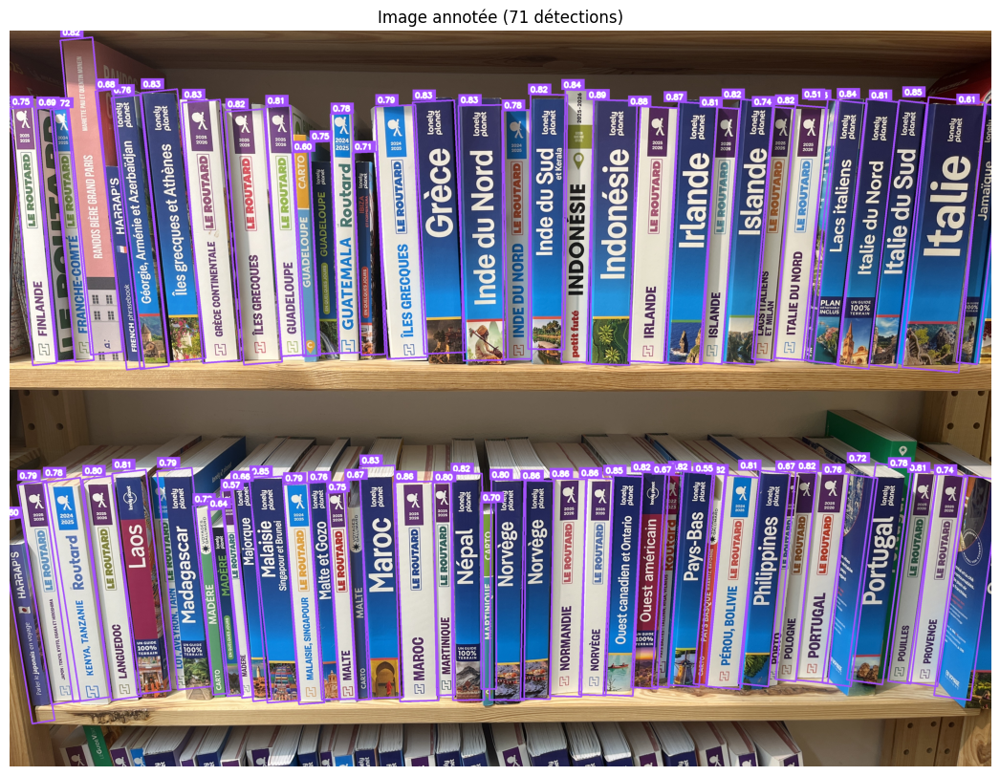

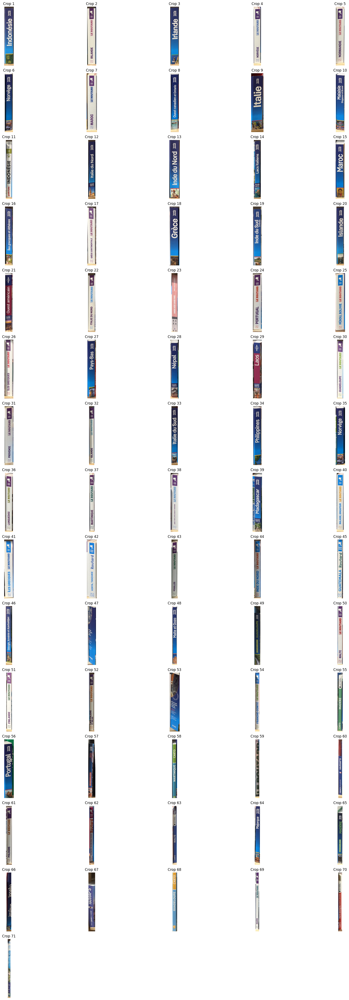

In [34]:
# -*- coding: utf-8 -*-
# ================== IMPORTS ==================
import os, math, json, base64, time, re, unicodedata
import numpy as np
import cv2
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# ---- ajout pour OCR (Scaleway OpenAI-compat) ----
import httpx, certifi
from openai import OpenAI

# ================== CONFIG ==================
MODEL_PATH = "runs/obb/train/weights/best.pt"
IMAGE_PATH = "Images/IMG_4139.JPG"

CONF_THRESHOLD = 0.50
IOU_THRESHOLD  = 0.50

MIN_CROP_SIDE  = 20
PAD_RATIO      = 0.03
OUT_DIR        = "book_crops_out"
os.makedirs(OUT_DIR, exist_ok=True)

# ---- Config OCR (Scaleway) ----
# NOTE: garder un modèle VISION par défaut (pixtral-12b-2409). Les modèles non-vision échoueront.
SCW_MODEL    = os.getenv("SCW_MODEL", "pixtral-12b-2409")
SCW_API_KEY  = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")

# Paramètres techniques OCR
MAX_SIDE     = 1000      # côté max envoyé (limite tokens / latence)
JPEG_QUAL    = 90
BATCH_SIZE   = 3
MAX_TOKENS   = 700
MAX_RETRIES  = 4
BASE_SLEEP   = 1.0

# ================== OCR HELPERS (remplacent l'ancienne partie OCR) ==================
def _to_jpeg_data_url(img_bgr, max_side=MAX_SIDE, quality=JPEG_QUAL) -> str:
    """Encode un ndarray BGR en data URL JPEG base64, en limitant la taille."""
    h, w = img_bgr.shape[:2]
    scale = min(1.0, float(max_side) / max(h, w))
    if scale < 1.0:
        img_bgr = cv2.resize(img_bgr, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
    ok, buf = cv2.imencode(".jpg", img_bgr, [int(cv2.IMWRITE_JPEG_QUALITY), int(quality)])
    if not ok:
        raise RuntimeError("Échec d'encodage JPEG.")
    b64 = base64.b64encode(buf.tobytes()).decode("utf-8")
    return "data:image/jpeg;base64," + b64

def _build_client():
    """Construit le client OpenAI-compat Scaleway (HTTP/1.1 pour fiabilité)."""
    if not SCW_API_KEY:
        print("⚠️  Aucune clé SCW_API_KEY/SCW_SECRET_KEY: OCR désactivé.")
        return None
    http_client = httpx.Client(timeout=45.0, verify=certifi.where(), http2=False)
    return OpenAI(base_url=SCW_BASE_URL, api_key=SCW_API_KEY, http_client=http_client)

def reading_order_key(quad: np.ndarray) -> float:
    """Clé de tri gauche→droite : centre X du quadrilatère (utile si besoin)."""
    return float(quad[:,0].mean())

# ---------- OCR STRUCTURÉ (lots petits + backoff 429) ----------
def ocr_crops_structured(crops_bgr, client: OpenAI, batch_size=3, max_tokens=700, max_retries=4):
    """
    Envoie les crops en lots au modèle vision.
    Renvoie une liste d’objets : {title, author, publisher, full_text, lines} pour chaque crop.
    """
    all_rows = []
    for i in range(0, len(crops_bgr), batch_size):
        pack = crops_bgr[i:i+batch_size]
        content = [{
            "type": "text",
            "text": (
                "Chaque image est la TRANCHE d'un livre. Pour CHACUNE : "
                "1) Transcris toutes les lignes lisibles ('lines': [ ... ]) dans l'ordre vertical. "
                "2) Donne 'full_text' (concaténation raisonnable). "
                "3) Extrait 'title' (titre de l'œuvre) et 'author' (prénom + nom). "
                "4) 'publisher' si identifiable (Seuil, Rivages, Robert Laffont, etc.). "
                # "N'invente rien : mets \"\" si inconnu. "
                "Réponds STRICTEMENT en JSON compact: "
                "{\"results\":[{\"title\":\"\",\"author\":\"\",\"publisher\":\"\",\"full_text\":\"\",\"lines\":[\"...\"]}, ...]} "
                "Même ordre que les images. Pas de commentaires."
            )
        }]
        for cimg in pack:
            content.append({"type":"image_url","image_url":{"url": _to_jpeg_data_url(cimg, MAX_SIDE, JPEG_QUAL)}})

        attempt, sleep_s = 0, BASE_SLEEP
        while True:
            try:
                r = client.chat.completions.create(
                    model=SCW_MODEL,
                    response_format={"type": "json_object"},
                    temperature=0.0,
                    max_tokens=max_tokens,
                    messages=[{"role":"user","content": content}],
                )
                data = json.loads(r.choices[0].message.content or "{}")
                rows = data.get("results", [])
                norm = []
                for obj in rows:
                    norm.append({
                        "title":     (obj.get("title") or "").strip(),
                        "author":    (obj.get("author") or "").strip(),
                        "publisher": (obj.get("publisher") or "").strip(),
                        "full_text": " ".join((obj.get("full_text") or "").split()).strip(),
                        "lines":     [l.strip() for l in (obj.get("lines") or []) if isinstance(l, str)],
                    })
                while len(norm) < len(pack):
                    norm.append({"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]})
                all_rows.extend(norm[:len(pack)])
                break
            except Exception as e:
                msg = str(e).lower()
                if "429" in msg or "rate" in msg or "too many tokens" in msg or "quota" in msg:
                    attempt += 1
                    if attempt > max_retries:
                        all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                        break
                    time.sleep(sleep_s)
                    sleep_s = min(sleep_s * 2, 8.0)
                    continue
                all_rows.extend([{"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]} for _ in pack])
                break
    return all_rows

# ---------- RAFFINAGE LOCAL (séparation Titre / Auteur / Éditeur) ----------
PUBLISHERS = {
    "seuil","robert laffont","rivages","gallimard","grasset","minuit","p.o.l.","actes sud",
    "flammarion","folio","10/18","points","j'ai lu","payot","casterman","le seuil","laffont",
}
def _norm(s: str) -> str:
    s = unicodedata.normalize("NFKD", s or "").encode("ascii", "ignore").decode("ascii")
    return re.sub(r"[^a-z0-9/ +'-]", " ", s.lower()).strip()

def looks_like_author(line: str) -> bool:
    tokens = [t for t in re.findall(r"[A-Za-zÀ-ÖØ-öø-ÿ'-]+", line) if t]
    if not (1 <= len(tokens) <= 5):
        return False
    lower_ok = {"de","du","des","la","le","les","d","l"}
    cap_count = 0
    for t in tokens:
        if t.lower() in lower_ok:
            continue
        if t[0].isupper() or t.isupper():
            cap_count += 1
    return cap_count >= max(1, len(tokens) - 2)

def choose_title(lines, fallback):
    best = ""
    for L in lines:
        Ls = L.strip()
        if 6 <= len(Ls) <= 60 and any(c.islower() for c in Ls):
            if _norm(Ls) not in PUBLISHERS and not any(p in _norm(Ls) for p in PUBLISHERS):
                if len(Ls) > len(best):
                    best = Ls
    return best or fallback

def choose_author(lines, title):
    for L in lines:
        if L.strip() and L.strip() != title and _norm(L) not in PUBLISHERS:
            if looks_like_author(L):
                return L.strip()
    return ""

def refine_book_fields(row):
    lines = row.get("lines") or []
    title = (row.get("title") or "").strip()
    author = (row.get("author") or "").strip()
    publisher = (row.get("publisher") or "").strip()
    full_text = row.get("full_text") or ""

    if not publisher:
        for L in lines:
            n = _norm(L)
            if n in PUBLISHERS:
                publisher = L.strip()
                break

    if not title or _norm(title) in PUBLISHERS:
        title = choose_title(lines, fallback=(title or ""))

    if (not author) or (author.strip() == title.strip()):
        a = choose_author(lines, title)
        if a:
            author = a

    if not title and full_text:
        for cand in re.split(r"[/|·•\n]+", full_text):
            cand = cand.strip()
            if 6 <= len(cand) <= 60 and any(c.islower() for c in cand) and _norm(cand) not in PUBLISHERS:
                title = cand; break

    return {
        "title": title.strip(),
        "author": author.strip(),
        "publisher": publisher.strip(),
        "full_text": full_text.strip(),
        "lines": lines
    }

# ================== GÉOMÉTRIE/CROPS (inchangé) ==================
def order_quad(pts):
    """Ordonne 4 points (x,y) pour former un quadrilatère (tl,tr,br,bl)."""
    pts = np.asarray(pts, dtype=np.float32)
    s = pts.sum(axis=1)
    d = np.diff(pts, axis=1).ravel()
    tl = pts[np.argmin(s)]
    br = pts[np.argmax(s)]
    tr = pts[np.argmin(d)]
    bl = pts[np.argmax(d)]
    quad = np.array([tl, tr, br, bl], dtype=np.float32)
    v1 = quad[1] - quad[0]
    v2 = quad[2] - quad[1]
    if np.cross(v1, v2) < 0:
        quad = np.array([tl, bl, br, tr], dtype=np.float32)
    return quad

def crop_from_quad(image_bgr, quad, pad_ratio=0.0):
    """Redresse et découpe un crop à partir d’un quadrilatère (homographie)."""
    tl, tr, br, bl = quad
    widthA  = np.linalg.norm(br - bl)
    widthB  = np.linalg.norm(tr - tl)
    out_w   = int(max(1, round(max(widthA, widthB))))
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    out_h   = int(max(1, round(max(heightA, heightB))))

    if out_w < MIN_CROP_SIDE or out_h < MIN_CROP_SIDE:
        return None

    pad_w = int(round(out_w * pad_ratio))
    pad_h = int(round(out_h * pad_ratio))
    out_w_pad = out_w + 2 * pad_w
    out_h_pad = out_h + 2 * pad_h

    dst = np.array([[pad_w, pad_h],
                    [pad_w + out_w - 1, pad_h],
                    [pad_w + out_w - 1, pad_h + out_h - 1],
                    [pad_w, pad_h + out_h - 1]], dtype=np.float32)

    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst)
    crop = cv2.warpPerspective(image_bgr, M, (out_w_pad, out_h_pad), flags=cv2.INTER_CUBIC)
    return crop

def obb_to_corners(cx, cy, w, h, angle_deg):
    """Transforme une OBB (cx,cy,w,h,angle) en 4 coins (tl,tr,br,bl)."""
    c = math.cos(math.radians(angle_deg))
    s = math.sin(math.radians(angle_deg))
    dx, dy = w / 2.0, h / 2.0
    corners = np.array([[-dx, -dy], [dx, -dy], [dx, dy], [-dx, dy]], dtype=np.float32)
    R = np.array([[c, -s], [s,  c]], dtype=np.float32)
    rot = corners @ R.T
    rot[:, 0] += cx
    rot[:, 1] += cy
    return order_quad(rot)

# ================== DÉTECTION & ANNOTATION (inchangé) ==================
model = YOLO(MODEL_PATH)
image = cv2.imread(IMAGE_PATH)
if image is None:
    raise FileNotFoundError(f"❌ Impossible de charger l'image : {IMAGE_PATH}")
H, W = image.shape[:2]

results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=IOU_THRESHOLD)
detections = sv.Detections.from_ultralytics(results[0])

oriented_bo_annotator = sv.OrientedBoxAnnotator(thickness=5)
label_annotator       = sv.LabelAnnotator(text_scale=1, text_thickness=5)
image_annotated = oriented_bo_annotator.annotate(scene=image.copy(), detections=detections)
image_annotated = label_annotator.annotate(
    scene=image_annotated,
    detections=detections,
    labels=[f"{conf:0.2f}" for conf in detections.confidence]
)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Conf thr: {CONF_THRESHOLD}, IOU thr: {IOU_THRESHOLD} | Dets: {len(detections)}")
plt.axis('off'); plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "annotated.png"), dpi=200)
plt.close()

# ================== EXTRACTION DES CROPS (inchangé) ==================
keys = list(detections.data.keys())
if "obb" in detections.data:
    data_type = "obb"
    arr = np.asarray(detections.data["obb"], dtype=float)
elif "xyxyxyxy" in detections.data:
    data_type = "xyxyxyxy"
    arr = np.asarray(detections.data["xyxyxyxy"], dtype=float)  # (N,8) ou (N,4,2)
else:
    raise RuntimeError(f"Aucune donnée OBB/coins trouvée. Clés: {keys}")

conf_arr = np.asarray(detections.confidence, dtype=float) if detections.confidence is not None else np.ones((len(detections),), dtype=float)
cls_arr  = np.asarray(detections.class_id) if detections.class_id is not None else np.full((len(detections),), -1)

keep = conf_arr >= CONF_THRESHOLD
idx_keep = np.arange(len(conf_arr))[keep]
conf_arr = conf_arr[keep]
cls_arr  = cls_arr[keep]

crops, titles, quad_list = [], [], []
debug_img = image.copy()

for j, i in enumerate(idx_keep):
    if data_type == "obb":
        cx, cy, w, h, angle = arr[i]
        if max(abs(cx), abs(cy), abs(w), abs(h)) <= 1.2:
            cx *= W; cy *= H; w *= W; h *= H
        quad = obb_to_corners(cx, cy, w, h, angle)
    else:
        if arr.ndim == 2 and arr.shape[1] == 8:
            pts = arr[i].reshape(4, 2)
        elif arr.ndim == 3 and arr.shape[1:] == (4, 2):
            pts = arr[i]
        else:
            raise RuntimeError(f"Format xyxyxyxy inattendu: {arr.shape}")
        pts = pts.astype(float)
        if np.max(np.abs(pts)) <= 1.2:
            pts[:, 0] *= W; pts[:, 1] *= H
        quad = order_quad(pts)

    quad[:, 0] = np.clip(quad[:, 0], 0, W - 1)
    quad[:, 1] = np.clip(quad[:, 1], 0, H - 1)

    crop = crop_from_quad(image, quad, pad_ratio=PAD_RATIO)
    if crop is None or crop.size == 0:
        continue

    crops.append(crop)
    quad_list.append(quad)
    titles.append(f"Det {j+1} | conf={conf_arr[j]:.2f} | cls={int(cls_arr[j])}")
    cv2.imwrite(os.path.join(OUT_DIR, f"det_{j+1:02d}.png"), crop)

cv2.imwrite(os.path.join(OUT_DIR, "debug_quads.png"), debug_img)

# Planche contact (facultatif – inchangé)
if crops:
    widths = [c.shape[1] for c in crops]
    target_w = max(widths)
    rows_for_sheet = []
    for t, c in zip(titles, crops):
        scale = target_w / c.shape[1]
        c2 = cv2.resize(c, (target_w, int(round(c.shape[0] * scale))), interpolation=cv2.INTER_AREA)
        band = np.full((40, target_w, 3), 255, dtype=np.uint8)
        cv2.putText(band, t, (10, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,0), 1, cv2.LINE_AA)
        rows_for_sheet += [band, c2, np.full((20, target_w, 3), 255, dtype=np.uint8)]
    sheet = np.vstack(rows_for_sheet)
    cv2.imwrite(os.path.join(OUT_DIR, "contact_sheet.png"), sheet)

print(f"✅ {len(crops)} crops orientés sauvegardés dans: {OUT_DIR}")
print("ℹ️  Fichiers utiles: annotated.png, debug_quads.png, det_XX.png, contact_sheet.png")

# ================== OCR PAR CROP (NOUVELLE PARTIE : batch + raffinage) ==================
client = _build_client()  # None si pas de clé => OCR désactivé

ocr_summaries = []
if client is None or len(crops) == 0:
    # crée des fichiers vides pour garder la structure
    for k in range(1, len(crops)+1):
        base = os.path.join(OUT_DIR, f"det_{k:02d}")
        data = {"title":"", "author":"", "publisher":"", "full_text":"", "lines":[]}
        with open(base + "_ocr.json", "w", encoding="utf-8") as f:
            json.dump(data, f, ensure_ascii=False, indent=2)
        with open(base + "_ocr.txt", "w", encoding="utf-8") as f:
            f.write("Titre     : (inconnu)\nAuteur    : (inconnu)\nÉditeur   : (inconnu)\nTexte brut: ")
else:
    # 1) OCR structuré en lots
    raw_rows = ocr_crops_structured(crops, client=client,
                                    batch_size=BATCH_SIZE,
                                    max_tokens=MAX_TOKENS,
                                    max_retries=MAX_RETRIES)
    # 2) Raffinage local (titre/auteur/éditeur)
    refined = [refine_book_fields(r) for r in raw_rows]

    # 3) Sauvegarde individuelle par crop (JSON + TXT), et récap console
    for k, r in enumerate(refined, start=1):
        base = os.path.join(OUT_DIR, f"det_{k:02d}")

        # JSON
        with open(base + "_ocr.json", "w", encoding="utf-8") as f:
            json.dump(r, f, ensure_ascii=False, indent=2)

        # TXT lisible
        txt = [
            f"Titre     : {r.get('title') or '(inconnu)'}",
            f"Auteur    : {r.get('author') or '(inconnu)'}",
            f"Éditeur   : {r.get('publisher') or '(inconnu)'}",
            "Lignes lues :",
            *[f"  - {ln}" for ln in (r.get('lines') or [])][:12],
            "",
            f"Texte brut: {r.get('full_text','')[:600]}",
        ]
        with open(base + "_ocr.txt", "w", encoding="utf-8") as f:
            f.write("\n".join(txt))

        ocr_summaries.append(
            f"- Crop {k:02d}: {r.get('title') or '(titre inconnu)'}"
            + (f" — {r.get('author')}" if r.get('author') else "")
        )

# Récap console
print("\n--- Récapitulatif OCR par crop ---")
if not ocr_summaries:
    print("(OCR désactivé ou aucun crop)")
else:
    print("\n".join(ocr_summaries))

# ================== AFFICHAGE MATPLOTLIB (inchangé) ==================
n = len(crops)
cols = 5
rows = (n + cols - 1) // cols

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
plt.title(f"Image annotée ({n} détections)")
plt.axis("off")

plt.figure(figsize=(20, 6 + rows * 3))
for i, crop in enumerate(crops, start=1):
    plt.subplot(rows + 1, cols, i + cols)
    plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    plt.title(f"Crop {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


16:04:49 | INFO | 📚 Chargement du modèle YOLO : runs/obb/train/weights/best.pt
16:04:49 | INFO | 🖼️  Chargement de l'image : Images/IMG_4081.JPG
16:04:49 | INFO | ✅ Image chargée : 4032×3024 pixels
16:04:49 | INFO | 🔍 Détection YOLO (conf=0.5, iou=0.5)
16:04:50 | INFO | ✅ 14 détection(s) trouvée(s)
16:04:50 | INFO | 💾 Image annotée sauvegardée : book_crops_out\annotated.png
16:04:50 | INFO | ✂️  Extraction des crops...
16:04:50 | INFO | 📐 Tri des livres de gauche à droite...
16:04:51 | INFO | ✅ 14 crops sauvegardés dans : book_crops_out
16:04:51 | INFO | ✅ Client OCR initialisé (modèle: pixtral-12b-2409)
16:04:51 | INFO | 🔍 Traitement OCR de 14 crop(s) (batch_size=6)
16:04:51 | INFO | 📦 Batch 1/3 (6 crops)
16:04:51 | INFO | HTTP Request: POST https://api.scaleway.ai/v1/chat/completions "HTTP/1.1 429 Too Many Requests"
16:04:51 | INFO | Retrying request to /chat/completions in 0.461539 seconds
16:04:52 | INFO | HTTP Request: POST https://api.scaleway.ai/v1/chat/completions "HTTP/1.1 429

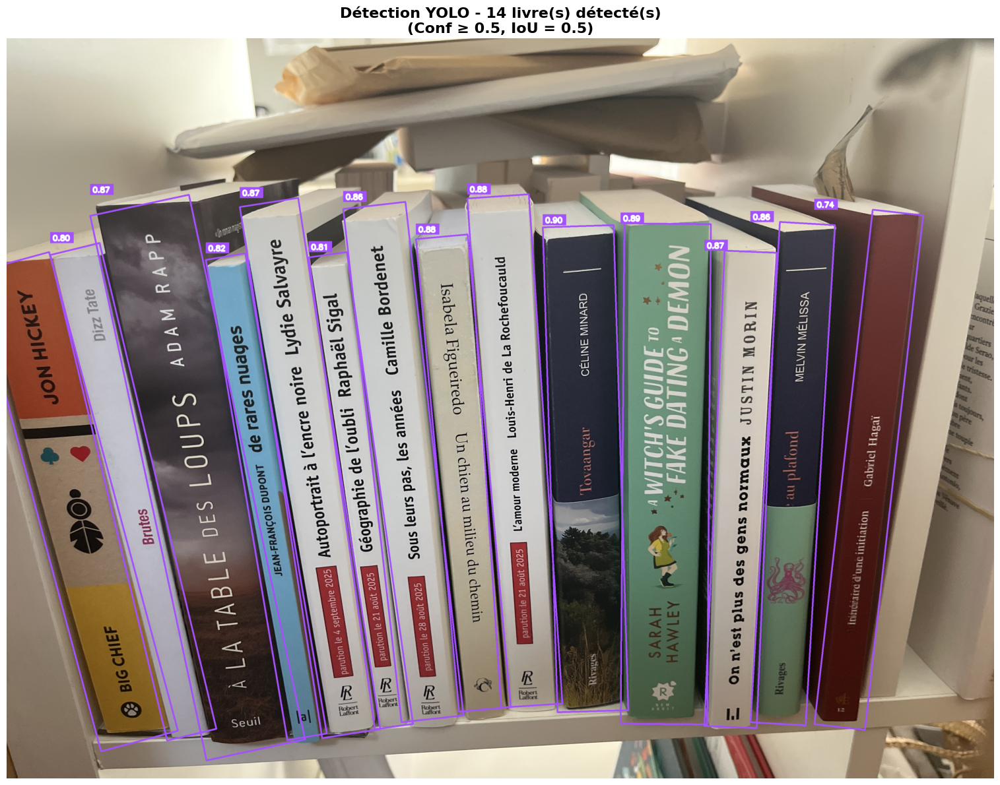

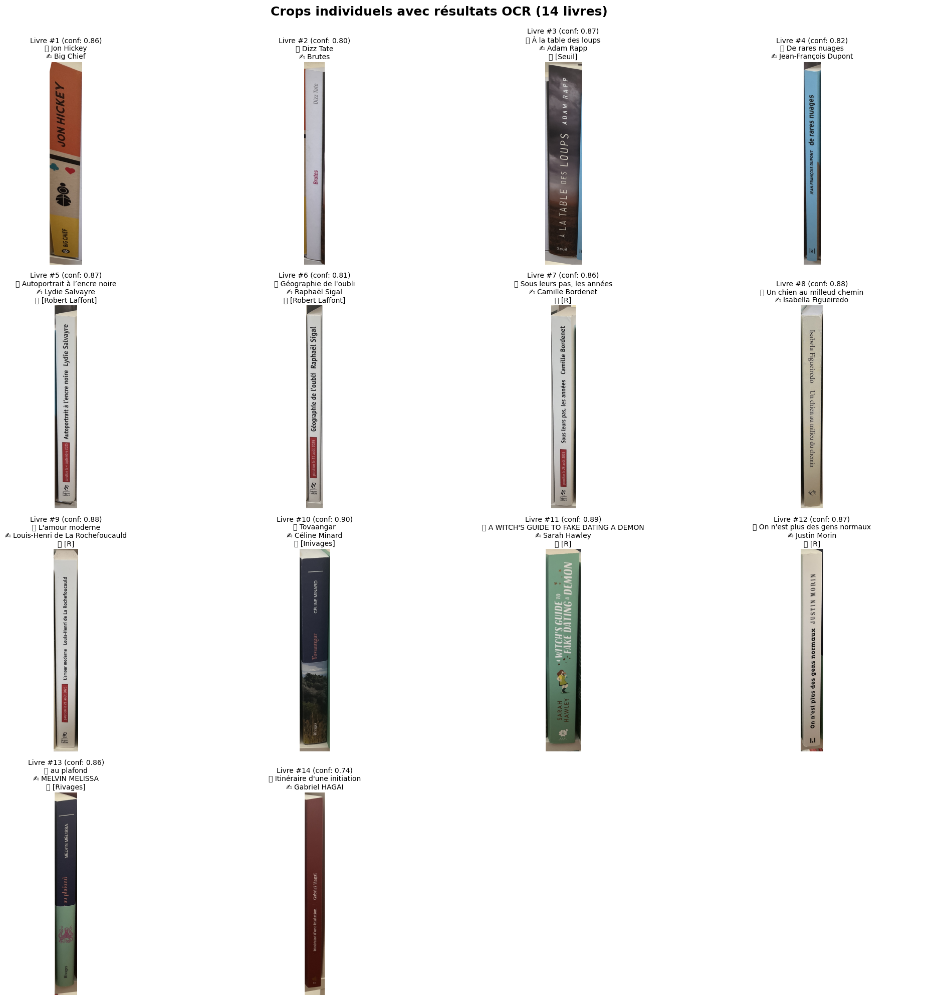


                        📚 RÉCAPITULATIF FINAL                         

#   Titre                                    Auteur                   
----------------------------------------------------------------------
1   Jon Hickey                               Big Chief                
2   Dizz Tate                                Brutes                   
3   À la table des loups                     Adam Rapp                
    └─ [Seuil]                              
4   De rares nuages                          Jean-François Dupont     
5   Autoportrait à l’encre noire             Lydie Salvayre           
    └─ [Robert Laffont]                     
6   Géographie de l'oubli                    Raphaël Sigal            
    └─ [Robert Laffont]                     
7   Sous leurs pas, les années               Camille Bordenet         
    └─ [R]                                  
8   Un chien au milleud chemin               Isabella Figueiredo      
9   L'amour moderne                  

In [50]:
# -*- coding: utf-8 -*-
# ================== IMPORTS ==================
import os
import math
import json
import base64
import time
import logging
from typing import List

import numpy as np
import cv2
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Pour l'OCR Scaleway (compatible OpenAI)
import httpx
import certifi
from openai import OpenAI


# ================== CONFIGURATION DU LOGGING ==================
# Le logging permet de tracer l'exécution du script avec des timestamps
logging.basicConfig(
    level=logging.INFO,                              # Niveau: INFO, WARNING, ERROR
    format='%(asctime)s | %(levelname)s | %(message)s',  # Format des messages
    datefmt='%H:%M:%S'                               # Format de l'heure
)
logger = logging.getLogger(__name__)


# ================== CONFIGURATION PRINCIPALE ==================

# --- Chemins des fichiers ---
MODEL_PATH = "runs/obb/train/weights/best.pt"  # Modèle YOLO entraîné
IMAGE_PATH = "Images/IMG_4081.JPG"             # Image à analyser
OUT_DIR = "book_crops_out"                     # Dossier de sortie
os.makedirs(OUT_DIR, exist_ok=True)            # Créer le dossier s'il n'existe pas

# --- Paramètres de détection YOLO ---
CONF_THRESHOLD = 0.50  # Seuil de confiance minimum (0.0 à 1.0)
                       # Plus bas = plus de détections (mais plus de faux positifs)
                       # Plus haut = moins de détections (mais plus précis)

IOU_THRESHOLD = 0.50   # Seuil IoU pour la suppression des doublons (NMS)
                       # IoU = Intersection over Union
                       # Plus bas = garde plus de boxes qui se chevauchent
                       # Plus haut = élimine plus de doublons

# --- Paramètres de découpe des crops ---
MIN_CROP_SIDE = 20     # Taille minimum d'un crop en pixels (filtrage)
PAD_RATIO = 0.03       # Padding autour des crops (3% = petite marge)

# --- Configuration API Scaleway (OCR) ---
# Ces variables sont lues depuis les variables d'environnement
# Créez un fichier .env avec : SCW_API_KEY=votre_clé_ici
SCW_MODEL = os.getenv("SCW_MODEL", "pixtral-12b-2409")  # Modèle vision de Scaleway
SCW_API_KEY = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")

# --- Paramètres OCR optimisés ---
MAX_SIDE = 1000        # Taille max de l'image avant envoi (économie de tokens)
JPEG_QUALITY = 80      # Qualité JPEG (80% = bon compromis qualité/taille)
BATCH_SIZE = 6         # Nombre de crops traités par requête API
MAX_TOKENS = 1800      # Tokens max par réponse (pour 6 livres)
MAX_RETRIES = 4        # Nombre max de tentatives en cas d'erreur
INTER_BATCH_SLEEP = 2.5  # ✅ AUGMENTÉ : Pause entre batches (évite 429)


# ================== PROMPT OCR OPTIMISÉ ==================
# Ce prompt guide le modèle vision pour extraire les informations des tranches de livres
# Il contient : contexte + instructions précises + exemples + format de sortie

PROMPT_OCR = """Tu es un expert en OCR de tranches de livres français.

CONTEXTE:
- Chaque image montre UNE tranche de livre (texte vertical ou horizontal)
- Le titre est généralement en HAUT ou au CENTRE (texte le plus visible)
- L'auteur est souvent en BAS (format: Prénom NOM ou juste NOM)
- L'éditeur peut être en très petit en bas (ex: "SEUIL", "Gallimard", "Rivages")

INSTRUCTIONS:
Pour CHAQUE image, extrais dans l'ordre:

1. **lines** (array): TOUTES les lignes visibles, de HAUT en BAS
   - Transcris EXACTEMENT ce que tu vois
   - Garde les accents (é, è, à, ô, ç...)
   - Une ligne = un élément du array
   - Si une ligne est illisible, skip-la

2. **title** (string): Le titre principal de l'œuvre
   - Généralement le texte le plus GRAND et VISIBLE
   - Peut être sur plusieurs lignes → concatène-les avec espace
   - NE confonds PAS avec le nom de l'auteur
   - Si vraiment incertain ou illisible, mets ""

3. **author** (string): L'auteur complet
   - Format attendu: "Prénom NOM" (ex: "Adam Rapp", "Lydia Salvayre")
   - Si seulement le nom de famille visible, garde-le
   - Si absent ou illisible, mets ""

4. **publisher** (string): L'éditeur si visible
   - Souvent en TRÈS PETIT (SEUIL, Gallimard, Rivages, P.O.L., etc.)
   - Peut être un logo, transcris le nom textuel
   - Si absent, mets ""

EXEMPLES RÉELS:

Exemple 1 (tranche verticale classique):
Image contient de haut en bas: "LA TABLE | DES LOUPS | Adam Rapp | RIVAGES"
→ {{
  "lines": ["LA TABLE", "DES LOUPS", "Adam Rapp", "RIVAGES"],
  "title": "La Table des Loups",
  "author": "Adam Rapp",
  "publisher": "RIVAGES"
}}

Exemple 2 (auteur manquant):
Image contient: "GÉOGRAPHIE | DE L'OUBLI | SEUIL"
→ {{
  "lines": ["GÉOGRAPHIE", "DE L'OUBLI", "SEUIL"],
  "title": "Géographie de l'Oubli",
  "author": "",
  "publisher": "SEUIL"
}}

Exemple 3 (très dégradé/flou):
Image illisible ou crop vide
→ {{
  "lines": [],
  "title": "",
  "author": "",
  "publisher": ""
}}

RÈGLES IMPORTANTES:
- N'INVENTE RIEN: si incertain → ""
- Garde les MAJUSCULES/minuscules ORIGINALES
- Respecte les ACCENTS français (crucial)
- Si le texte est vertical, lis-le de haut en bas quand même
- Un livre = un objet dans results[]

FORMAT DE RÉPONSE (JSON strict, sans commentaires):
{{
  "results": [
    {{
      "lines": ["ligne1", "ligne2", ...],
      "title": "Titre Exact",
      "author": "Prénom Nom",
      "publisher": "Éditeur"
    }},
    ...
  ]
}}

Traite maintenant les {num_images} images dans l'ordre."""


# ================== FONCTIONS UTILITAIRES ==================

def encode_image_to_base64(img_bgr: np.ndarray) -> str:
    """
    Encode une image BGR (OpenCV) en data URL JPEG base64 pour l'API.
    
    Args:
        img_bgr: Image BGR (format OpenCV)
        
    Returns:
        String data URL (ex: "data:image/jpeg;base64,/9j/4AAQ...")
        
    Optimisations:
    - Resize si trop grande (économie tokens)
    - Compression JPEG avec optimisation Huffman
    """
    h, w = img_bgr.shape[:2]
    
    # Redimensionner si l'image dépasse MAX_SIDE pixels
    scale = min(1.0, float(MAX_SIDE) / max(h, w))
    if scale < 1.0:
        new_w = int(w * scale)
        new_h = int(h * scale)
        img_bgr = cv2.resize(img_bgr, (new_w, new_h), interpolation=cv2.INTER_AREA)
    
    # Encoder en JPEG avec optimisation
    encode_params = [
        int(cv2.IMWRITE_JPEG_QUALITY), JPEG_QUALITY,  # Qualité 80%
        int(cv2.IMWRITE_JPEG_OPTIMIZE), 1              # Optimisation Huffman
    ]
    success, buffer = cv2.imencode(".jpg", img_bgr, encode_params)
    
    if not success:
        raise RuntimeError("❌ Échec d'encodage JPEG")
    
    # Convertir en base64
    b64_string = base64.b64encode(buffer.tobytes()).decode("utf-8")
    
    # Créer la data URL
    data_url = f"data:image/jpeg;base64,{b64_string}"
    
    # Log de la taille (utile pour debug)
    size_kb = len(buffer) / 1024
    logger.debug(f"   Image encodée: {int(w*scale)}×{int(h*scale)}px, {size_kb:.1f} KB")
    
    return data_url


def create_ocr_client():
    """
    Crée un client HTTP pour l'API Scaleway (compatible OpenAI).
    
    Returns:
        Client OpenAI ou None si pas de clé API
        
    Configuration:
    - HTTP/1.1 (plus stable que HTTP/2)
    - Timeout de 60 secondes
    - Vérification SSL avec certifi
    """
    if not SCW_API_KEY:
        logger.warning("⚠️  SCW_API_KEY manquante → OCR désactivé")
        return None
    
    # Client HTTP optimisé
    http_client = httpx.Client(
        timeout=60.0,              # Timeout de 60s (suffisant pour gros batch)
        verify=certifi.where(),    # Certificats SSL
        http2=False,               # HTTP/1.1 plus stable
        limits=httpx.Limits(max_connections=5)  # Limite de connexions
    )
    
    # Client OpenAI pointant vers Scaleway
    client = OpenAI(
        base_url=SCW_BASE_URL,
        api_key=SCW_API_KEY,
        http_client=http_client
    )
    
    logger.info(f"✅ Client OCR initialisé (modèle: {SCW_MODEL})")
    return client


def process_ocr_batch(crops: List[np.ndarray], client: OpenAI) -> List[dict]:
    """
    Traite un batch de crops avec l'API OCR.
    Implémente un système de retry en cas d'erreur 429 (rate limit).
    
    Args:
        crops: Liste d'images BGR
        client: Client OpenAI/Scaleway
        
    Returns:
        Liste de dict {title, author, publisher, lines}
    """
    num_crops = len(crops)
    
    # Construire le message avec prompt + images
    content = [
        {
            "type": "text",
            "text": PROMPT_OCR.format(num_images=num_crops)
        }
    ]
    
    # Ajouter chaque image encodée
    for crop_img in crops:
        data_url = encode_image_to_base64(crop_img)
        content.append({
            "type": "image_url",
            "image_url": {"url": data_url}
        })
    
    # Retry avec backoff exponentiel
    for attempt in range(MAX_RETRIES + 1):
        try:
            # Appel API
            response = client.chat.completions.create(
                model=SCW_MODEL,
                response_format={"type": "json_object"},  # Force JSON
                temperature=0.0,                          # Déterministe
                max_tokens=MAX_TOKENS,
                messages=[{"role": "user", "content": content}]
            )
            
            # Parser la réponse JSON
            raw_json = response.choices[0].message.content or "{}"
            data = json.loads(raw_json)
            results = data.get("results", [])
            
            # Normaliser les résultats
            normalized = []
            for item in results:
                normalized.append({
                    "title": (item.get("title") or "").strip(),
                    "author": (item.get("author") or "").strip(),
                    "publisher": (item.get("publisher") or "").strip(),
                    "lines": [l.strip() for l in item.get("lines", []) if l]
                })
            
            # Compléter avec des résultats vides si manquant
            while len(normalized) < num_crops:
                normalized.append({
                    "title": "", "author": "", "publisher": "", "lines": []
                })
            
            return normalized[:num_crops]
        
        except json.JSONDecodeError as e:
            # Erreur de parsing JSON → pas de retry
            logger.error(f"❌ JSON invalide : {e}")
            break
        
        except Exception as e:
            error_msg = str(e).lower()
            
            # Détecter le type d'erreur
            is_rate_limit = "429" in error_msg or "rate limit" in error_msg
            is_timeout = "timeout" in error_msg
            
            # Rate limit → retry avec pause
            if is_rate_limit and attempt < MAX_RETRIES:
                wait_time = 2.0 * (2 ** attempt)  # Backoff: 2s, 4s, 8s, 16s
                logger.warning(
                    f"⏳ Rate limit 429 (tentative {attempt+1}/{MAX_RETRIES}), "
                    f"attente {wait_time:.1f}s..."
                )
                time.sleep(wait_time)
                continue
            
            # Timeout → retry simple
            if is_timeout and attempt < MAX_RETRIES:
                logger.warning(f"⏳ Timeout (tentative {attempt+1}/{MAX_RETRIES})...")
                time.sleep(2.0)
                continue
            
            # Autre erreur → abandon
            logger.error(f"❌ Erreur API : {e}")
            break
    
    # Échec total → retourner des résultats vides
    logger.error(f"❌ Échec après {MAX_RETRIES} tentatives")
    return [{"title": "", "author": "", "publisher": "", "lines": []} for _ in crops]


def process_all_crops_ocr(crops: List[np.ndarray], client: OpenAI) -> List[dict]:
    """
    Traite tous les crops par batches avec pauses entre chaque batch.
    
    Args:
        crops: Liste complète des crops
        client: Client OCR
        
    Returns:
        Liste complète des résultats OCR
    """
    if not crops:
        return []
    
    total = len(crops)
    all_results = []
    
    logger.info(f"🔍 Traitement OCR de {total} crop(s) (batch_size={BATCH_SIZE})")
    
    # Traiter par batches
    for i in range(0, total, BATCH_SIZE):
        batch = crops[i:i + BATCH_SIZE]
        batch_num = i // BATCH_SIZE + 1
        total_batches = (total + BATCH_SIZE - 1) // BATCH_SIZE
        
        logger.info(f"📦 Batch {batch_num}/{total_batches} ({len(batch)} crops)")
        
        # Traiter le batch
        results = process_ocr_batch(batch, client)
        all_results.extend(results)
        
        # ✅ PAUSE IMPORTANTE : Éviter le rate limit 429
        if i + BATCH_SIZE < total:
            logger.info(f"⏸️  Pause de {INTER_BATCH_SLEEP}s entre batches...")
            time.sleep(INTER_BATCH_SLEEP)
    
    logger.info(f"🎉 OCR terminé : {len(all_results)}/{total} résultats")
    return all_results


# ================== GÉOMÉTRIE (CROPS) ==================

def order_quad_points(pts: np.ndarray) -> np.ndarray:
    """
    Ordonne 4 points pour former un quadrilatère [TL, TR, BR, BL].
    
    Args:
        pts: Array (4, 2) de points non ordonnés
        
    Returns:
        Array (4, 2) de points ordonnés dans le sens horaire
        
    Méthode:
    - Top-Left (TL) = somme min (x+y)
    - Bottom-Right (BR) = somme max (x+y)
    - Top-Right (TR) = différence min (x-y)
    - Bottom-Left (BL) = différence max (x-y)
    """
    pts = np.asarray(pts, dtype=np.float32)
    
    # Calculer somme et différence
    s = pts.sum(axis=1)         # x + y
    d = np.diff(pts, axis=1).ravel()  # x - y
    
    # Identifier les 4 coins
    tl = pts[np.argmin(s)]  # Top-left
    br = pts[np.argmax(s)]  # Bottom-right
    tr = pts[np.argmin(d)]  # Top-right
    bl = pts[np.argmax(d)]  # Bottom-left
    
    quad = np.array([tl, tr, br, bl], dtype=np.float32)
    
    # Vérifier le sens (horaire vs anti-horaire)
    v1 = quad[1] - quad[0]  # Vecteur TL→TR
    v2 = quad[2] - quad[1]  # Vecteur TR→BR
    
    # Produit vectoriel pour détecter le sens
    if np.cross(v1, v2) < 0:
        # Si négatif, inverser l'ordre
        quad = np.array([tl, bl, br, tr], dtype=np.float32)
    
    return quad


def obb_to_corners(cx: float, cy: float, w: float, h: float, angle_deg: float) -> np.ndarray:
    """
    Convertit une OBB (Oriented Bounding Box) en 4 coins.
    
    Args:
        cx, cy: Centre de la box
        w, h: Largeur et hauteur
        angle_deg: Angle de rotation en degrés
        
    Returns:
        Array (4, 2) des 4 coins ordonnés
        
    Méthode:
    1. Créer les 4 coins dans le repère local (centré sur l'origine)
    2. Appliquer la rotation
    3. Translater vers le centre (cx, cy)
    """
    # Convertir angle en radians
    angle_rad = math.radians(angle_deg)
    cos_a = math.cos(angle_rad)
    sin_a = math.sin(angle_rad)
    
    # Demi-dimensions
    dx = w / 2.0
    dy = h / 2.0
    
    # Coins dans le repère local (avant rotation)
    local_corners = np.array([
        [-dx, -dy],  # Top-left
        [ dx, -dy],  # Top-right
        [ dx,  dy],  # Bottom-right
        [-dx,  dy],  # Bottom-left
    ], dtype=np.float32)
    
    # Matrice de rotation 2D
    rotation_matrix = np.array([
        [cos_a, -sin_a],
        [sin_a,  cos_a]
    ], dtype=np.float32)
    
    # Appliquer rotation
    rotated = local_corners @ rotation_matrix.T
    
    # Translater vers le centre
    rotated[:, 0] += cx
    rotated[:, 1] += cy
    
    # Ordonner les points
    return order_quad_points(rotated)


def extract_crop_from_quad(image_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float = 0.0):
    """
    Extrait et redresse un crop à partir d'un quadrilatère via homographie.
    
    Args:
        image_bgr: Image source BGR
        quad: 4 coins du quadrilatère (4, 2)
        pad_ratio: Ratio de padding (ex: 0.03 = 3%)
        
    Returns:
        Crop redressé BGR ou None si trop petit
        
    Méthode:
    1. Calculer les dimensions du rectangle de sortie
    2. Ajouter du padding
    3. Calculer la matrice d'homographie (transformation perspective)
    4. Appliquer warpPerspective
    """
    tl, tr, br, bl = quad
    
    # Calculer la largeur de sortie (moyenne des deux côtés)
    width_top = np.linalg.norm(tr - tl)
    width_bottom = np.linalg.norm(br - bl)
    out_width = int(max(1, round(max(width_top, width_bottom))))
    
    # Calculer la hauteur de sortie
    height_right = np.linalg.norm(tr - br)
    height_left = np.linalg.norm(tl - bl)
    out_height = int(max(1, round(max(height_right, height_left))))
    
    # Filtrer les crops trop petits
    if out_width < MIN_CROP_SIDE or out_height < MIN_CROP_SIDE:
        return None
    
    # Ajouter du padding
    pad_w = int(round(out_width * pad_ratio))
    pad_h = int(round(out_height * pad_ratio))
    out_width_padded = out_width + 2 * pad_w
    out_height_padded = out_height + 2 * pad_h
    
    # Points de destination (rectangle avec padding)
    dst_points = np.array([
        [pad_w, pad_h],
        [pad_w + out_width - 1, pad_h],
        [pad_w + out_width - 1, pad_h + out_height - 1],
        [pad_w, pad_h + out_height - 1]
    ], dtype=np.float32)
    
    # Calculer la matrice d'homographie
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst_points)
    
    # Appliquer la transformation
    crop = cv2.warpPerspective(
        image_bgr, M,
        (out_width_padded, out_height_padded),
        flags=cv2.INTER_CUBIC,           # Interpolation cubique (meilleure qualité)
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(255, 255, 255)      # Fond blanc
    )
    
    return crop


# ================== SCRIPT PRINCIPAL ==================

def main():
    """
    Point d'entrée principal du script.
    
    Étapes:
    1. Charger le modèle YOLO
    2. Charger l'image
    3. Détecter les livres
    4. Extraire les crops
    5. Appliquer l'OCR
    6. Sauvegarder et afficher les résultats
    """
    
    # ========== ÉTAPE 1 : CHARGEMENT DU MODÈLE ==========
    logger.info(f"📚 Chargement du modèle YOLO : {MODEL_PATH}")
    model = YOLO(MODEL_PATH)
    
    # ========== ÉTAPE 2 : CHARGEMENT DE L'IMAGE ==========
    logger.info(f"🖼️  Chargement de l'image : {IMAGE_PATH}")
    image = cv2.imread(IMAGE_PATH)
    
    if image is None:
        logger.error(f"❌ Impossible de charger l'image : {IMAGE_PATH}")
        return
    
    H, W = image.shape[:2]
    logger.info(f"✅ Image chargée : {W}×{H} pixels")
    
    # ========== ÉTAPE 3 : DÉTECTION YOLO ==========
    logger.info(f"🔍 Détection YOLO (conf={CONF_THRESHOLD}, iou={IOU_THRESHOLD})")
    
    results = model.predict(
        IMAGE_PATH,
        conf=CONF_THRESHOLD,
        iou=IOU_THRESHOLD,
        verbose=False  # Pas de logs YOLO
    )
    
    # Convertir en format Supervision (plus pratique)
    detections = sv.Detections.from_ultralytics(results[0])
    logger.info(f"✅ {len(detections)} détection(s) trouvée(s)")
    
    # ========== ÉTAPE 4 : ANNOTATION DE L'IMAGE ==========
    # Créer une copie de l'image avec les boxes dessinées
    
    # Annotateur pour les boxes orientées
    box_annotator = sv.OrientedBoxAnnotator(thickness=5)
    image_annotated = box_annotator.annotate(
        scene=image.copy(),
        detections=detections
    )
    
    # Annotateur pour les labels (confiance)
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=5)
    labels = [f"{conf:.2f}" for conf in detections.confidence]
    image_annotated = label_annotator.annotate(
        scene=image_annotated,
        detections=detections,
        labels=labels
    )
    
    # Sauvegarder l'image annotée
    annotated_path = os.path.join(OUT_DIR, "annotated.png")
    cv2.imwrite(annotated_path, image_annotated)
    logger.info(f"💾 Image annotée sauvegardée : {annotated_path}")
    
    # ========== ÉTAPE 5 : EXTRACTION DES CROPS ==========
    logger.info("✂️  Extraction des crops...")
    
    # Récupérer les données OBB ou coins
    if "obb" in detections.data:
        data_type = "obb"
        data_array = np.asarray(detections.data["obb"], dtype=float)
    elif "xyxyxyxy" in detections.data:
        data_type = "xyxyxyxy"
        data_array = np.asarray(detections.data["xyxyxyxy"], dtype=float)
    else:
        logger.error("❌ Format de détection inconnu")
        return
    
    # Récupérer confiances et classes
    conf_array = np.asarray(detections.confidence, dtype=float)
    class_array = np.asarray(detections.class_id) if detections.class_id is not None else np.full(len(detections), -1)
    
    # Filtrer par confiance
    keep_mask = conf_array >= CONF_THRESHOLD
    indices_keep = np.arange(len(conf_array))[keep_mask]
    
    # Extraire chaque crop
    crops_raw = []  # Liste temporaire avant tri
    
    for j, original_idx in enumerate(indices_keep):
        # Récupérer le quadrilatère
        if data_type == "obb":
            # Format OBB : (cx, cy, w, h, angle)
            cx, cy, w, h, angle = data_array[original_idx]
            
            # Normaliser si nécessaire (valeurs entre 0 et 1)
            if max(abs(cx), abs(cy), abs(w), abs(h)) <= 1.2:
                cx *= W
                cy *= H
                w *= W
                h *= H
            
            quad = obb_to_corners(cx, cy, w, h, angle)
        
        else:
            # Format coins : 8 valeurs ou (4, 2)
            pts = data_array[original_idx]
            if pts.ndim == 1 and len(pts) == 8:
                pts = pts.reshape(4, 2)
            
            # Normaliser si nécessaire
            if np.max(np.abs(pts)) <= 1.2:
                pts[:, 0] *= W
                pts[:, 1] *= H
            
            quad = order_quad_points(pts)
        
        # Clipper dans les limites de l'image
        quad[:, 0] = np.clip(quad[:, 0], 0, W - 1)
        quad[:, 1] = np.clip(quad[:, 1], 0, H - 1)
        
        # Extraire le crop
        crop = extract_crop_from_quad(image, quad, pad_ratio=PAD_RATIO)
        
        if crop is None or crop.size == 0:
            continue  # Ignorer si trop petit
        
        # Calculer le centre X du quadrilatère (pour le tri)
        center_x = float(quad[:, 0].mean())
        
        # Stocker temporairement avec position
        crops_raw.append({
            "crop": crop,
            "quad": quad,
            "center_x": center_x,
            "confidence": conf_array[original_idx],
            "class_id": int(class_array[original_idx])
        })
    
    # ========== TRI PAR POSITION (GAUCHE → DROITE) ==========
    logger.info("📐 Tri des livres de gauche à droite...")
    
    # Trier par position X croissante (gauche → droite)
    crops_raw.sort(key=lambda x: x["center_x"])
    
    # Extraire dans le bon ordre et renuméroter
    crops = []
    crop_infos = []
    
    for new_index, item in enumerate(crops_raw, start=1):
        crop = item["crop"]
        
        # Sauvegarder le crop avec le nouveau numéro
        crop_filename = f"det_{new_index:02d}.png"
        crop_path = os.path.join(OUT_DIR, crop_filename)
        cv2.imwrite(crop_path, crop)
        
        # Stocker
        crops.append(crop)
        crop_infos.append({
            "index": new_index,
            "confidence": item["confidence"],
            "class_id": item["class_id"],
            "filename": crop_filename,
            "position_x": item["center_x"]
        })
    
    logger.info(f"✅ {len(crops)} crops sauvegardés dans : {OUT_DIR}")
    
    # ========== ÉTAPE 6 : OCR (SI DISPONIBLE) ==========
    ocr_results = []
    
    # Créer le client OCR
    ocr_client = create_ocr_client()
    
    if ocr_client is None or len(crops) == 0:
        # OCR désactivé ou pas de crops
        logger.warning("⚠️  OCR désactivé ou aucun crop à traiter")
        ocr_results = [
            {"title": "", "author": "", "publisher": "", "lines": []}
            for _ in crops
        ]
    else:
        # Traiter tous les crops
        ocr_results = process_all_crops_ocr(crops, ocr_client)
    
    # ========== ÉTAPE 7 : SAUVEGARDE DES RÉSULTATS ==========
    logger.info("💾 Sauvegarde des résultats OCR...")
    
    for i, (info, ocr_data) in enumerate(zip(crop_infos, ocr_results)):
        base_path = os.path.join(OUT_DIR, f"det_{info['index']:02d}")
        
        # Sauvegarder JSON
        json_path = base_path + "_ocr.json"
        with open(json_path, "w", encoding="utf-8") as f:
            json.dump(ocr_data, f, ensure_ascii=False, indent=2)
        
        # Sauvegarder TXT lisible
        txt_path = base_path + "_ocr.txt"
        txt_content = [
            f"Détection #{info['index']}",
            f"Confiance : {info['confidence']:.2f}",
            f"",
            f"Titre     : {ocr_data.get('title') or '(inconnu)'}",
            f"Auteur    : {ocr_data.get('author') or '(inconnu)'}",
            f"Éditeur   : {ocr_data.get('publisher') or '(inconnu)'}",
            f"",
            f"Lignes détectées :",
        ]
        
        # Ajouter les lignes (max 15)
        for line in (ocr_data.get('lines') or [])[:15]:
            txt_content.append(f"  - {line}")
        
        with open(txt_path, "w", encoding="utf-8") as f:
            f.write("\n".join(txt_content))
    
    # ========== ÉTAPE 8 : AFFICHAGE MATPLOTLIB ==========
    logger.info("🖼️  Génération de l'affichage...")
    
    # Figure 1 : Image annotée avec les boxes
    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
    plt.title(
        f"Détection YOLO - {len(crops)} livre(s) détecté(s)\n"
        f"(Conf ≥ {CONF_THRESHOLD}, IoU = {IOU_THRESHOLD})",
        fontsize=16,
        fontweight='bold'
    )
    plt.axis('off')
    plt.tight_layout()
    
    # Sauvegarder
    fig1_path = os.path.join(OUT_DIR, "01_detection_annotee.png")
    plt.savefig(fig1_path, dpi=150, bbox_inches='tight')
    plt.show()
    
    # Figure 2 : Grille des crops avec résultats OCR
    if crops:
        n_crops = len(crops)
        cols = min(4, n_crops)  # Maximum 4 colonnes
        rows = (n_crops + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
        fig.suptitle(
            f"Crops individuels avec résultats OCR ({n_crops} livres)",
            fontsize=18,
            fontweight='bold',
            y=0.995
        )
        
        # Convertir axes en liste 1D si nécessaire
        if n_crops == 1:
            axes = [axes]
        elif rows == 1:
            axes = axes
        else:
            axes = axes.flatten()
        
        # Afficher chaque crop
        for i, (crop, info, ocr_data) in enumerate(zip(crops, crop_infos, ocr_results)):
            ax = axes[i]
            
            # Afficher l'image
            ax.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
            
            # Titre avec numéro + confiance
            title_parts = [f"Livre #{info['index']} (conf: {info['confidence']:.2f})"]
            
            # Ajouter infos OCR si disponibles
            if ocr_data.get('title'):
                title_parts.append(f"\n📖 {ocr_data['title']}")
            if ocr_data.get('author'):
                title_parts.append(f"\n✍️ {ocr_data['author']}")
            if ocr_data.get('publisher'):
                title_parts.append(f"\n🏢 [{ocr_data['publisher']}]")
            
            ax.set_title(
                "".join(title_parts),
                fontsize=10,
                ha='center',
                wrap=True
            )
            ax.axis('off')
        
        # Masquer les axes vides
        for i in range(n_crops, len(axes)):
            axes[i].axis('off')
        
        plt.tight_layout()
        
        # Sauvegarder
        fig2_path = os.path.join(OUT_DIR, "02_crops_avec_ocr.png")
        plt.savefig(fig2_path, dpi=150, bbox_inches='tight')
        plt.show()
    
    # ========== ÉTAPE 9 : RÉCAPITULATIF CONSOLE ==========
    print("\n" + "=" * 70)
    print("📚 RÉCAPITULATIF FINAL".center(70))
    print("=" * 70)
    print(f"\n{'#':<3} {'Titre':<40} {'Auteur':<25}")
    print("-" * 70)
    
    for i, (info, ocr_data) in enumerate(zip(crop_infos, ocr_results), 1):
        title = ocr_data.get('title') or '(titre inconnu)'
        author = ocr_data.get('author') or ''
        publisher = ocr_data.get('publisher') or ''
        
        # Tronquer si trop long
        title_display = (title[:37] + "...") if len(title) > 40 else title
        author_display = (author[:22] + "...") if len(author) > 25 else author
        
        # Ligne principale
        print(f"{i:<3} {title_display:<40} {author_display:<25}")
        
        # Éditeur en sous-ligne si présent
        if publisher:
            print(f"    {'└─ [' + publisher + ']':<40}")
    
    print("=" * 70)
    print(f"\n✅ Fichiers sauvegardés dans : {OUT_DIR}/")
    print(f"   - Image annotée : 01_detection_annotee.png")
    print(f"   - Grille crops : 02_crops_avec_ocr.png")
    print(f"   - Crops individuels : det_01.png, det_02.png, ...")
    print(f"   - Résultats OCR : det_01_ocr.json, det_01_ocr.txt, ...")
    print("\n🎉 Traitement terminé avec succès !")
    print("=" * 70 + "\n")


# ================== POINT D'ENTRÉE ==========
if __name__ == "__main__":
    """
    Point d'entrée du script.
    Appelle la fonction main() avec gestion d'erreurs globale.
    """
    try:
        main()
    except KeyboardInterrupt:
        print("\n\n⚠️  Interruption utilisateur (Ctrl+C)")
        logger.warning("Script interrompu par l'utilisateur")
    except Exception as e:
        logger.error(f"❌ Erreur fatale : {e}")
        import traceback
        traceback.print_exc()
        print("\n💡 Vérifiez :")
        print("   - Que MODEL_PATH et IMAGE_PATH sont corrects")
        print("   - Que SCW_API_KEY est configurée (si OCR activé)")
        print("   - Que toutes les dépendances sont installées")

16:02:52 | INFO | 📚 Chargement du modèle YOLO : runs/obb/train/weights/best.pt
16:02:52 | INFO | 🖼️  Chargement de l'image : Images/DSC00370.png
16:02:52 | INFO | ✅ Image chargée : 4240×2384 pixels
16:02:52 | INFO | 🔍 Détection YOLO (conf=0.3, iou=0.5)
16:02:53 | INFO | ✅ 25 détection(s) trouvée(s)
16:02:53 | INFO | ✂️  Extraction des crops...
16:02:53 | INFO | ✅ 25 crops extraits
16:02:53 | INFO | 📐 Tri des livres (gauche→droite)...
16:02:54 | INFO | ✅ 25 crops sauvegardés (ordre: gauche→droite)
16:02:54 | INFO | 🔢 Ajout des numéros d'ordre sur l'image...
16:02:54 | INFO | 💾 Image annotée sauvegardée : book_crops_out\01_detection_annotee.png
16:02:55 | INFO | ✅ Client OCR initialisé (modèle: pixtral-12b-2409)
16:02:55 | INFO | 🔍 Traitement OCR de 25 crop(s) (batch_size=6)
16:02:55 | INFO | 📦 Batch 1/5 (6 crops)
16:02:58 | INFO | HTTP Request: POST https://api.scaleway.ai/v1/chat/completions "HTTP/1.1 200 OK"
16:02:58 | INFO | ⏸️  Pause de 2.5s entre batches...
16:03:00 | INFO | 📦 Batc

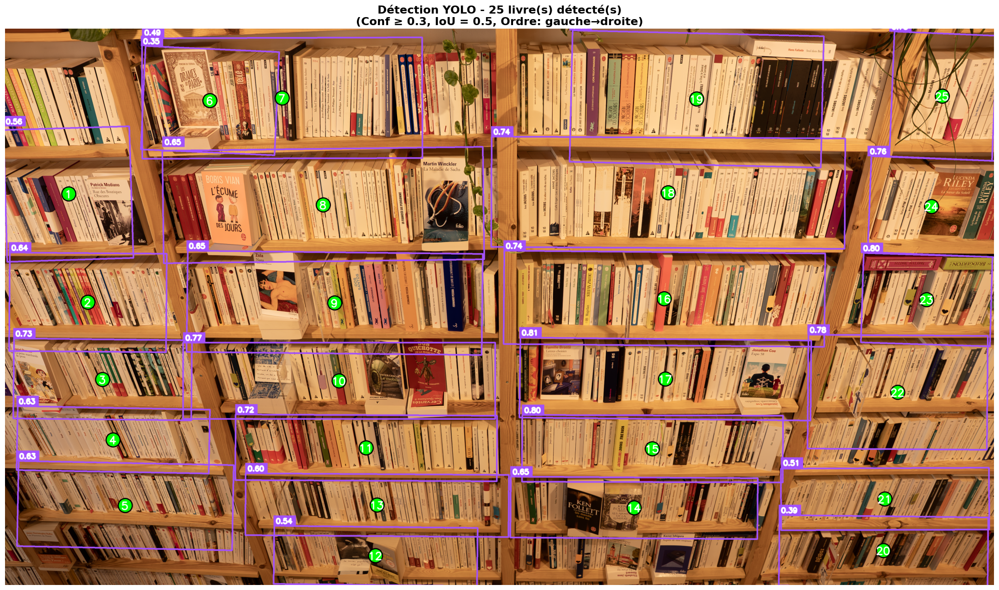


                             📚 RÉCAPITULATIF FINAL                              

#   Titre                                         Auteur                        
--------------------------------------------------------------------------------
1   Rue des Boutiques Obscures                    Patrick Modiano               
2   (titre inconnu)                                                             
3   (titre inconnu)                                                             
4   (titre inconnu)                                                             
5   (titre inconnu)                                                             
6   Les Dramas de Paris                                                         
7   Les Drame du Paris                                                          
8   L'Écume des Jours                             Boris Vian                    
9   Nana                                          Zola                          
10  Don Quichotte de la Ma

In [ ]:
# -*- coding: utf-8 -*-

import os
import math
import json
import base64
import time
import logging
from typing import List

import numpy as np
import cv2
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

import httpx
import certifi
from openai import OpenAI


# ================== LOGGING ==================
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s | %(levelname)s | %(message)s',
    datefmt='%H:%M:%S'
)
logger = logging.getLogger(__name__)


# ================== CONFIGURATION ==================

# Chemins
MODEL_PATH = "runs/obb/train/weights/best.pt"
IMAGE_PATH = "Images/DSC00370.png"
OUT_DIR = "book_crops_out"
os.makedirs(OUT_DIR, exist_ok=True)

# Détection YOLO
CONF_THRESHOLD = 0.30
IOU_THRESHOLD = 0.50

# Crops (MÉTHODE CLASSIQUE)
MIN_CROP_SIDE = 20
PAD_RATIO = 0.03
INTERPOLATION = cv2.INTER_CUBIC

# Ordre de lecture
SORT_LEFT_TO_RIGHT = True

# API Scaleway
SCW_MODEL = os.getenv("SCW_MODEL", "pixtral-12b-2409")
SCW_API_KEY = os.getenv("SCW_API_KEY", "") or os.getenv("SCW_SECRET_KEY", "")
SCW_BASE_URL = os.getenv("SCW_BASE_URL", "https://api.scaleway.ai/v1")

# Paramètres OCR OPTIMISÉS
MAX_SIDE = 1000
JPEG_QUALITY = 85
BATCH_SIZE = 6               # Augmenté
MAX_TOKENS = 1800            # Augmenté
MAX_RETRIES = 4
INTER_BATCH_SLEEP = 2.5      # Pause entre batches


# ================== PROMPT OCR OPTIMISÉ ==================
PROMPT_OCR = """Tu es un expert en OCR de tranches de livres français.

CONTEXTE:
- Chaque image montre UNE tranche de livre (texte vertical ou horizontal)
- Le titre est généralement en HAUT ou au CENTRE (texte le plus visible)
- L'auteur est souvent en BAS (format: Prénom NOM ou juste NOM)
- L'éditeur peut être en très petit en bas (ex: "SEUIL", "Gallimard", "Rivages")

INSTRUCTIONS:
Pour CHAQUE image, extrais dans l'ordre:

1. **lines** (array): TOUTES les lignes visibles, de HAUT en BAS
   - Transcris EXACTEMENT ce que tu vois
   - Garde les accents (é, è, à, ô, ç...)
   - Une ligne = un élément du array
   - Si une ligne est illisible, skip-la

2. **title** (string): Le titre principal de l'œuvre
   - Généralement le texte le plus GRAND et VISIBLE
   - Peut être sur plusieurs lignes → concatène-les avec espace
   - NE confonds PAS avec le nom de l'auteur
   - Si vraiment incertain ou illisible, mets ""

3. **author** (string): L'auteur complet
   - Format attendu: "Prénom NOM" (ex: "Adam Rapp", "Lydia Salvayre")
   - Si seulement le nom de famille visible, garde-le
   - Si absent ou illisible, mets ""

4. **publisher** (string): L'éditeur si visible
   - Souvent en TRÈS PETIT (SEUIL, Gallimard, Rivages, P.O.L., etc.)
   - Peut être un logo, transcris le nom textuel
   - Si absent, mets ""

EXEMPLES RÉELS:

Exemple 1 (tranche verticale classique):
Image contient de haut en bas: "LA TABLE | DES LOUPS | Adam Rapp | RIVAGES"
→ {{
  "lines": ["LA TABLE", "DES LOUPS", "Adam Rapp", "RIVAGES"],
  "title": "La Table des Loups",
  "author": "Adam Rapp",
  "publisher": "RIVAGES"
}}

Exemple 2 (auteur manquant):
Image contient: "GÉOGRAPHIE | DE L'OUBLI | SEUIL"
→ {{
  "lines": ["GÉOGRAPHIE", "DE L'OUBLI", "SEUIL"],
  "title": "Géographie de l'Oubli",
  "author": "",
  "publisher": "SEUIL"
}}

Exemple 3 (très dégradé/flou):
Image illisible ou crop vide
→ {{
  "lines": [],
  "title": "",
  "author": "",
  "publisher": ""
}}

RÈGLES IMPORTANTES:
- N'INVENTE RIEN: si incertain → ""
- Garde les MAJUSCULES/minuscules ORIGINALES
- Respecte les ACCENTS français (crucial)
- Si le texte est vertical, lis-le de haut en bas quand même
- Un livre = un objet dans results[]

FORMAT DE RÉPONSE (JSON strict, sans commentaires):
{{
  "results": [
    {{
      "lines": ["ligne1", "ligne2", ...],
      "title": "Titre Exact",
      "author": "Prénom Nom",
      "publisher": "Éditeur"
    }},
    ...
  ]
}}

Traite maintenant les {num_images} images dans l'ordre."""


# ================== GÉOMÉTRIE (CLASSIQUE) ==================

def order_quad_points(pts: np.ndarray) -> np.ndarray:
    """Ordonne 4 points en [TL, TR, BR, BL]."""
    pts = np.asarray(pts, dtype=np.float32)
    s = pts.sum(axis=1)
    d = np.diff(pts, axis=1).ravel()
    
    tl = pts[np.argmin(s)]
    br = pts[np.argmax(s)]
    tr = pts[np.argmin(d)]
    bl = pts[np.argmax(d)]
    
    quad = np.array([tl, tr, br, bl], dtype=np.float32)
    
    v1 = quad[1] - quad[0]
    v2 = quad[2] - quad[1]
    if np.cross(v1, v2) < 0:
        quad = np.array([tl, bl, br, tr], dtype=np.float32)
    
    return quad


def obb_to_corners(cx: float, cy: float, w: float, h: float, angle_deg: float) -> np.ndarray:
    """Convertit OBB en 4 coins."""
    angle_rad = math.radians(angle_deg)
    cos_a = math.cos(angle_rad)
    sin_a = math.sin(angle_rad)
    
    dx, dy = w / 2.0, h / 2.0
    
    local_corners = np.array([
        [-dx, -dy], [dx, -dy], [dx, dy], [-dx, dy]
    ], dtype=np.float32)
    
    rotation_matrix = np.array([[cos_a, -sin_a], [sin_a, cos_a]], dtype=np.float32)
    rotated = local_corners @ rotation_matrix.T
    rotated[:, 0] += cx
    rotated[:, 1] += cy
    
    return order_quad_points(rotated)


def extract_crop_classic(image_bgr: np.ndarray, quad: np.ndarray, pad_ratio: float = 0.03):
    """
    Extraction de crop CLASSIQUE (méthode originale).
    """
    tl, tr, br, bl = quad
    
    width_top = np.linalg.norm(tr - tl)
    width_bottom = np.linalg.norm(br - bl)
    out_width = int(max(1, round(max(width_top, width_bottom))))
    
    height_right = np.linalg.norm(tr - br)
    height_left = np.linalg.norm(tl - bl)
    out_height = int(max(1, round(max(height_right, height_left))))
    
    if out_width < MIN_CROP_SIDE or out_height < MIN_CROP_SIDE:
        return None
    
    pad_w = int(round(out_width * pad_ratio))
    pad_h = int(round(out_height * pad_ratio))
    out_width_padded = out_width + 2 * pad_w
    out_height_padded = out_height + 2 * pad_h
    
    dst_points = np.array([
        [pad_w, pad_h],
        [pad_w + out_width - 1, pad_h],
        [pad_w + out_width - 1, pad_h + out_height - 1],
        [pad_w, pad_h + out_height - 1]
    ], dtype=np.float32)
    
    M = cv2.getPerspectiveTransform(quad.astype(np.float32), dst_points)
    
    crop = cv2.warpPerspective(
        image_bgr, M,
        (out_width_padded, out_height_padded),
        flags=INTERPOLATION,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(255, 255, 255)
    )
    
    return crop


# ================== OCR ==================

def encode_image_to_base64(img: np.ndarray) -> str:
    """Encode image en data URL (avec conversion grayscale si besoin)."""
    # Si BGR, convertir en grayscale pour économiser tokens
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Reconvertir en BGR pour JPEG
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    
    h, w = img.shape[:2]
    scale = min(1.0, float(MAX_SIDE) / max(h, w))
    if scale < 1.0:
        img = cv2.resize(img, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
    
    encode_params = [
        int(cv2.IMWRITE_JPEG_QUALITY), JPEG_QUALITY,
        int(cv2.IMWRITE_JPEG_OPTIMIZE), 1
    ]
    success, buffer = cv2.imencode(".jpg", img, encode_params)
    
    if not success:
        raise RuntimeError("❌ Échec encodage JPEG")
    
    b64_string = base64.b64encode(buffer.tobytes()).decode("utf-8")
    return f"data:image/jpeg;base64,{b64_string}"


def create_ocr_client():
    """Crée client OCR."""
    if not SCW_API_KEY:
        logger.warning("⚠️  SCW_API_KEY manquante → OCR désactivé")
        return None
    
    http_client = httpx.Client(
        timeout=60.0,
        verify=certifi.where(),
        http2=False,
        limits=httpx.Limits(max_connections=5)
    )
    
    client = OpenAI(
        base_url=SCW_BASE_URL,
        api_key=SCW_API_KEY,
        http_client=http_client
    )
    
    logger.info(f"✅ Client OCR initialisé (modèle: {SCW_MODEL})")
    return client


def process_ocr_batch(crops: List[np.ndarray], client: OpenAI) -> List[dict]:
    """Traite un batch avec retry."""
    num_crops = len(crops)
    
    content = [{"type": "text", "text": PROMPT_OCR.format(num_images=num_crops)}]
    
    for crop_img in crops:
        data_url = encode_image_to_base64(crop_img)
        content.append({"type": "image_url", "image_url": {"url": data_url}})
    
    for attempt in range(MAX_RETRIES + 1):
        try:
            response = client.chat.completions.create(
                model=SCW_MODEL,
                response_format={"type": "json_object"},
                temperature=0.0,
                max_tokens=MAX_TOKENS,
                messages=[{"role": "user", "content": content}]
            )
            
            raw_json = response.choices[0].message.content or "{}"
            data = json.loads(raw_json)
            results = data.get("results", [])
            
            normalized = []
            for item in results:
                normalized.append({
                    "title": (item.get("title") or "").strip(),
                    "author": (item.get("author") or "").strip(),
                    "publisher": (item.get("publisher") or "").strip(),
                    "lines": [l.strip() for l in item.get("lines", []) if l]
                })
            
            while len(normalized) < num_crops:
                normalized.append({"title": "", "author": "", "publisher": "", "lines": []})
            
            return normalized[:num_crops]
        
        except json.JSONDecodeError as e:
            logger.error(f"❌ JSON invalide : {e}")
            break
        
        except Exception as e:
            error_msg = str(e).lower()
            is_rate_limit = "429" in error_msg or "rate limit" in error_msg
            is_timeout = "timeout" in error_msg
            
            if is_rate_limit and attempt < MAX_RETRIES:
                wait_time = 2.0 * (2 ** attempt)
                logger.warning(f"⏳ Rate limit 429 (tentative {attempt+1}/{MAX_RETRIES}), attente {wait_time:.1f}s...")
                time.sleep(wait_time)
                continue
            
            if is_timeout and attempt < MAX_RETRIES:
                logger.warning(f"⏳ Timeout (tentative {attempt+1}/{MAX_RETRIES})...")
                time.sleep(2.0)
                continue
            
            logger.error(f"❌ Erreur API : {e}")
            break
    
    logger.error(f"❌ Échec après {MAX_RETRIES} tentatives")
    return [{"title": "", "author": "", "publisher": "", "lines": []} for _ in crops]


def process_all_crops_ocr(crops: List[np.ndarray], client: OpenAI) -> List[dict]:
    """Traite tous les crops par batches."""
    if not crops:
        return []
    
    total = len(crops)
    all_results = []
    
    logger.info(f"🔍 Traitement OCR de {total} crop(s) (batch_size={BATCH_SIZE})")
    
    for i in range(0, total, BATCH_SIZE):
        batch = crops[i:i + BATCH_SIZE]
        batch_num = i // BATCH_SIZE + 1
        total_batches = (total + BATCH_SIZE - 1) // BATCH_SIZE
        
        logger.info(f"📦 Batch {batch_num}/{total_batches} ({len(batch)} crops)")
        
        results = process_ocr_batch(batch, client)
        all_results.extend(results)
        
        if i + BATCH_SIZE < total:
            logger.info(f"⏸️  Pause de {INTER_BATCH_SLEEP}s entre batches...")
            time.sleep(INTER_BATCH_SLEEP)
    
    logger.info(f"🎉 OCR terminé : {len(all_results)}/{total} résultats")
    return all_results


# ================== SCRIPT PRINCIPAL ==================

def main():
    """Point d'entrée principal."""
    
    # === CHARGEMENT ===
    logger.info(f"📚 Chargement du modèle YOLO : {MODEL_PATH}")
    model = YOLO(MODEL_PATH)
    
    logger.info(f"🖼️  Chargement de l'image : {IMAGE_PATH}")
    image = cv2.imread(IMAGE_PATH)
    
    if image is None:
        logger.error(f"❌ Impossible de charger l'image : {IMAGE_PATH}")
        return
    
    H, W = image.shape[:2]
    logger.info(f"✅ Image chargée : {W}×{H} pixels")
    
    # === DÉTECTION ===
    logger.info(f"🔍 Détection YOLO (conf={CONF_THRESHOLD}, iou={IOU_THRESHOLD})")
    results = model.predict(IMAGE_PATH, conf=CONF_THRESHOLD, iou=IOU_THRESHOLD, verbose=False)
    detections = sv.Detections.from_ultralytics(results[0])
    logger.info(f"✅ {len(detections)} détection(s) trouvée(s)")
    
    # === ANNOTATION ===
    box_annotator = sv.OrientedBoxAnnotator(thickness=5)
    image_annotated = box_annotator.annotate(scene=image.copy(), detections=detections)
    
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=5)
    labels = [f"{conf:.2f}" for conf in detections.confidence]
    image_annotated = label_annotator.annotate(scene=image_annotated, detections=detections, labels=labels)
    
    # === EXTRACTION CROPS ===
    logger.info("✂️  Extraction des crops...")
    
    if "obb" in detections.data:
        data_type = "obb"
        data_array = np.asarray(detections.data["obb"], dtype=float)
    elif "xyxyxyxy" in detections.data:
        data_type = "xyxyxyxy"
        data_array = np.asarray(detections.data["xyxyxyxy"], dtype=float)
    else:
        logger.error("❌ Format de détection inconnu")
        return
    
    conf_array = np.asarray(detections.confidence, dtype=float)
    class_array = np.asarray(detections.class_id) if detections.class_id is not None else np.full(len(detections), -1)
    
    keep_mask = conf_array >= CONF_THRESHOLD
    indices_keep = np.arange(len(conf_array))[keep_mask]
    
    crops_raw = []
    
    for j, original_idx in enumerate(indices_keep):
        if data_type == "obb":
            cx, cy, w, h, angle = data_array[original_idx]
            if max(abs(cx), abs(cy), abs(w), abs(h)) <= 1.2:
                cx *= W; cy *= H; w *= W; h *= H
            quad = obb_to_corners(cx, cy, w, h, angle)
        else:
            pts = data_array[original_idx]
            if pts.ndim == 1 and len(pts) == 8:
                pts = pts.reshape(4, 2)
            if np.max(np.abs(pts)) <= 1.2:
                pts[:, 0] *= W; pts[:, 1] *= H
            quad = order_quad_points(pts)
        
        quad[:, 0] = np.clip(quad[:, 0], 0, W - 1)
        quad[:, 1] = np.clip(quad[:, 1], 0, H - 1)
        
        crop = extract_crop_classic(image, quad, pad_ratio=PAD_RATIO)
        
        if crop is None or crop.size == 0:
            continue
        
        center_x = float(quad[:, 0].mean())
        
        crops_raw.append({
            "crop": crop,
            "quad": quad,
            "center_x": center_x,
            "confidence": conf_array[original_idx],
            "class_id": int(class_array[original_idx])
        })
    
    logger.info(f"✅ {len(crops_raw)} crops extraits")
    
    # === TRI ===
    direction = "gauche→droite" if SORT_LEFT_TO_RIGHT else "droite→gauche"
    logger.info(f"📐 Tri des livres ({direction})...")
    crops_raw.sort(key=lambda x: x["center_x"], reverse=not SORT_LEFT_TO_RIGHT)
    
    # === SAUVEGARDE CROPS ===
    crops = []
    crop_infos = []
    
    for new_index, item in enumerate(crops_raw, start=1):
        crop_path = os.path.join(OUT_DIR, f"det_{new_index:02d}.png")
        cv2.imwrite(crop_path, item["crop"])
        
        crops.append(item["crop"])
        crop_infos.append({
            "index": new_index,
            "confidence": item["confidence"],
            "class_id": item["class_id"],
            "position_x": item["center_x"],
            "quad": item["quad"]
        })
    
    logger.info(f"✅ {len(crops)} crops sauvegardés (ordre: {direction})")
    
    # === NUMÉROS SUR L'IMAGE ===
    logger.info("🔢 Ajout des numéros d'ordre sur l'image...")
    
    for info in crop_infos:
        quad = info["quad"]
        center = quad.mean(axis=0).astype(int)
        
        cv2.circle(image_annotated, tuple(center), 30, (0, 255, 0), -1)
        cv2.circle(image_annotated, tuple(center), 30, (0, 0, 0), 3)
        
        text = str(info["index"])
        font = cv2.FONT_HERSHEY_SIMPLEX  # ✅ CORRIGÉ (BOLD n'existe pas)
        font_scale = 1.5  # Augmenté pour compenser
        thickness = 4     # Augmenté pour effet "gras"
        
        text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
        text_x = center[0] - text_size[0] // 2
        text_y = center[1] + text_size[1] // 2
        
        cv2.putText(image_annotated, text, (text_x, text_y), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)
    
    annotated_path = os.path.join(OUT_DIR, "01_detection_annotee.png")
    cv2.imwrite(annotated_path, image_annotated)
    logger.info(f"💾 Image annotée sauvegardée : {annotated_path}")
    
    # === OCR ===
    ocr_client = create_ocr_client()
    
    if ocr_client is None or len(crops) == 0:
        logger.warning("⚠️  OCR désactivé ou aucun crop")
        ocr_results = [{"title": "", "author": "", "publisher": "", "lines": []} for _ in crops]
    else:
        ocr_results = process_all_crops_ocr(crops, ocr_client)
    
    # === SAUVEGARDE RÉSULTATS ===
    logger.info("💾 Sauvegarde des résultats OCR...")
    
    for i, (info, ocr_data) in enumerate(zip(crop_infos, ocr_results)):
        base_path = os.path.join(OUT_DIR, f"det_{info['index']:02d}")
        
        # JSON
        with open(base_path + "_ocr.json", "w", encoding="utf-8") as f:
            json.dump(ocr_data, f, ensure_ascii=False, indent=2)
        
        # TXT
        txt_content = [
            f"=== LIVRE #{info['index']} ===",
            f"",
            f"Confiance : {info['confidence']:.2f}",
            f"Position  : {info['position_x']:.0f}px",
            f"",
            f"Titre     : {ocr_data.get('title') or '(inconnu)'}",
            f"Auteur    : {ocr_data.get('author') or '(inconnu)'}",
            f"Éditeur   : {ocr_data.get('publisher') or '(inconnu)'}",
            f"",
            f"Lignes détectées :",
        ]
        
        for line in (ocr_data.get('lines') or [])[:15]:
            txt_content.append(f"  • {line}")
        
        with open(base_path + "_ocr.txt", "w", encoding="utf-8") as f:
            f.write("\n".join(txt_content))
    
    # === AFFICHAGE IMAGE ANNOTÉE ===
    logger.info("🖼️  Affichage de l'image annotée...")
    
    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(image_annotated, cv2.COLOR_BGR2RGB))
    plt.title(
        f"Détection YOLO - {len(crops)} livre(s) détecté(s)\n"
        f"(Conf ≥ {CONF_THRESHOLD}, IoU = {IOU_THRESHOLD}, Ordre: {direction})",
        fontsize=16,
        fontweight='bold'
    )
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # === RÉCAPITULATIF FINAL ===
    print("\n" + "=" * 80)
    print("📚 RÉCAPITULATIF FINAL".center(80))
    print("=" * 80)
    print(f"\n{'#':<3} {'Titre':<45} {'Auteur':<30}")
    print("-" * 80)
    
    for i, (info, ocr_data) in enumerate(zip(crop_infos, ocr_results), 1):
        title = ocr_data.get('title') or '(titre inconnu)'
        author = ocr_data.get('author') or ''
        publisher = ocr_data.get('publisher') or ''
        
        title_display = (title[:42] + "...") if len(title) > 45 else title
        author_display = (author[:27] + "...") if len(author) > 30 else author
        
        print(f"{i:<3} {title_display:<45} {author_display:<30}")
        
        if publisher:
            print(f"    {'└─ [' + publisher + ']':<45}")
    
    print("=" * 80)
    print(f"\n✅ Fichiers sauvegardés dans : {OUT_DIR}/")
    print(f"   - 01_detection_annotee.png  (Image avec boxes + numéros)")
    print(f"   - det_01.png, det_02.png... (Crops individuels)")
    print(f"   - det_01_ocr.json...        (Résultats OCR)")
    print(f"   - det_01_ocr.txt...         (Résultats lisibles)")
    
    print("\n🎉 Traitement terminé avec succès !")
    print("=" * 80 + "\n")


if __name__ == "__main__":
    try:
        main()
    except KeyboardInterrupt:
        print("\n\n⚠️  Interruption utilisateur (Ctrl+C)")
        logger.warning("Script interrompu par l'utilisateur")
    except Exception as e:
        logger.error(f"❌ Erreur fatale : {e}")
        import traceback
        traceback.print_exc()
        print("\n💡 Vérifiez :")
        print("   - MODEL_PATH et IMAGE_PATH corrects")
        print("   - SCW_API_KEY configurée")
        print("   - Dépendances installées")